In [2]:
import pandas as pd
import numpy as np
from pandas import Series, DataFrame

In [6]:
!cat earthquakes/EMEC_data.txt

# Creation Date: Thu May 10 07:58:28 2018
# Data from the EMEC Catalogue (Gruenthal, G. & Wahlstroem, R., 2012)
# Contact address: ggrue@gfz-potsdam.de
# For technical questions: lemgo@gfz-potsdam.de
------------------------------------------------------------------------------------------------
# Indices at original magnitudes M_orig: w for Mw or Mo, L for ML, S for MS, b for mb, d for Md.
# The focal depth is given in km.
------------------------------------------------------------------------------------------------
# Requested data:
# Coordinate Range Lat: 30/44 Lon: -5/36
# Time: 1000 - 2006
# File Format:
year;month;day;hour;minute;latitude;longitude;depth;intensity;M_orig;type;Mw ;Mw_err;reference
 1005 ;     ;   ;    ;      ;  43.46 ;   11.88 ;     ;     6.5 ;   4.9;  w ;4.9; 0.34 ;  CPTI08
 1005 ;     ;   ;    ;      ;  41.49 ;   13.81 ;     ;     7.5 ;   5.4;  w ;5.4;  0.3 ;  CPTI04
 1010 ;    1;  8;    ;      ;  40.60 ;   27.00 ;     ;       9 ;   7.4;  w ;7.4;  0.5 ;     Pa

 1916 ;   11; 28;  22;     5;  38.57 ;   -0.95 ;     ;       7 ;      ;    ;5.2;      ;   IGN10
 1917 ;    1; 12;  23;    52;  36.63 ;   -3.67 ;     ;       6 ;      ;    ;4.6;      ;   IGN10
 1917 ;    1; 24;   9;      ;  41.40 ;   21.60 ;    5;         ;   3.8;  L ;4.0;      ;     Gla
 1917 ;    1; 25;  10;     5;  41.20 ;   20.70 ;     ;       7 ;   4.7;  L ;4.4;      ;     HHM
 1917 ;    1; 28;  22;    32;  38.03 ;   -1.27 ;     ;       7 ;      ;    ;5.2;      ;   IGN10
 1917 ;    2; 18;  20;    10;  38.70 ;   13.17 ;     ;       6 ;   4.8;  w ;4.8; 0.34 ;  CPTI08
 1917 ;    2; 22;   4;    58;  42.80 ;   18.00 ;    7;     6.5 ;   4.6;  L ;4.3;      ;     HHM
 1917 ;    2; 23;  17;    57;  42.30 ;   17.80 ;   15;         ;   4.5;  L ;4.2;      ;     HHM
 1917 ;    2; 27;  17;    47;  36.53 ;    9.00 ;     ;       6 ;      ;    ;4.6;      ;   HPP10
 1917 ;    3; 14;  18;    13;  39.90 ;   20.25 ;   17;       7 ;   5.3;  S ;5.4;      ;     Sul
 1917 ;    3; 21;   0;    30;  42.90 ;  

 1951 ;    7; 30;  13;    59;  38.90 ;   23.30 ;     ;     5.5 ;   4.5;  w ;4.5; 0.25 ;     Pap
 1951 ;    8;  1;   6;    26;  38.90 ;   23.30 ;     ;       6 ;   4.5;  w ;4.5; 0.25 ;     Pap
 1951 ;    8;  1;  12;    50;  42.70 ;   13.20 ;     ;         ;   4.6;  w ;4.6; 0.37 ;  CPTI08
 1951 ;    8;  8;   8;    40;  36.04 ;   31.14 ;     ;         ;   5.3;  w ;5.3;      ;     Pou
 1951 ;    8;  8;  19;    56;  42.70 ;   13.55 ;     ;     6.5 ;   5.2;  w ;5.2; 0.25 ;  CPTI08
 1951 ;    8; 13;  18;    33;  40.88 ;   32.87 ;   10;         ;   6.6;  w ;6.6;      ;   KOERI
 1951 ;    8; 13;  22;    58;  41.09 ;   33.27 ;   80;         ;   4.9;  w ;4.9;      ;   KOERI
 1951 ;    8; 14;  18;    46;  41.08 ;   33.18 ;   40;         ;   5.2;  w ;5.2;      ;   KOERI
 1951 ;    8; 14;  18;    49;  38.90 ;   23.30 ;     ;       6 ;   4.5;  w ;4.5; 0.25 ;     Pap
 1951 ;    8; 14;  20;    23;  40.82 ;   33.23 ;   10;         ;   4.9;  w ;4.9;      ;   KOERI
 1951 ;    8; 20;  22;    51;  34.70 ;  

 1963 ;    2; 22;   2;    47;  32.60 ;   21.00 ;     ;         ;   4.3;  b ;4.4;      ;     AMA
 1963 ;    2; 22;  14;    12;  40.20 ;   20.00 ;   15;       7 ;   5.2;  S ;5.3;      ;     Sul
 1963 ;    3;  4;  15;    10;  34.90 ;   25.20 ;   39;       6 ;   5.3;  w ;5.3; 0.25 ;     Pap
 1963 ;    3;  5;   7;    53;  35.70 ;   25.90 ;  100;       4 ;   4.5;  w ;4.5; 0.25 ;     Pap
 1963 ;    3; 11;   7;    27;  37.96 ;   29.14 ;   40;         ;   5.6;  w ;5.6;      ;   KOERI
 1963 ;    3; 12;   9;     2;  40.00 ;   22.00 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1963 ;    3; 14;  15;      ;  36.20 ;    6.10 ;     ;     6.5 ;      ;    ;4.9;      ;   HPP10
 1963 ;    3; 17;  14;    17;  39.30 ;   20.90 ;   41;     6.5 ;     5;  w ;5.0; 0.25 ;     Pap
 1963 ;    3; 18;  14;    15;  38.90 ;   21.90 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1963 ;    3; 22;  22;    28;  34.80 ;   33.00 ;   10;         ;     5;  w ;5.0;      ;     Pou
 1963 ;    3; 29;   3;     9;  40.29 ;  

 1968 ;    3; 23;  21;    13;  39.77 ;   25.56 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1968 ;    3; 23;  21;    52;  39.75 ;   25.30 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1968 ;    3; 24;   9;    23;  39.74 ;   25.46 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1968 ;    3; 24;   9;    53;  38.44 ;   21.66 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1968 ;    3; 24;  13;    22;  40.00 ;   25.40 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1968 ;    3; 26;  12;    34;  39.94 ;   25.55 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1968 ;    3; 26;  15;    18;  39.59 ;   25.52 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1968 ;    3; 26;  17;     9;  39.57 ;   25.46 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1968 ;    3; 26;  19;    37;  34.08 ;   35.47 ;   37;         ;   5.1;  w ;5.1;      ;     Pou
 1968 ;    3; 27;   5;    16;  39.78 ;   25.44 ;     ;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1968 ;    3; 27;  22;    16;  34.70 ;  

 1970 ;    7;  3;   0;    41;  38.73 ;   20.59 ;     ;       4 ;     5;  w ;5.0; 0.25 ;     Pap
 1970 ;    7;  3;   3;    40;  38.00 ;   22.10 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1970 ;    7;  3;   3;    47;  38.66 ;   20.20 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1970 ;    7;  3;   7;    24;  38.61 ;   20.30 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1970 ;    7;  3;  23;    24;  38.60 ;   19.90 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1970 ;    7;  4;   1;    36;  38.60 ;   20.40 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1970 ;    7;  4;   4;    55;  39.09 ;   28.80 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1970 ;    7;  4;   5;     2;  38.66 ;   20.20 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1970 ;    7;  4;  15;    27;  38.30 ;   20.40 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1970 ;    7;  4;  17;    32;  35.81 ;   24.46 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1970 ;    7;  9;   8;    29;  38.89 ;  

 1973 ;    1;  5;   7;    28;  35.82 ;   21.84 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1973 ;    1;  5;   7;    44;  35.66 ;   21.76 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1973 ;    1;  5;  19;    12;  35.57 ;   21.81 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1973 ;    1;  6;  17;    42;  35.74 ;   21.60 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1973 ;    1;  9;  22;     3;  38.23 ;   20.40 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1973 ;    1; 10;   3;    24;  37.74 ;   21.36 ;   46;     7.5 ;   5.1;  w ;5.1; 0.25 ;     Pap
 1973 ;    1; 13;  23;    12;  36.29 ;   26.78 ;     ;         ;   4.7;  w ;4.7; 0.25 ;     Pap
 1973 ;    1; 14;  13;    28;  37.10 ;   21.00 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1973 ;    1; 16;  22;    45;  35.06 ;   22.48 ;   36;         ;   4.9;  w ;4.9; 0.25 ;     Pap
 1973 ;    1; 19;  15;    52;  38.14 ;   20.29 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1973 ;    1; 23;  11;    46;  34.75 ;  

 1975 ;    5; 19;   3;    26;  38.37 ;   22.35 ;   16;     5.5 ;     5;  w ;5.0; 0.25 ;     Pap
 1975 ;    5; 19;  23;    25;  39.51 ;   19.93 ;     ;     5.5 ;   4.5;  w ;4.5; 0.25 ;     Pap
 1975 ;    5; 20;  17;    55;  40.24 ;   25.25 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1975 ;    5; 23;   2;    29;  36.52 ;   26.41 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1975 ;    5; 30;   5;    13;  39.12 ;   27.67 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1975 ;    5; 30;  14;    22;  38.75 ;   27.60 ;     ;         ;   4.7;  w ;4.7; 0.25 ;     Pap
 1975 ;    5; 31;   5;    36;  36.20 ;   28.92 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1975 ;    5; 31;  12;    41;  36.74 ;   28.23 ;   34;         ;   4.2;  w ;4.2;      ;   KOERI
 1975 ;    6;  2;   3;    19;  36.65 ;   26.61 ;    7;         ;   4.7;  w ;4.7; 0.25 ;     Pap
 1975 ;    6;  2;   3;    27;  36.56 ;   26.58 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1975 ;    6;  2;  15;    26;  38.67 ;  

 1977 ;   10; 12;  10;    14;  39.33 ;   21.65 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1977 ;   10; 12;  20;    37;  35.01 ;   23.43 ;   67;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1977 ;   10; 14;  14;    10;  37.37 ;   31.93 ;   10;         ;   4.2;  w ;4.2;      ;   KOERI
 1977 ;   10; 15;   0;    33;  34.71 ;   22.95 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1977 ;   10; 15;  13;    24;  36.50 ;   25.78 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1977 ;   10; 17;  15;    16;  35.46 ;   27.69 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1977 ;   10; 18;  14;    43;  34.51 ;   23.96 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1977 ;   10; 19;  12;    52;  38.44 ;   21.84 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1977 ;   10; 19;  14;    14;  39.01 ;   29.62 ;   10;         ;   4.2;  w ;4.2;      ;   KOERI
 1977 ;   10; 19;  21;    29;  34.33 ;   24.85 ;     ;         ;   4.7;  w ;4.7; 0.25 ;     Pap
 1977 ;   10; 21;   0;    57;  37.14 ;  

 1979 ;    6; 17;  18;    59;  38.74 ;   26.50 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1979 ;    6; 17;  23;     8;  38.72 ;   26.61 ;     ;         ;   4.9;  w ;4.9;      ;   KOERI
 1979 ;    6; 18;   3;    25;  38.68 ;   26.59 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1979 ;    6; 18;   3;    39;  38.71 ;   26.54 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1979 ;    6; 18;   4;    53;  40.53 ;   23.15 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1979 ;    6; 18;   9;    12;  38.77 ;   26.61 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1979 ;    6; 18;  19;    36;  38.68 ;   26.61 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1979 ;    6; 19;  23;     9;  38.64 ;   26.61 ;   21;         ;   4.9;  w ;4.9;      ;   KOERI
 1979 ;    6; 20;   0;     9;  37.20 ;   -3.50 ;   60;         ;   4.5;  S ;5.1;      ;   BUM91
 1979 ;    6; 20;  10;    44;  37.83 ;   20.84 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1979 ;    6; 20;  17;    50;  33.00 ;  

 1981 ;    1;  7;  16;    35;  40.47 ;   19.68 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1981 ;    1;  7;  20;    37;  34.71 ;   25.38 ;   67;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1981 ;    1;  8;  10;    17;  34.87 ;   23.94 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1981 ;    1;  8;  22;    49;  37.95 ;   20.13 ;     ;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1981 ;    1;  9;   0;    12;  40.64 ;   15.80 ;     ;         ;   4.5;  w ;4.5; 0.22 ;  CPTI08
 1981 ;    1;  9;  14;    17;  39.69 ;   20.04 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1981 ;    1;  9;  18;    27;  38.96 ;   20.38 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1981 ;    1; 11;  21;    37;  38.86 ;   26.01 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1981 ;    1; 13;  20;    22;  38.69 ;   25.34 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1981 ;    1; 14;  17;    46;  38.76 ;   22.60 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1981 ;    1; 15;   4;    25;  36.40 ;  

 1981 ;    7;  9;  13;    32;  38.26 ;   20.59 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1981 ;    7;  9;  20;    40;  39.51 ;   19.76 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1981 ;    7;  9;  22;    48;  37.90 ;   20.34 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1981 ;    7;  9;  23;    21;  37.91 ;   20.40 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1981 ;    7; 10;   0;    27;  39.46 ;   20.68 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1981 ;    7; 10;   4;    28;  38.18 ;   20.66 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1981 ;    7; 10;   9;    47;  38.71 ;   19.86 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1981 ;    7; 10;  20;    43;  39.89 ;   23.81 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1981 ;    7; 10;  23;    52;  38.20 ;   20.45 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1981 ;    7; 11;   0;    50;  38.07 ;   19.97 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1981 ;    7; 11;   3;    53;  37.89 ;  

 1982 ;    4; 26;   6;    42;  37.65 ;   21.53 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1982 ;    4; 26;   8;    49;  37.63 ;   21.47 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1982 ;    4; 26;   9;    32;  37.65 ;   21.51 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1982 ;    4; 26;  15;    58;  37.09 ;   28.50 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1982 ;    4; 26;  19;    22;  37.69 ;   21.53 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1982 ;    4; 26;  22;    35;  38.64 ;   26.86 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1982 ;    4; 27;  10;     2;  37.68 ;   21.54 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1982 ;    4; 27;  22;    47;  34.86 ;   22.53 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1982 ;    4; 28;   8;    43;  39.90 ;   24.49 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1982 ;    4; 28;  16;    55;  37.67 ;   21.56 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1982 ;    4; 29;   1;    58;  40.64 ;  

 1983 ;    2; 16;  16;    17;  38.66 ;   27.53 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1983 ;    2; 16;  16;    50;  37.98 ;   20.26 ;   40;         ;   4.7;  w ;4.7; 0.25 ;     Pap
 1983 ;    2; 16;  21;    30;  38.18 ;   20.33 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1983 ;    2; 17;   0;    22;  39.05 ;   28.70 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1983 ;    2; 17;   9;    12;  37.07 ;   26.28 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1983 ;    2; 18;  16;    36;  38.11 ;   20.21 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1983 ;    2; 19;  15;    55;  37.09 ;   21.42 ;     ;       6 ;   4.5;  w ;4.5; 0.25 ;     Pap
 1983 ;    2; 19;  23;    46;  37.90 ;   20.17 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1983 ;    2; 20;   5;    45;  37.70 ;   21.27 ;   26;       7 ;   4.9;  w ;4.9; 0.25 ;     Pap
 1983 ;    2; 20;   6;    21;  38.18 ;   20.59 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1983 ;    2; 20;  12;    42;  37.76 ;  

 1983 ;   11;  5;   5;    11;  39.30 ;   29.25 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1983 ;   11;  5;  19;    28;  36.05 ;   27.27 ;     ;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1983 ;   11;  5;  22;     5;  37.65 ;   20.84 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1983 ;   11;  5;  23;    51;  41.18 ;   20.80 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1983 ;   11;  6;   0;    21;  35.24 ;   26.73 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1983 ;   11;  6;   5;    17;  39.33 ;   29.32 ;   14;         ;   4.7;  w ;4.7;      ;   KOERI
 1983 ;   11;  6;  15;    31;  35.19 ;   23.30 ;   79;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1983 ;   11;  7;   0;    37;  39.41 ;   20.58 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1983 ;   11;  8;  18;    21;  38.98 ;   17.42 ;     ;         ;   5.4;  w ;5.4; 0.25 ;  CPTI08
 1983 ;   11;  8;  18;    21;  37.89 ;   20.09 ;   38;         ;   5.1;  w ;5.1; 0.25 ;     Pap
 1983 ;   11;  8;  20;    11;  39.91 ;  

 1985 ;    1; 23;  16;    11;  38.34 ;   20.41 ;    8;         ;   4.7;  w ;4.7; 0.25 ;     Pap
 1985 ;    1; 25;   2;    42;  38.56 ;   27.55 ;     ;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1985 ;    1; 25;   6;     8;  31.92 ;   35.53 ;   15;         ;   4.8;  L ;4.5;      ;     AFS
 1985 ;    1; 25;   6;    29;  35.14 ;   22.74 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1985 ;    1; 25;  17;    17;  39.81 ;   24.20 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1985 ;    1; 25;  19;    30;  36.46 ;   25.80 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1985 ;    1; 26;  16;    25;  39.15 ;   25.32 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1985 ;    1; 26;  17;    25;  39.16 ;   25.62 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1985 ;    1; 26;  17;    50;  36.61 ;   25.95 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1985 ;    1; 28;   3;    20;  38.86 ;   29.11 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1985 ;    1; 28;  17;    42;  34.78 ;  

 1986 ;    7;  6;  20;    29;  35.27 ;   22.54 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1986 ;    7;  7;  14;    17;  34.81 ;   33.67 ;   49;         ;   4.8;  w ;4.8;      ;     Pou
 1986 ;    7;  7;  14;    37;  39.44 ;   25.69 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1986 ;    7;  8;   6;    15;  34.86 ;   24.62 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1986 ;    7;  8;  16;    15;  37.82 ;   21.00 ;   46;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1986 ;    7;  8;  19;    35;  37.28 ;    6.70 ;   10;         ;   4.4;  S ;5.0;      ;   HPP10
 1986 ;    7; 11;  15;    43;  37.54 ;   20.61 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1986 ;    7; 11;  17;    33;  39.27 ;   20.64 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1986 ;    7; 12;   6;    17;  37.48 ;   20.59 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1986 ;    7; 12;  10;    29;  32.42 ;   30.50 ;   10;         ;   4.1;  b ;4.2;      ;     ISC
 1986 ;    7; 15;  23;    57;  34.91 ;  

 1988 ;    5; 19;  23;    40;  38.68 ;   26.15 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1988 ;    5; 20;  11;    29;  38.14 ;   20.45 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1988 ;    5; 20;  18;    48;  38.24 ;   20.41 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1988 ;    5; 20;  18;    49;  37.27 ;   27.80 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1988 ;    5; 21;   5;    10;  38.22 ;   20.49 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1988 ;    5; 21;  12;     3;  38.31 ;   20.44 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1988 ;    5; 21;  14;    33;  38.22 ;   20.50 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1988 ;    5; 21;  23;    52;  38.33 ;   20.46 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1988 ;    5; 22;   3;    11;  38.32 ;   20.58 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1988 ;    5; 22;   3;    44;  38.39 ;   20.43 ;   15;         ;   5.4;  w ;5.4; 0.25 ;     Pap
 1988 ;    5; 22;   4;    33;  38.39 ;  

 1989 ;    8;  4;  16;    11;  35.49 ;   22.65 ;   53;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1989 ;    8;  5;  23;    54;  41.22 ;   23.13 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1989 ;    8;  6;  11;    53;  37.19 ;   23.13 ;   44;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1989 ;    8;  7;   0;    35;  38.99 ;   21.08 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1989 ;    8;  7;   0;    38;  38.97 ;   21.02 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1989 ;    8;  7;   0;    44;  38.98 ;   21.05 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1989 ;    8;  7;   1;     0;  38.95 ;   21.01 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1989 ;    8; 10;  12;    36;  37.96 ;   20.19 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1989 ;    8; 10;  16;    50;  38.29 ;   26.61 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1989 ;    8; 10;  21;    24;  37.63 ;   21.47 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap

 1989 ;    8; 15;  17;     3;  39.16 ; 

 1990 ;    7;  6;   9;     8;  37.66 ;   20.93 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1990 ;    7;  9;  11;    22;  34.90 ;   26.60 ;    9;         ;   5.2;  w ;5.2;      ;   Lou00
 1990 ;    7; 13;  18;    15;  35.49 ;   22.42 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1990 ;    7; 14;  16;    28;  35.61 ;   25.44 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1990 ;    7; 14;  22;    52;  38.14 ;   20.35 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1990 ;    7; 15;  15;    20;  37.33 ;   21.52 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1990 ;    7; 15;  21;    50;  36.54 ;   25.49 ;   13;         ;   4.8;  w ;4.8; 0.25 ;     Pap
 1990 ;    7; 16;  23;    57;  36.54 ;   25.53 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1990 ;    7; 17;   0;    35;  36.55 ;   25.47 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1990 ;    7; 17;  11;    19;  36.19 ;   27.25 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1990 ;    7; 18;   2;    13;  36.24 ;  

 1991 ;   10;  2;  15;    20;  40.46 ;   33.29 ;   22;         ;   4.3;  w ;4.3;      ;   KOERI
 1991 ;   10;  3;  23;    57;  33.68 ;   26.07 ;   25;         ;   4.9;  w ;4.9; 0.25 ;     Pap
 1991 ;   10;  4;  21;     9;  36.77 ;   30.52 ;   29;         ;   4.1;  w ;4.1;      ;   KOERI
 1991 ;   10;  6;  18;    31;  38.86 ;   26.84 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1991 ;   10;  7;  12;    29;  37.10 ;   35.70 ;   10;         ;   4.4;  w ;4.4;      ;   KOERI
 1991 ;   10;  8;  10;    40;  37.69 ;   21.15 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1991 ;   10;  9;   2;    21;  39.03 ;   29.66 ;     ;         ;   4.8;  w ;4.8; 0.25 ;     Pap
 1991 ;   10;  9;   8;    17;  36.20 ;   31.39 ;   82;         ;   4.3;  w ;4.3;      ;     Pou
 1991 ;   10; 10;   1;    47;  39.46 ;   27.81 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1991 ;   10; 11;   4;    41;  37.24 ;   21.02 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1991 ;   10; 11;  18;    12;  37.80 ;  

 1993 ;    3; 17;  10;    21;  35.41 ;   31.13 ;   18;         ;   4.5;  w ;4.5;      ;     Pou
 1993 ;    3; 18;   7;    19;  40.40 ;   28.01 ;   10;         ;   4.2;  w ;4.2;      ;   KOERI
 1993 ;    3; 18;   7;    22;  40.42 ;   27.96 ;     ;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1993 ;    3; 18;   7;    51;  40.43 ;   28.00 ;    9;         ;   4.4;  w ;4.4;      ;   KOERI
 1993 ;    3; 18;  15;    47;  38.05 ;   21.79 ;   49;         ;   5.8;  w ;5.8;      ;   RKB10
 1993 ;    3; 21;   3;    42;  38.68 ;   26.48 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1993 ;    3; 22;  11;     3;  34.70 ;   34.38 ;   27;         ;   5.4;  w ;5.4;      ;     Pou
 1993 ;    3; 23;  12;    10;  35.69 ;   24.27 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1993 ;    3; 25;   5;    44;  37.61 ;   21.31 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1993 ;    3; 26;  11;    45;  37.66 ;   21.39 ;   42;         ;   4.9;  w ;4.9; 0.25 ;     Pap
 1993 ;    3; 26;  11;    56;  37.69 ;  

 1994 ;    2;  9;   5;    54;  35.75 ;   27.69 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1994 ;    2; 10;   0;    51;  34.89 ;   26.10 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1994 ;    2; 10;   6;    15;  36.95 ;   35.81 ;   17;         ;   4.9;  w ;4.9;      ;   KOERI
 1994 ;    2; 10;   9;    58;  38.35 ;   22.31 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1994 ;    2; 10;  21;    43;  38.67 ;   27.54 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1994 ;    2; 10;  23;    43;  38.84 ;   26.99 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1994 ;    2; 11;   3;    49;  36.55 ;   21.56 ;   56;         ;   4.8;  w ;4.8; 0.25 ;     Pap
 1994 ;    2; 12;  18;    38;  39.76 ;   20.69 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1994 ;    2; 12;  20;    19;  33.89 ;   25.10 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1994 ;    2; 13;   3;    31;  37.11 ;   28.23 ;    8;         ;   4.2;  w ;4.2;      ;   KOERI

 1994 ;    2; 13;  20;    12;  38.54 ; 

 1995 ;    2;  1;  19;    57;  38.38 ;   27.35 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1995 ;    2;  2;   2;    20;  35.03 ;   26.52 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1995 ;    2;  2;   4;    51;  36.99 ;   28.89 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1995 ;    2;  2;  14;     7;  35.22 ;   29.09 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1995 ;    2;  2;  21;     4;  36.95 ;   28.87 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1995 ;    2;  3;  18;     8;  36.23 ;   27.43 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1995 ;    2;  3;  20;    55;  38.70 ;   26.40 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1995 ;    2;  3;  22;    29;  34.22 ;   25.19 ;   15;         ;   4.9;  w ;4.9;      ;   RKB10
 1995 ;    2;  4;  15;    19;  38.28 ;   27.28 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1995 ;    2;  4;  19;     3;  35.78 ;   29.41 ;   33;         ;   4.2;  w ;4.2;      ;   KOERI
 1995 ;    2;  4;  19;     7;  36.17 ;  

 1995 ;    8; 22;  16;    24;  37.09 ;   20.16 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1995 ;    8; 23;   8;    10;  35.96 ;   35.22 ;     ;         ;   4.1;  w ;4.1;      ;     Pou
 1995 ;    8; 23;   9;    26;  40.15 ;   29.65 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1995 ;    8; 26;  20;    42;  34.81 ;   32.13 ;   62;         ;     4;  w ;4.0;      ;     Pou
 1995 ;    8; 27;  18;    52;  36.42 ;   25.47 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1995 ;    8; 27;  19;    42;  38.27 ;   15.19 ;     ;         ;   4.3;  w ;4.3; 0.25 ;  CPTI08
 1995 ;    8; 28;  22;    51;  34.48 ;   24.30 ;  109;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1995 ;    8; 31;  15;    46;  34.55 ;    8.81 ;     ;         ;   3.8;  S ;4.6;      ;   HPP10
 1995 ;    8; 31;  23;    23;  37.06 ;   22.44 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1995 ;    9;  1;  22;    30;  35.02 ;   25.12 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1995 ;    9;  1;  22;    55;  37.58 ;  

 1996 ;    4; 16;  19;    43;  35.17 ;   23.91 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1996 ;    4; 16;  19;    48;  34.95 ;   23.49 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1996 ;    4; 16;  22;    43;  37.63 ;   -4.65 ;    7;       5 ;   4.2;  b ;4.1;      ;   IGN10
 1996 ;    4; 17;   3;    57;  37.78 ;   26.90 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1996 ;    4; 17;   4;    26;  35.07 ;   27.26 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1996 ;    4; 17;  21;    58;  36.36 ;   24.72 ;  110;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1996 ;    4; 18;   0;    18;  36.77 ;   21.73 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1996 ;    4; 18;  21;    58;  36.31 ;    4.64 ;   16;       6 ;   4.6;  S ;5.1;      ;   HPP10
 1996 ;    4; 18;  23;    36;  37.93 ;   26.99 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1996 ;    4; 19;   0;    40;  37.89 ;   26.83 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1996 ;    4; 19;  14;    14;  35.09 ;  

 1996 ;    7; 26;  19;    44;  36.38 ;   27.15 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1996 ;    7; 26;  19;    50;  36.34 ;   27.17 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1996 ;    7; 26;  21;    20;  38.44 ;   27.09 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1996 ;    7; 26;  21;    46;  36.38 ;   27.22 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1996 ;    7; 26;  21;    49;  36.39 ;   27.21 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1996 ;    7; 26;  23;    59;  36.04 ;   27.16 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1996 ;    7; 27;   0;    27;  35.96 ;   27.60 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1996 ;    7; 27;   0;    30;  38.60 ;   26.48 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1996 ;    7; 27;   0;    51;  36.34 ;   27.17 ;     ;         ;   4.7;  w ;4.7; 0.25 ;     Pap
 1996 ;    7; 27;   2;    56;  36.35 ;   27.23 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap

 1996 ;    7; 27;   9;    13;  36.25 ; 

 1996 ;   10;  9;  19;    38;  34.45 ;   32.07 ;   28;         ;   4.4;  w ;4.4;      ;     Pou
 1996 ;   10;  9;  19;    45;  34.37 ;   32.34 ;   33;         ;     4;  w ;4.0;      ;     Pou
 1996 ;   10;  9;  19;    58;  34.47 ;   32.13 ;   37;         ;   4.8;  w ;4.8;      ;     Pou
 1996 ;   10;  9;  20;     3;  34.44 ;   32.18 ;   50;         ;   4.4;  w ;4.4;      ;     Pou
 1996 ;   10;  9;  20;     5;  34.46 ;   32.21 ;   49;         ;   4.1;  w ;4.1;      ;     Pou
 1996 ;   10;  9;  20;    51;  34.40 ;   32.30 ;   47;         ;   4.1;  w ;4.1;      ;     Pou
 1996 ;   10;  9;  20;    53;  34.44 ;   32.22 ;   57;         ;     4;  w ;4.0;      ;     Pou
 1996 ;   10;  9;  21;     1;  34.38 ;   32.14 ;   25;         ;     4;  w ;4.0;      ;     Pou
 1996 ;   10;  9;  23;    18;  34.36 ;   32.22 ;   38;         ;     4;  w ;4.0;      ;     Pou
 1996 ;   10;  9;  23;    38;  34.42 ;   32.23 ;   33;         ;     4;  w ;4.0;      ;     Pou
 1996 ;   10; 10;   0;    20;  37.05 ;  

 1997 ;    3; 14;  20;     6;  37.99 ;   29.03 ;     ;         ;   4.5;  w ;4.5; 0.25 ;     Pap
 1997 ;    3; 14;  23;    19;  38.06 ;   28.79 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1997 ;    3; 15;   1;    42;  36.21 ;   27.21 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1997 ;    3; 15;   4;    58;  38.93 ;   21.17 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1997 ;    3; 15;  23;    49;  38.90 ;   21.34 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1997 ;    3; 18;   0;    45;  38.05 ;   26.23 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1997 ;    3; 18;  11;    26;  34.99 ;   25.72 ;   19;         ;   4.8;  w ;4.8; 0.25 ;     Pap
 1997 ;    3; 19;  18;     9;  38.91 ;   21.62 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1997 ;    3; 19;  23;    10;  41.34 ;   14.70 ;     ;       6 ;   4.5;  w ;4.5;      ;  CPTI08
 1997 ;    3; 20;   0;    19;  39.80 ;   26.72 ;     ;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1997 ;    3; 20;   1;     3;  36.39 ;  


 1997 ;   10; 19;  16;     0;  42.97 ;   12.85 ;     ;         ;   4.2;  w ;4.2;      ;  CPTI08
 1997 ;   10; 20;   0;    33;  38.85 ;   26.27 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1997 ;   10; 20;   2;    59;  39.41 ;   26.05 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1997 ;   10; 20;  23;    53;  39.31 ;   26.03 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1997 ;   10; 21;   4;    46;  39.25 ;   25.98 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1997 ;   10; 21;   5;     6;  39.26 ;   26.10 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1997 ;   10; 21;  10;    49;  40.71 ;   30.43 ;   11;         ;   4.3;  w ;4.3;      ;   KOERI
 1997 ;   10; 21;  17;    57;  38.97 ;   22.07 ;   17;         ;   4.7;  w ;4.7;      ;     Pap
 1997 ;   10; 21;  21;    33;  39.36 ;   25.93 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1997 ;   10; 21;  21;    42;  39.39 ;   25.84 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1997 ;   10; 22;   2;    55;  37.03 ; 

 1998 ;    2; 17;  18;    43;  37.75 ;   20.87 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1998 ;    2; 17;  22;    27;  38.88 ;   25.73 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1998 ;    2; 17;  22;    35;  37.04 ;   28.09 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1998 ;    2; 18;   4;    36;  37.29 ;   21.04 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1998 ;    2; 18;  15;    42;  36.18 ;    6.25 ;     ;         ;   3.7;  S ;4.6;      ;   HPP10
 1998 ;    2; 19;   2;    53;  36.17 ;   23.79 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1998 ;    2; 19;  19;    35;  34.74 ;   22.81 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1998 ;    2; 19;  21;    10;  35.53 ;   26.35 ;     ;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1998 ;    2; 19;  22;    51;  37.85 ;   19.90 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1998 ;    2; 20;   0;    51;  37.42 ;   20.95 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1998 ;    2; 20;   5;    11;  38.87 ;  

 1998 ;    7; 30;   1;     1;  35.24 ;   26.35 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1998 ;    7; 30;   6;    54;  38.77 ;   26.53 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1998 ;    7; 30;  14;    38;  34.73 ;   23.82 ;   64;         ;   4.6;  w ;4.6; 0.25 ;     Pap
 1998 ;    7; 30;  16;     7;  36.68 ;    7.45 ;   10;       4 ;   3.4;  S ;4.4;      ;   HPP10
 1998 ;    7; 31;  10;    24;  36.07 ;   27.45 ;  150;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1998 ;    7; 31;  18;    55;  37.60 ;   20.89 ;     ;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1998 ;    8;  1;  12;    43;  35.78 ;   28.75 ;     ;         ;   4.1;  w ;4.1; 0.25 ;     Pap
 1998 ;    8;  1;  15;    15;  37.15 ;   20.78 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1998 ;    8;  1;  18;    33;  36.51 ;   26.85 ;  138;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1998 ;    8;  3;  21;    59;  34.65 ;   33.95 ;   55;         ;     4;  w ;4.0;      ;     Pou

 1998 ;    8;  4;  15;    58;  41.89 ; 

 1999 ;    2;  2;  13;    22;  38.05 ;   -1.47 ;    7;         ;   4.3;  b ;4.4;      ;   Buf05
 1999 ;    2;  2;  13;    45;  38.10 ;   -1.50 ;     ;       6 ;   5.1;  w ;5.1;      ;   Buf05
 1999 ;    2;  2;  14;    27;  38.33 ;   21.80 ;    5;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1999 ;    2;  2;  16;    24;  40.54 ;   27.39 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;    2;  2;  17;     0;  40.07 ;   27.46 ;   25;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;    2;  2;  17;    13;  38.08 ;   -1.51 ;     ;         ;   4.1;  b ;4.2;      ;   Buf05
 1999 ;    2;  3;   2;     2;  38.06 ;   -1.52 ;     ;         ;   4.3;  b ;4.4;      ;   Buf05
 1999 ;    2;  3;  11;    50;  35.02 ;   25.32 ;    5;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1999 ;    2;  3;  12;    40;  40.21 ;   26.28 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;    2;  4;  21;    50;  35.13 ;   25.25 ;    5;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1999 ;    2;  6;   3;    49;  37.24 ;  

 1999 ;    7; 26;   1;    39;  35.36 ;   27.38 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;    7; 26;  20;     0;  39.30 ;   27.66 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;    7; 26;  20;    14;  36.65 ;   27.17 ;  156;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1999 ;    7; 26;  22;    28;  39.33 ;   27.53 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;    7; 27;  22;    55;  39.33 ;   27.83 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;    7; 28;   2;    34;  39.28 ;   27.80 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;    7; 28;  15;    17;  34.28 ;   25.75 ;    5;         ;   4.3;  w ;4.3; 0.25 ;     Pap
 1999 ;    7; 28;  17;    51;  34.64 ;   25.55 ;    5;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1999 ;    7; 29;   4;    39;  34.24 ;   25.42 ;   16;         ;   4.2;  w ;4.2; 0.25 ;     Pap
 1999 ;    7; 29;   4;    49;  34.43 ;   32.72 ;   20;         ;   4.5;  w ;4.5;      ;     Pou
 1999 ;    7; 29;  17;    33;  35.74 ;  

 1999 ;   11; 13;   8;     2;  40.81 ;   31.05 ;    8;         ;   4.1;  w ;4.1;      ;   KOERI
 1999 ;   11; 13;   8;    14;  40.81 ;   30.95 ;    8;         ;   4.3;  w ;4.3;      ;   KOERI
 1999 ;   11; 13;   8;    33;  40.82 ;   31.39 ;    7;         ;   4.3;  w ;4.3;      ;   KOERI
 1999 ;   11; 13;   9;    59;  40.80 ;   31.00 ;    6;         ;   4.2;  w ;4.2;      ;   KOERI
 1999 ;   11; 13;  10;    10;  40.83 ;   31.51 ;   12;         ;   4.1;  w ;4.1;      ;   KOERI
 1999 ;   11; 13;  13;    40;  35.52 ;   26.81 ;    5;         ;   4.4;  w ;4.4; 0.25 ;     Pap
 1999 ;   11; 13;  18;    43;  40.83 ;   31.50 ;   10;         ;   4.1;  w ;4.1;      ;   KOERI
 1999 ;   11; 14;   5;     1;  35.19 ;   24.18 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;   11; 14;  20;     8;  35.55 ;   22.48 ;     ;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;   11; 14;  20;    39;  38.01 ;   20.35 ;    5;         ;     4;  w ;4.0; 0.25 ;     Pap
 1999 ;   11; 14;  22;    55;  40.89 ;  

 2001 ;    2; 14;   6;    36;  39.40 ;   20.31 ;   24;         ;   4.4;  w ;4.4;      ;   Pap09
 2001 ;    2; 18;   4;    13;  35.26 ;   26.60 ;   10;         ;   4.5;  w ;4.5;      ;   Pap09
 2001 ;    2; 20;  10;    22;  36.63 ;    6.22 ;     ;         ;   3.7;  S ;4.6;      ;   HPP10
 2001 ;    2; 20;  11;    16;  36.62 ;    6.18 ;     ;         ;   3.5;  S ;4.5;      ;   HPP10
 2001 ;    2; 21;  22;    14;  36.20 ;    4.56 ;     ;         ;   3.4;  S ;4.4;      ;   HPP10
 2001 ;    2; 22;   2;    54;  36.54 ;    5.76 ;    5;         ;   3.3;  S ;4.4;      ;   HPP10
 2001 ;    2; 25;  18;    34;  43.58 ;    7.49 ;     ;     5.5 ;   4.5;  w ;4.5;      ;  CPTI08
 2001 ;    2; 25;  18;    37;  36.97 ;    6.95 ;     ;         ;   3.3;  S ;4.4;      ;   HPP10
 2001 ;    2; 27;   4;    10;  39.00 ;   26.68 ;   11;         ;   4.2;  w ;4.2;      ;   KOERI
 2001 ;    2; 27;   6;    14;  39.04 ;   26.73 ;   10;         ;   4.2;  w ;4.2;      ;   KOERI
 2001 ;    2; 27;   7;    45;  32.67 ;  


 2002 ;    7; 10;   1;    33;  36.07 ;   -0.02 ;     ;       4 ;     4;  w ;4.0;      ;     Ham
 2002 ;    7; 15;   6;    53;  35.33 ;   31.39 ;   53;         ;   4.5;  w ;4.5;      ;     Pou
 2002 ;    7; 16;  14;    52;  36.39 ;    5.43 ;     ;         ;   2.7;  S ;4.0;      ;   HPP10
 2002 ;    7; 20;   6;    53;  34.94 ;   23.03 ;   33;         ;   4.8;  w ;4.8;      ;   Pap09
 2002 ;    7; 20;   6;    55;  35.00 ;   22.98 ;   10;         ;   4.8;  w ;4.8;      ;   Pap09
 2002 ;    7; 23;  20;     6;  40.96 ;   32.64 ;    5;         ;   4.2;  w ;4.2;      ;   KOERI
 2002 ;    7; 24;   9;     0;  35.65 ;   28.41 ;   25;         ;   4.8;  w ;4.8;      ;   Pap09
 2002 ;    7; 24;  10;    26;  41.13 ;   19.92 ;     ;         ;   3.8;  L ;4.0;      ;     Gla
 2002 ;    7; 27;   9;    53;  41.76 ;   20.26 ;   20;         ;     4;  L ;4.2;      ;     Gla
 2002 ;    7; 28;  14;    35;  37.49 ;   22.02 ;   10;         ;   4.5;  w ;4.5;      ;   Pap09
 2002 ;    7; 28;  17;    16;  37.93 ; 

 2003 ;    5; 27;  17;    11;  36.75 ;    3.63 ;   30;         ;   5.8;  w ;5.8;      ;   IGN10
 2003 ;    5; 27;  17;    19;  37.06 ;    3.59 ;   18;         ;   4.8;  b ;4.8;      ;   IGN10
 2003 ;    5; 27;  17;    22;  37.01 ;    3.41 ;   12;         ;   4.4;  b ;4.3;      ;   IGN10
 2003 ;    5; 27;  17;    33;  37.18 ;    3.34 ;   10;         ;   4.5;  b ;4.4;      ;   IGN10
 2003 ;    5; 27;  17;    48;  37.13 ;    3.74 ;     ;         ;   4.2;  b ;4.1;      ;   IGN10
 2003 ;    5; 27;  18;     6;  36.94 ;    3.58 ;   30;         ;   4.3;  b ;4.2;      ;   IGN10
 2003 ;    5; 27;  22;    11;  36.94 ;    3.51 ;   32;         ;   4.3;  b ;4.2;      ;   IGN10
 2003 ;    5; 28;   2;    13;  37.20 ;    3.47 ;     ;         ;   4.3;  b ;4.2;      ;   IGN10
 2003 ;    5; 28;   4;    57;  36.34 ;   23.17 ;   80;         ;   4.5;  w ;4.5;      ;   Pap09
 2003 ;    5; 28;   6;    58;  36.75 ;    3.41 ;   32;         ;   4.9;  w ;4.9;      ;   IGN10
 2003 ;    5; 28;  11;    26;  36.99 ;  

 2004 ;    2; 24;   2;    37;  35.21 ;   -4.06 ;   15;         ;   4.2;  b ;4.1;      ;   IGN10
 2004 ;    2; 24;   2;    39;  35.14 ;   -3.92 ;   19;         ;   4.4;  b ;4.3;      ;   IGN10
 2004 ;    2; 24;   2;    48;  35.07 ;   -3.92 ;   12;         ;   4.9;  b ;4.9;      ;   IGN10
 2004 ;    2; 24;   2;    59;  35.18 ;   -4.02 ;    8;         ;   4.9;  b ;4.9;      ;   IGN10
 2004 ;    2; 24;   3;     6;  35.23 ;   -3.99 ;    9;         ;   4.4;  b ;4.3;      ;   IGN10
 2004 ;    2; 24;   3;    17;  34.83 ;   -3.99 ;   19;         ;   4.7;  b ;4.7;      ;   IGN10
 2004 ;    2; 24;   3;    27;  35.16 ;   -3.99 ;    7;         ;   4.4;  b ;4.3;      ;   IGN10
 2004 ;    2; 24;   3;    43;  35.13 ;   -4.04 ;    6;         ;   4.3;  b ;4.2;      ;   IGN10
 2004 ;    2; 24;   3;    53;  35.07 ;   -4.00 ;     ;         ;   4.2;  b ;4.1;      ;   IGN10
 2004 ;    2; 24;   4;     6;  35.11 ;   -3.97 ;    7;         ;   4.4;  b ;4.3;      ;   IGN10
 2004 ;    2; 24;   4;    13;  35.14 ;  

 2004 ;   12; 14;  11;    53;  36.53 ;    7.16 ;     ;         ;   3.2;  S ;4.3;      ;   HPP10
 2004 ;   12; 14;  11;    59;  36.75 ;    7.26 ;     ;         ;   3.4;  S ;4.4;      ;   HPP10
 2004 ;   12; 14;  13;     5;  36.81 ;    7.29 ;     ;         ;   3.5;  S ;4.5;      ;   HPP10
 2004 ;   12; 14;  14;    14;  36.76 ;    7.28 ;     ;         ;   3.2;  S ;4.3;      ;   HPP10
 2004 ;   12; 14;  14;    31;  36.92 ;    6.96 ;     ;         ;   3.4;  S ;4.4;      ;   HPP10
 2004 ;   12; 14;  18;    18;  36.96 ;    4.03 ;     ;         ;   4.2;  S ;4.9;      ;   HPP10
 2004 ;   12; 14;  20;    36;  36.47 ;    7.02 ;     ;         ;   3.8;  S ;4.6;      ;   HPP10
 2004 ;   12; 15;   0;    38;  36.71 ;    4.21 ;     ;         ;   3.9;  S ;4.7;      ;   HPP10
 2004 ;   12; 15;   1;    20;  36.50 ;    7.01 ;     ;         ;   4.1;  S ;4.8;      ;   HPP10
 2004 ;   12; 15;   6;    59;  36.34 ;   15.59 ;    5;         ;   3.8;  L ;4.1;      ;    INGV
 2004 ;   12; 17;   1;    42;  43.09 ;  


 2005 ;    8; 12;   4;    36;  36.43 ;    6.48 ;     ;         ;   3.5;  S ;4.5;      ;   HPP10
 2005 ;    8; 12;  15;    10;  36.39 ;    5.25 ;     ;         ;   3.1;  S ;4.2;      ;   HPP10
 2005 ;    8; 12;  18;    53;  40.15 ;   19.78 ;   10;         ;   4.2;  L ;4.4;      ;     Gla
 2005 ;    8; 14;   7;     6;  38.88 ;   15.49 ;  222;         ;   3.9;  L ;4.2;      ;    INGV
 2005 ;    8; 14;  14;     1;  36.75 ;    6.99 ;    6;         ;   2.9;  S ;4.1;      ;   HPP10
 2005 ;    8; 15;  22;    33;  34.32 ;   26.62 ;   33;         ;   4.5;  w ;4.5;      ;   Pap09
 2005 ;    8; 16;   5;    27;  34.27 ;   22.06 ;    8;         ;   4.8;  w ;4.8;      ;   Pap09
 2005 ;    8; 16;   6;     8;  34.25 ;   21.98 ;   49;         ;   4.5;  w ;4.5;      ;   Pap09
 2005 ;    8; 17;   5;    30;  35.55 ;    0.28 ;   53;         ;   4.3;  b ;4.2;      ;   IGN10
 2005 ;    8; 17;  17;    23;  34.33 ;   26.55 ;   49;         ;   4.5;  w ;4.5;      ;   Pap09
 2005 ;    8; 19;   1;     8;  36.72 ; 

 2006 ;    4; 20;   4;    34;  36.20 ;    5.91 ;     ;         ;   3.5;  S ;4.5;      ;   HPP10
 2006 ;    4; 20;   6;    53;  36.20 ;    5.90 ;     ;         ;   3.3;  S ;4.4;      ;   HPP10
 2006 ;    4; 20;  14;    10;  41.72 ;   32.45 ;   26;         ;     4;  w ;4.0;      ;     Kal
 2006 ;    4; 20;  21;    35;  36.48 ;    6.18 ;     ;         ;   3.6;  S ;4.5;      ;   HPP10
 2006 ;    4; 21;   7;    49;  37.64 ;   20.92 ;   10;         ;   4.7;  w ;4.7;      ;   Pap09
 2006 ;    4; 21;  11;    16;  36.64 ;    5.40 ;     ;         ;   3.7;  S ;4.6;      ;   HPP10
 2006 ;    4; 22;   1;    55;  36.62 ;    5.41 ;     ;         ;   4.1;  S ;4.8;      ;   HPP10
 2006 ;    4; 22;   2;    40;  36.74 ;    5.37 ;     ;         ;   3.7;  S ;4.6;      ;   HPP10
 2006 ;    4; 22;   3;    14;  36.87 ;    5.27 ;    5;         ;   3.3;  S ;4.4;      ;   HPP10
 2006 ;    4; 22;   4;    33;  36.77 ;    5.26 ;    5;         ;   3.3;  S ;4.4;      ;   HPP10
 2006 ;    4; 22;  14;    53;  36.47 ;  

In [7]:
all_earthquakes = pd.read_table('earthquakes/EMEC_data.txt', sep = ';', skiprows = 12, na_values = ' ')

In [4]:
all_earthquakes['Mw ']

0        4.9
1        5.4
2        7.4
3        5.5
4        7.0
5        6.5
6        6.7
7        6.8
8        5.8
9        6.5
10       5.8
11       6.5
12       6.1
13       7.5
14       6.9
15       6.9
16       7.0
17       5.0
18       6.7
19       5.1
20       5.3
21       5.8
22       6.7
23       6.3
24       5.6
25       5.8
26       4.6
27       5.2
28       6.5
29       5.8
        ... 
28297    4.6
28298    4.1
28299    4.6
28300    4.1
28301    4.2
28302    4.1
28303    4.5
28304    4.5
28305    4.6
28306    4.0
28307    4.0
28308    4.5
28309    4.2
28310    4.5
28311    4.2
28312    5.2
28313    4.7
28314    4.5
28315    4.1
28316    4.8
28317    4.8
28318    4.5
28319    4.4
28320    4.5
28321    4.1
28322    4.7
28323    4.1
28324    4.2
28325    4.5
28326    4.3
Name: Mw , Length: 28327, dtype: float64

In [8]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

In [9]:
lat = all_earthquakes['latitude'].values
lon = all_earthquakes['longitude'].values
Mw = all_earthquakes['Mw '].values

In [10]:
lon

array([ 11.88,  13.81,  27.  , ...,  -4.09,   4.1 ,  32.31])

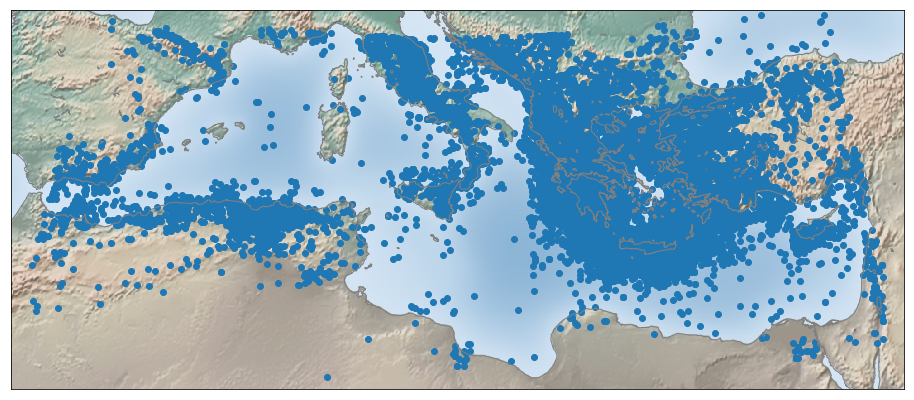

In [7]:
fig = plt.figure(figsize = (16, 16))
m = Basemap(projection = 'lcc', resolution = 'h', 
            lat_0 = 37.5, lon_0 = 15.5,
            width=4E6, height=1.7E6)
m.shadedrelief()
m.drawcoastlines(color='gray')
m.scatter(lon, lat, latlon=True)

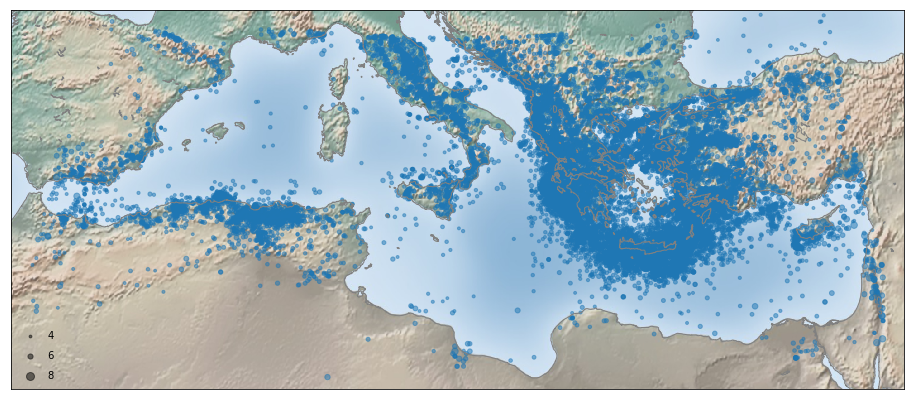

In [8]:
fig = plt.figure(figsize = (16, 16))
m = Basemap(projection = 'lcc', resolution = 'h', 
            lat_0 = 37.5, lon_0 = 15.5,
            width = 4E6, height = 1.7E6)
m.shadedrelief()
m.drawcoastlines(color = 'gray')
m.scatter(lon, lat, latlon = True, s = (Mw/2)**3, cmap='Reds', alpha=0.5) 

for a in [4, 6, 8]:
    plt.scatter([], [], c ='k', alpha = 0.5, s = (a/2)**3,
                label = str(a))
plt.legend(scatterpoints = 1, frameon = False,
           labelspacing = 1, loc = 'lower left');

In [72]:
!cat earthquakes/first_hellenic_arc.csv
























20.05422993,37.32686553

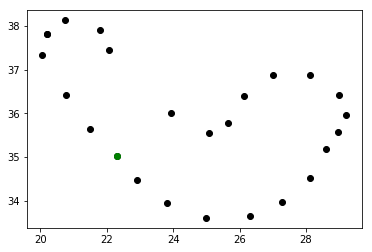

In [111]:
plt.plot(lons_vect, lats_vect, 'ok')
plt.plot(lons_vect[20], lats_vect[20], 'og')

In [339]:
hellenic_arc = pd.read_csv('earthquakes/first_hellenic_arc.csv', header=None)

In [340]:
hellenic_arc

,0,1
0,19.391753,37.577320
1,20.092784,38.360825
2,21.020619,38.195876
3,23.721649,35.927835
4,25.020619,36.072165
5,25.082474,36.608247
6,25.721649,37.123711
7,26.752577,37.268041
8,28.195876,36.938144
9,29.000000,36.505155


In [341]:
lats_vect = hellenic_arc[1].values

In [342]:
lats_vect

array([ 37.57731959,  38.36082474,  38.19587629,  35.92783505,
        36.07216495,  36.60824742,  37.12371134,  37.26804124,
        36.93814433,  36.50515464,  35.7628866 ,  34.69072165,
        33.7628866 ,  33.53608247,  34.27835052,  35.84536082])

In [343]:
lons_vect = hellenic_arc[0].values

In [344]:
lons_vect

array([ 19.39175258,  20.09278351,  21.02061856,  23.72164948,
        25.02061856,  25.08247423,  25.72164948,  26.75257732,
        28.19587629,  29.        ,  29.98969072,  29.35051546,
        26.97938144,  25.18556701,  23.04123711,  20.69072165])

In [345]:
lats_vect = np.append(lats_vect, lats_vect[0])
lons_vect = np.append(lons_vect, lons_vect[0])

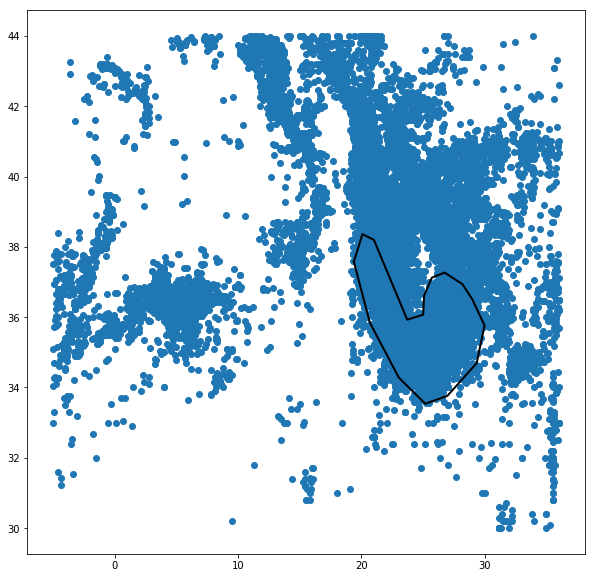

In [346]:
fig = plt.figure(figsize = (10, 10))
plt.plot(lons_vect, lats_vect, color = 'k', linewidth=2.0)
plt.scatter(lon, lat) 

/Users/sharon/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3296: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/sharon/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3305: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)
/Users/sharon/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/Users/sharon/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)
/Users/sharon/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3260: MatplotlibD

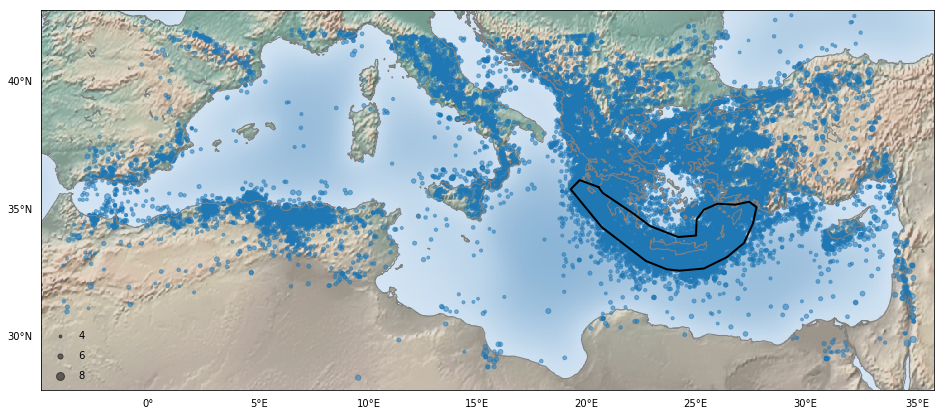

In [109]:
fig = plt.figure(figsize = (16, 16))
m = Basemap(projection = 'lcc', resolution = 'h', 
            lat_0 = 37.5, lon_0 = 15.5,
            width = 4E6, height = 1.7E6)
m.shadedrelief()
m.drawcoastlines(color = 'gray')
m.scatter(lon, lat, latlon = True, s = (Mw/2)**3, cmap='Reds', alpha=0.5) 
m.plot(lons_vect, lats_vect, latlon = True, color = 'k', linewidth = 2.0)

m.drawparallels(np.arange(int(30.),int(45.),5),labels=[1,0,0,0], linewidth=0.0)
m.drawmeridians(np.arange(int(-5),int(36.),5),labels=[0,0,0,1], linewidth=0.0)

for a in [4, 6, 8]:
    plt.scatter([], [], c ='k', alpha = 0.5, s = (a/2)**3,
                label = str(a))
plt.legend(scatterpoints = 1, frameon = False,
           labelspacing = 1, loc = 'lower left');

In [70]:
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

In [71]:
lons_lats_vect = np.column_stack((lons_vect, lats_vect)) # Reshape coordinates

In [72]:
polygon = Polygon(lons_lats_vect) # create polygon

In [73]:
point = Point(lon[1],lat[1]) # create point
print(polygon.contains(point)) # check if polygon contains point

False


In [79]:
ind = polygon.contains(Point(lon[1000],lat[1000]))

In [80]:
ind

False

In [87]:
length = len(lon)
ind = []

for i in range(length):
    dummy_ind = polygon.contains(Point(lon[i],lat[i]))
    ind.append(dummy_ind)

In [92]:
all_earthquakes['hellenic'] = ind

In [94]:
all_earthquakes.shape

(28327, 15)

In [97]:
crude_hellenic = all_earthquakes.iloc[:,:][all_earthquakes.hellenic == True]

In [98]:
crude_hellenic.shape

(7669, 15)

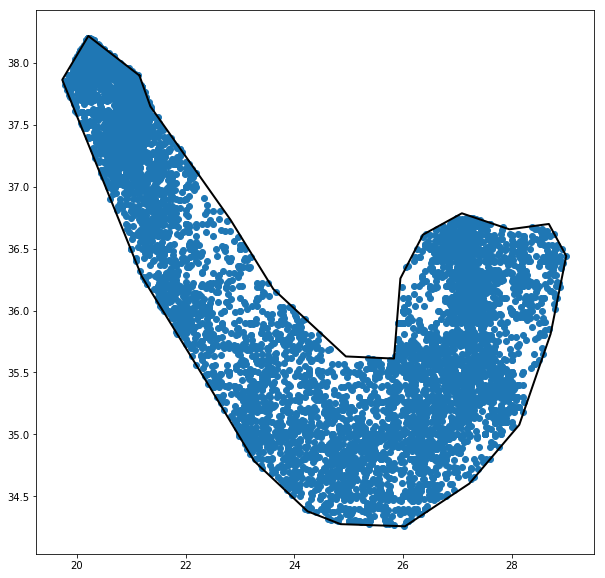

In [99]:
fig = plt.figure(figsize = (10, 10))
plt.plot(lons_vect, lats_vect, color = 'k', linewidth=2.0)
plt.scatter(crude_hellenic['longitude'].values, crude_hellenic['latitude'].values) 

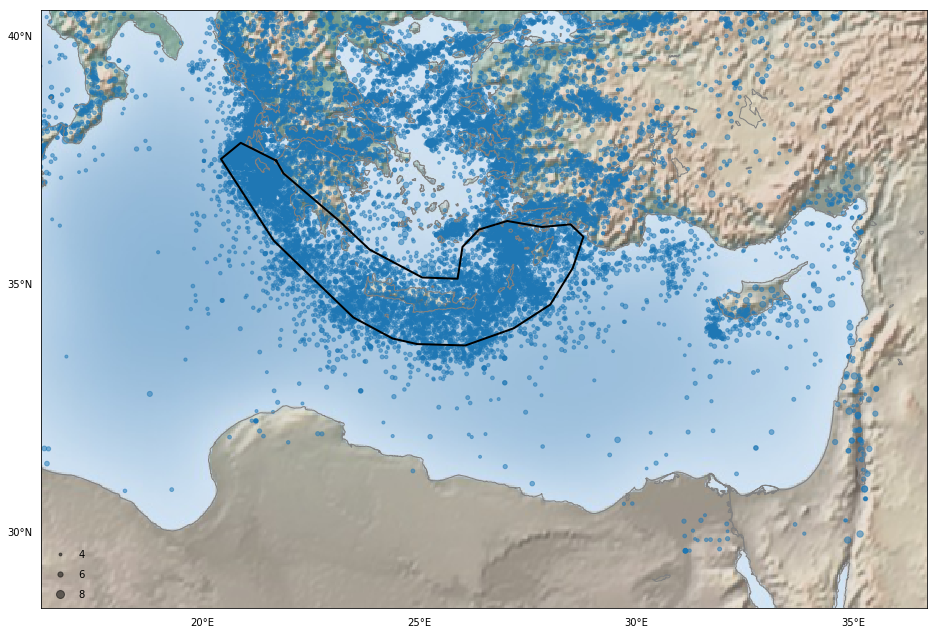

In [20]:
fig = plt.figure(figsize = (16, 11))
m = Basemap(projection = 'lcc', resolution = 'h', 
            lat_0 = 35, lon_0 = 26.5,
            width = 2E6, height = 1.35E6)
m.shadedrelief()
m.drawcoastlines(color = 'gray')
m.scatter(lon, lat, latlon = True, s = (Mw/2)**3, cmap='Reds', alpha=0.5) 
m.plot(lons_vect, lats_vect, latlon = True, color = 'k', linewidth = 2.0)

m.drawparallels(np.arange(int(30.),int(45.),5),labels=[1,0,0,0], linewidth=0.0)
m.drawmeridians(np.arange(int(-5),int(36.),5),labels=[0,0,0,1], linewidth=0.0)

for a in [4, 6, 8]:
    plt.scatter([], [], c ='k', alpha = 0.5, s = (a/2)**4,
                label = str(a))
plt.legend(scatterpoints = 1, frameon = False,
           labelspacing = 1, loc = 'lower left');

In [119]:
#dR(Mw)=exp(1.77+sqrt(0.037+1.02 Mw)) (km)
np.exp(1.77 + np.sqrt(0.037 + 1.02*7))

85.540705287163078

In [121]:
np.exp(-3.95 + np.sqrt(0.62+17.32*5)) # (days)

219.02039315019326

In [96]:
!cat earthquakes/first_cyprian_arc.csv












35.14069264,35.51136364

In [347]:
cyprian_arc = pd.read_csv('earthquakes/first_cyprian_arc.csv', header=None)

In [348]:
cyprian_arc

,0,1
0,32.525773,34.051546
1,31.804124,34.298969
2,31.783505,35.041237
3,32.402062,35.391753
4,33.701031,35.701031
5,34.752577,35.948454
6,35.309278,35.103093
7,35.288660,34.690722
8,33.680412,34.134021


In [349]:
lats_vect_cyp = cyprian_arc[1].values
lons_vect_cyp = cyprian_arc[0].values

In [350]:
lats_vect_cyp = np.append(lats_vect_cyp, lats_vect_cyp[0])
lons_vect_cyp = np.append(lons_vect_cyp, lons_vect_cyp[0])

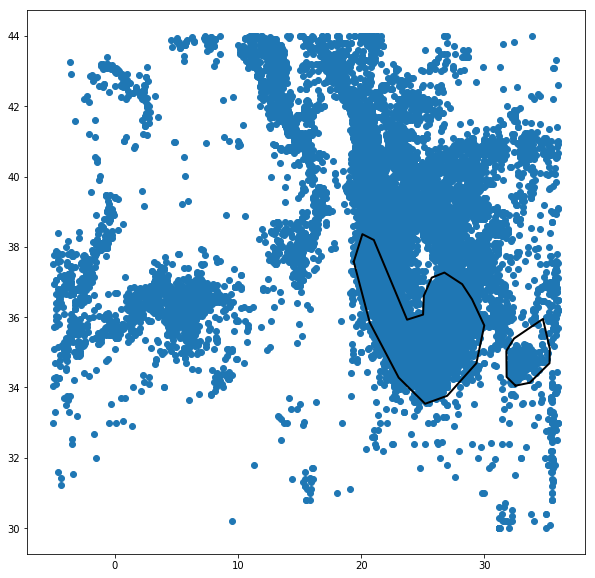

In [351]:
fig = plt.figure(figsize = (10, 10))
plt.plot(lons_vect, lats_vect, color = 'k', linewidth=2.0)
plt.plot(lons_vect_cyp, lats_vect_cyp, color = 'k', linewidth=2.0)
plt.scatter(lon, lat) 

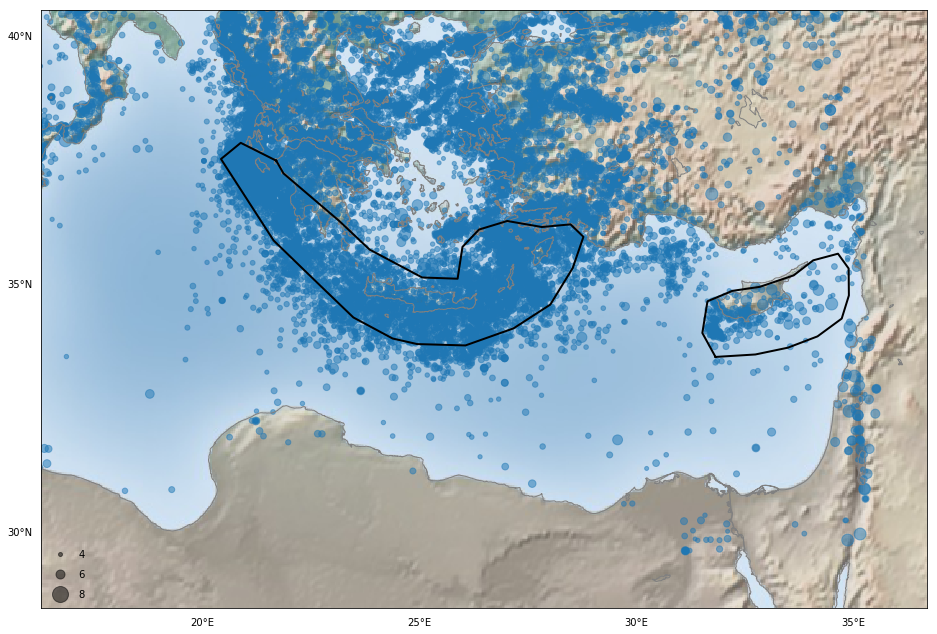

In [45]:
fig = plt.figure(figsize = (16, 11))
m = Basemap(projection = 'lcc', resolution = 'h', 
            lat_0 = 35, lon_0 = 26.5,
            width = 2E6, height = 1.35E6)
m.shadedrelief()
m.drawcoastlines(color = 'gray')
m.scatter(lon, lat, latlon = True, s = (Mw/2)**4, cmap='Reds', alpha=0.5) 
m.plot(lons_vect, lats_vect, latlon = True, color = 'k', linewidth = 2.0)
m.plot(lons_vect_cyp, lats_vect_cyp, latlon = True, color = 'k', linewidth = 2.0)

m.drawparallels(np.arange(int(30.),int(45.),5),labels=[1,0,0,0], linewidth=0.0)
m.drawmeridians(np.arange(int(-5),int(36.),5),labels=[0,0,0,1], linewidth=0.0)

for a in [4, 6, 8]:
    plt.scatter([], [], c ='k', alpha = 0.5, s = (a/2)**4,
                label = str(a))
plt.legend(scatterpoints = 1, frameon = False,
           labelspacing = 1, loc = 'lower left');

In [39]:
length = len(lon)
indM = []

for i in range(length):
    dummy_ind = Mw[i] > 4.9
    indM.append(dummy_ind)

In [41]:
all_earthquakes['Mwabove5'] = indM

In [42]:
Mw_above5 = all_earthquakes.iloc[:,:][all_earthquakes.Mwabove5 == True]

In [43]:
Mw_above5.shape

(4034, 15)

In [44]:
all_earthquakes.shape

(28327, 15)

In [47]:
np.max(Mw)

8.0999999999999996

In [48]:
lat5 = Mw_above5['latitude'].values
lon5 = Mw_above5['longitude'].values

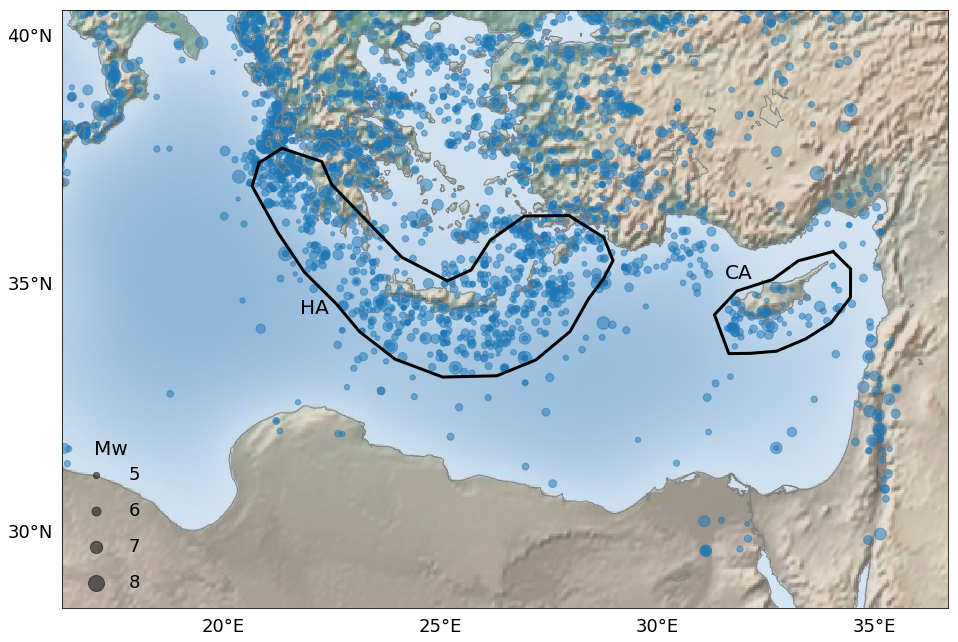

In [121]:
fig = plt.figure(figsize = (16, 11))
m = Basemap(projection = 'lcc', resolution = 'h', 
            lat_0 = 35, lon_0 = 26.5,
            width = 2E6, height = 1.35E6)
m.shadedrelief()
m.drawcoastlines(color = 'gray')
m.scatter(lon5, lat5, latlon = True, s = (Mw/2)**4, cmap='Reds', alpha=0.5) 
m.plot(lons_vect, lats_vect, latlon = True, color = 'k', linewidth = 3.0)
m.plot(lons_vect_cyp, lats_vect_cyp, latlon = True, color = 'k', linewidth = 3.0)

m.drawparallels(np.arange(int(30.),int(45.),5),labels=[1,0,0,0], linewidth=0.0, fontsize=18)
m.drawmeridians(np.arange(int(-5),int(36.),5),labels=[0,0,0,1], linewidth=0.0, fontsize=18)

for a in [5, 6, 7, 8]:
    plt.scatter([], [], c ='k', alpha = 0.5, s = (a/2)**4,
                label = str(a))
plt.legend(scatterpoints = 1, frameon = False,
           labelspacing = 1, loc = 'lower left', fontsize=18);
x, y = m(16.7, 31.65)
plt.text(x, y, 'Mw', fontsize = 20);
x1, y1 = m(32, 35.5)
plt.text(x1, y1, 'CA', fontsize = 20);
#x2, y2 = m(34.3, 35.05)
#plt.text(x2, y2, 'CA', fontsize = 16);
x3, y3 = m(21.45, 34.8)
plt.text(x3, y3, 'HA', fontsize = 20);
#x4, y4 = m(22, 35.4)
#plt.text(x4, y4, 'HA', fontsize = 16);

{34.000000000000036: ([<matplotlib.lines.Line2D at 0x11881d518>], []),
 34.200000000000031: ([<matplotlib.lines.Line2D at 0x1197d1470>],
  [Text(18200,-1400,'34.2°E')]),
 34.400000000000034: ([<matplotlib.lines.Line2D at 0x1197d1898>],
  [Text(37100,-1400,'34.4°E')]),
 34.600000000000037: ([<matplotlib.lines.Line2D at 0x1197d1cc0>],
  [Text(55860,-1400,'34.6°E')]),
 34.800000000000033: ([<matplotlib.lines.Line2D at 0x11b18e128>],
  [Text(74760,-1400,'34.8°E')]),
 35.000000000000036: ([<matplotlib.lines.Line2D at 0x11b18e550>],
  [Text(93660,-1400,'35°E')]),
 35.200000000000038: ([<matplotlib.lines.Line2D at 0x11b18e978>],
  [Text(112560,-1400,'35.2°E')]),
 35.400000000000034: ([<matplotlib.lines.Line2D at 0x11b18eda0>],
  [Text(131320,-1400,'35.4°E')])}

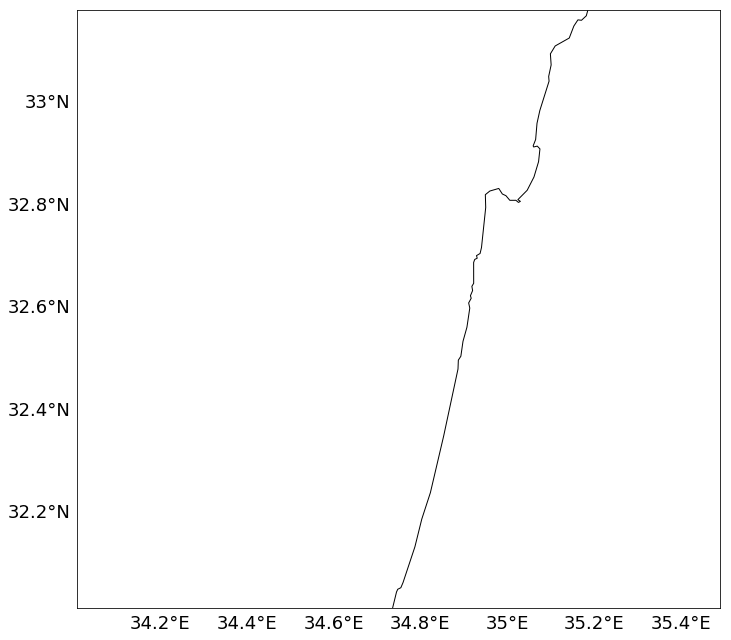

In [127]:
fig = plt.figure(figsize = (16, 11))
m = Basemap(projection = 'lcc', resolution = 'h', 
            lat_0 = 32.6, lon_0 = 34.75,
            width = 0.14E6, height = 0.13E6)

m.drawcoastlines(color = 'black')

m.drawparallels(np.arange(int(30.),int(45.),0.2),labels=[1,0,0,0], linewidth=0.0, fontsize=18)
m.drawmeridians(np.arange(int(-5),int(36.),0.2),labels=[0,0,0,1], linewidth=0.0, fontsize=18)



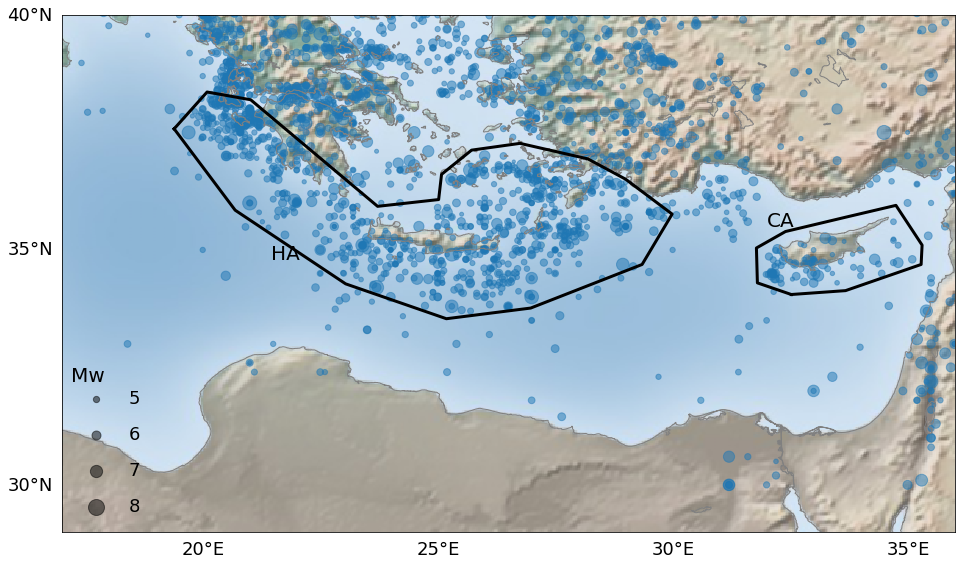

In [352]:
fig = plt.figure(figsize = (16, 11))
m = Basemap(projection='cyl',llcrnrlat=29,urcrnrlat=40,
            llcrnrlon=17,urcrnrlon=36,resolution='h')
m.shadedrelief()
m.drawcoastlines(color = 'gray')
m.scatter(lon5, lat5, latlon = True, s = (Mw/2)**4, cmap='Reds', alpha=0.5) 
m.plot(lons_vect, lats_vect, latlon = True, color = 'k', linewidth = 3.0)
m.plot(lons_vect_cyp, lats_vect_cyp, latlon = True, color = 'k', linewidth = 3.0)

m.drawparallels(np.arange(int(30.),int(45.),5),labels=[1,0,0,0], linewidth=0.0, fontsize=18)
m.drawmeridians(np.arange(int(-5),int(36.),5),labels=[0,0,0,1], linewidth=0.0, fontsize=18)

for a in [5, 6, 7, 8]:
    plt.scatter([], [], c ='k', alpha = 0.5, s = (a/2)**4,
                label = str(a))
plt.legend(scatterpoints = 1, frameon = False,
           labelspacing = 1, loc = 'lower left', fontsize=18);
x, y = m(17.4, 32.4)
plt.text(x, y, 'Mw', fontsize = 20);
x1, y1 = m(32, 35.5)
plt.text(x1, y1, 'CA', fontsize = 20);
#x2, y2 = m(34.3, 35.05)
#plt.text(x2, y2, 'CA', fontsize = 16);
x3, y3 = m(21.45, 34.8)
plt.text(x3, y3, 'HA', fontsize = 20);
#x4, y4 = m(22, 35.4)
#plt.text(x4, y4, 'HA', fontsize = 16);

# Declustering

In [232]:
from math import *
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees) usine haversine formula
    (which is said to be better for small distances)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    # Radius of earth in kilometers is 6371
    dist = 6371000* c
    return dist

In [183]:
# reading the values of the relevant columns from the table
year = all_earthquakes['year'].values
month = all_earthquakes['month'].values
day = all_earthquakes['day'].values

In [144]:
all_earthquakes['month']

0             
1             
2            1
3             
4            3
5           12
6           11
7            2
8             
9             
10            
11           8
12            
13           9
14           9
15            
16           5
17           9
18          12
19           1
20          12
21           8
22           8
23           6
24           3
25           6
26           1
27            
28            
29          12
         ...  
28297       12
28298       12
28299       12
28300       12
28301       12
28302       12
28303       12
28304       12
28305       12
28306       12
28307       12
28308       12
28309       12
28310       12
28311       12
28312       12
28313       12
28314       12
28315       12
28316       12
28317       12
28318       12
28319       12
28320       12
28321       12
28322       12
28323       12
28324       12
28325       12
28326       12
Name: month, Length: 28327, dtype: object

In [186]:
month

array(['     ', '     ', '    1', ..., '   12', '   12', '   12'], dtype=object)

In [141]:
lon

array([ 11.88,  13.81,  27.  , ...,  -4.09,   4.1 ,  32.31])

In [142]:
year

array([1005, 1005, 1010, ..., 2006, 2006, 2006])

In [187]:
# converting the month to numeric values
month = pd.to_numeric(month, errors = 'coerce')

In [189]:
np.isnan(month).sum()

104

In [181]:
day

array(['   ', '   ', '  8', ..., ' 31', ' 31', ' 31'], dtype=object)

In [193]:
# converting the day to numeric values
day = pd.to_numeric(day, errors = 'coerce')

In [196]:
day

array([ nan,  nan,   8., ...,  31.,  31.,  31.])

In [197]:
np.isnan(day).sum()

182

In [209]:
day

array([ nan,  nan,   8., ...,  31.,  31.,  31.])

In [214]:
# filling nans in day with ones
day = [1 if np.isnan(x) else int(x) for x in day]

In [217]:
# filling nans in day with ones
month = [1 if np.isnan(x) else int(x) for x in month]

In [218]:
month

[1,
 1,
 1,
 1,
 3,
 12,
 11,
 2,
 1,
 1,
 1,
 8,
 1,
 9,
 9,
 1,
 5,
 9,
 12,
 1,
 12,
 8,
 8,
 6,
 3,
 6,
 1,
 1,
 1,
 12,
 1,
 1,
 1,
 10,
 1,
 1,
 1,
 2,
 5,
 1,
 5,
 1,
 1,
 5,
 1,
 5,
 6,
 5,
 1,
 4,
 3,
 6,
 1,
 1,
 3,
 3,
 1,
 8,
 9,
 1,
 1,
 3,
 5,
 1,
 4,
 1,
 3,
 4,
 1,
 1,
 7,
 9,
 6,
 7,
 11,
 12,
 8,
 1,
 12,
 12,
 1,
 1,
 1,
 6,
 5,
 5,
 12,
 6,
 2,
 1,
 6,
 10,
 10,
 9,
 12,
 12,
 9,
 1,
 9,
 9,
 7,
 10,
 12,
 3,
 7,
 5,
 1,
 7,
 12,
 1,
 1,
 4,
 6,
 1,
 3,
 10,
 1,
 8,
 9,
 7,
 3,
 4,
 10,
 4,
 6,
 10,
 12,
 4,
 6,
 7,
 5,
 1,
 9,
 1,
 8,
 8,
 4,
 3,
 5,
 1,
 7,
 1,
 6,
 11,
 6,
 1,
 3,
 3,
 3,
 3,
 3,
 4,
 5,
 6,
 2,
 1,
 2,
 11,
 3,
 9,
 2,
 2,
 1,
 1,
 7,
 1,
 5,
 10,
 1,
 1,
 9,
 3,
 5,
 6,
 12,
 12,
 1,
 4,
 5,
 11,
 6,
 11,
 5,
 2,
 12,
 12,
 8,
 9,
 12,
 1,
 1,
 1,
 3,
 1,
 1,
 8,
 10,
 1,
 2,
 10,
 10,
 1,
 10,
 2,
 4,
 5,
 10,
 12,
 2,
 10,
 6,
 1,
 9,
 11,
 1,
 6,
 4,
 8,
 1,
 5,
 6,
 7,
 1,
 6,
 4,
 9,
 11,
 1,
 9,
 11,
 12,
 1,
 5,
 2,
 9,
 12,
 1,
 5,
 8,


In [219]:
from datetime import datetime

In [220]:
datetime(year[0], month[0], day[0])

datetime.datetime(1005, 1, 1, 0, 0)

In [242]:
delta = datetime(year[2], month[2], day[2]) - datetime(year[1], month[1], day[1])

In [244]:
delta

datetime.timedelta(1833)

In [243]:
diff = delta.days

In [245]:
diff

1833

In [224]:
datetime(year[2], month[2], day[2])

datetime.datetime(1010, 1, 8, 0, 0)

In [225]:
1833/5

366.6

In [226]:
i = 0

In [227]:
Mw[i]

4.9000000000000004

In [228]:
# calculating distance and time frames
dR = np.exp(1.77 + np.sqrt(0.037 + 1.02*Mw[i]))
if Mw[i] < 7.8:
    dTf = np.exp(-4.77 + np.sqrt(0.62 + 17.32*Mw[i]))
else:
    dTf = np.exp(6.44 + 0.055*Mw[i])
if Mw[i] < 6.6:
    dTa = np.exp(-3.95 + np.sqrt(0.62 + 17.32*Mw[i]))
else:
    dTa = np.exp(6.44 + 0.055*Mw[i])        

In [229]:
dR

55.361287462827576

In [230]:
dTf

87.87998668468849

In [231]:
dTa

199.53149548993508

In [233]:
haversine(lon[i], lat[i], lon[i + 1], lat[i + 1])

270240.3501738078

In [278]:
declustering = (lat > 0)

In [310]:
declustering = (lat > 0)
n = len(lat)
i = 0
decindex = 0*lat

while True:
    
    if i > n - 1:
        break
        
    # calculating distance and time frames
    dR = np.exp(1.77 + np.sqrt(0.037 + 1.02*Mw[i]))
    if Mw[i] < 7.8:
        dTf = np.exp(-4.77 + np.sqrt(0.62 + 17.32*Mw[i]))
    else:
        dTf = np.exp(6.44 + 0.055*Mw[i])
    if Mw[i] < 6.6:
        dTa = np.exp(-3.95 + np.sqrt(0.62 + 17.32*Mw[i]))
    else:
        dTa = np.exp(6.44 + 0.055*Mw[i])
        
    # finding aftershocks
    d = 1
    while True:
        if i + d > n - 1:
            break
        delta = datetime(year[i + d], month[i + d], day[i + d]) - datetime(year[i], month[i], day[i])
        timediff = delta.days
        if timediff < dTa:
            dist = haversine(lon[i], lat[i], lon[i + d], lat[i + d])
            if dist/1000 < dR:
                if Mw[i] > Mw[i + d]:
                    declustering[i + d] = False
                    decindex[i + d] = i
            d = d + 1
        else:
            break    
        
    # finding foreshocks
    d = 1
    while True:
        if i - d < 0:
            break
        delta = datetime(year[i], month[i], day[i]) - datetime(year[i - d], month[i - d], day[i - d])
        timediff = delta.days
        if timediff < dTf:
            dist = haversine(lon[i], lat[i], lon[i - d], lat[i - d])
            if dist/1000 < dR:
                if Mw[i] > Mw[i - d]:
                    declustering[i - d] = False
                    decindex[i - d] = i
            d = d + 1
        else:
            break   
            
    i = i + 1
    

In [299]:
declustering

array([ True,  True,  True, ...,  True, False,  True], dtype=bool)

In [324]:
# checking for i + d = 28324
i = 28219
d = 105
delta = datetime(year[i + d], month[i + d], day[i + d]) - datetime(year[i], month[i], day[i])
timediff = delta.days
dist = haversine(lon[i], lat[i], lon[i + d], lat[i + d])

In [325]:
dist

775920.4878187628

In [318]:
dR = np.exp(1.77 + np.sqrt(0.037 + 1.02*Mw[i]))

In [319]:
dR

59.208218761857296

In [322]:
dTa = np.exp(-3.95 + np.sqrt(0.62 + 17.32*Mw[i]))

In [323]:
dTa

263.17381566529474

In [320]:
Mw[i]

5.2000000000000002

In [300]:
np.sum(declustering)

8214

In [312]:
all_earthquakes['Declustering'] = declustering
all_earthquakes['Decindex'] = decindex

In [313]:
all_earthquakes

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex
0,1005,,,,,43.46,11.88,,6.5,4.9,w,4.9,0.34,CPTI08,True,0.0
1,1005,,,,,41.49,13.81,,7.5,5.4,w,5.4,0.3,CPTI04,True,0.0
2,1010,1,8,,,40.60,27.00,,9,7.4,w,7.4,0.5,Pap,True,0.0
3,1016,,,,,32.20,35.50,,8,5.5,L,5.5,,FA,True,0.0
4,1032,3,6,,,34.80,35.10,,,6.8,L,7.0,,FA,True,0.0
5,1033,12,5,,,32.50,35.50,,9.5,6.5,S,6.5,,KKP,True,0.0
6,1038,11,2,,,41.00,28.70,,7,6.7,w,6.7,0.5,Pap,True,0.0
7,1039,2,2,,,38.40,27.30,,8,6.8,w,6.8,0.5,Pap,True,0.0
8,1045,,,,,34.05,-5.00,,8,5.8,w,5.8,,Pel,True,0.0
9,1047,,,,,31.00,35.50,,9,6.5,S,6.5,,FA,True,0.0


In [333]:
(28327 - 8214)/28327*100

71.0029300667208

In [307]:
decindex = 0*lat

In [308]:
decindex

array([ 0.,  0.,  0., ...,  0.,  0.,  0.])

In [327]:
Declustered_earthquakes = all_earthquakes.iloc[:,:][all_earthquakes.Declustering == True]

In [329]:
Declustered_earthquakes = Declustered_earthquakes.drop(['Declustering', 'Decindex'], axis=1)

In [330]:
Declustered_earthquakes

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference
0,1005,,,,,43.46,11.88,,6.5,4.9,w,4.9,0.34,CPTI08
1,1005,,,,,41.49,13.81,,7.5,5.4,w,5.4,0.3,CPTI04
2,1010,1,8,,,40.60,27.00,,9,7.4,w,7.4,0.5,Pap
3,1016,,,,,32.20,35.50,,8,5.5,L,5.5,,FA
4,1032,3,6,,,34.80,35.10,,,6.8,L,7.0,,FA
5,1033,12,5,,,32.50,35.50,,9.5,6.5,S,6.5,,KKP
6,1038,11,2,,,41.00,28.70,,7,6.7,w,6.7,0.5,Pap
7,1039,2,2,,,38.40,27.30,,8,6.8,w,6.8,0.5,Pap
8,1045,,,,,34.05,-5.00,,8,5.8,w,5.8,,Pel
9,1047,,,,,31.00,35.50,,9,6.5,S,6.5,,FA


# Completeness times

In [355]:
# Populating the interactive namespace from shapely
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

In [353]:
lons_lats_vect = np.column_stack((lons_vect, lats_vect)) # Reshape coordinates

In [356]:
polygon = Polygon(lons_lats_vect) # create polygon

In [357]:
length = len(lon)
ind = []

# checking each entry in the earthquake catalog if it is located inside the hellenic arc polygon
# (True if it is and False if it isn't)
for i in range(length):
    dummy_ind = polygon.contains(Point(lon[i],lat[i]))
    ind.append(dummy_ind)

In [358]:
# adding the column of the indeces to the earthquakes dataframe
all_earthquakes['hellenic'] = ind

In [359]:
# extracting the hellenic arc earthquakes from the all earthquakes
crude_hellenic = all_earthquakes.iloc[:,:][all_earthquakes.hellenic == True]

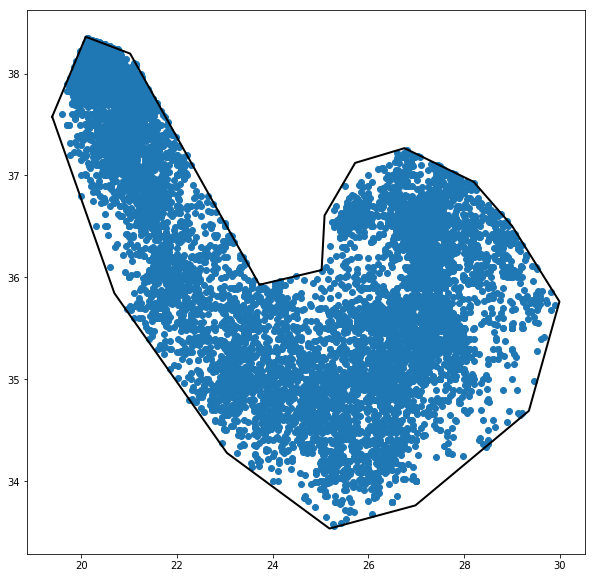

In [360]:
fig = plt.figure(figsize = (10, 10))

# plotting the Hellenic arc polygon
plt.plot(lons_vect, lats_vect, color = 'k', linewidth=2.0)

# plotting the scatter plot of earthquakes inside the polygon
plt.scatter(crude_hellenic['longitude'].values, crude_hellenic['latitude'].values) 

In [361]:
lons_lats_vect_cyp = np.column_stack((lons_vect_cyp, lats_vect_cyp)) # Reshape coordinates

polygon = Polygon(lons_lats_vect_cyp) # create polygon

length = len(lon)
ind = []

# checking each entry in the earthquake catalog if it is located inside the cyprian arc polygon
# (True if it is and False if it isn't)
for i in range(length):
    dummy_ind = polygon.contains(Point(lon[i],lat[i]))
    ind.append(dummy_ind)
    
# adding the column of the indeces to the earthquakes dataframe
all_earthquakes['cyprian'] = ind

# extracting the hellenic arc earthquakes from the all earthquakes
crude_cyprian = all_earthquakes.iloc[:,:][all_earthquakes.cyprian == True]

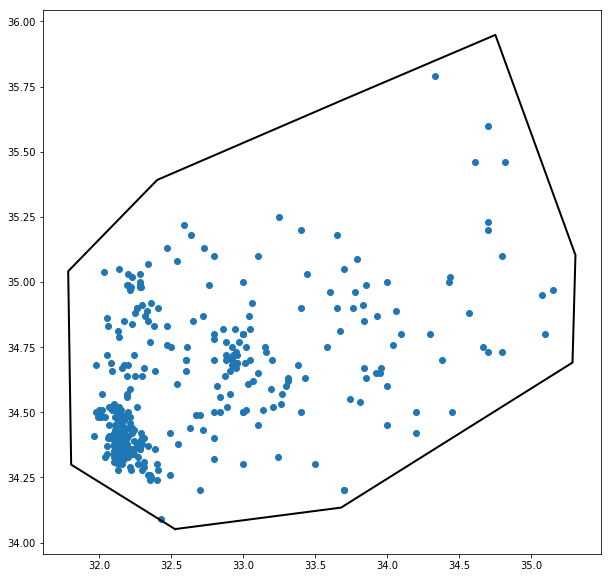

In [362]:
fig = plt.figure(figsize = (10, 10))

# plotting the Hellenic arc polygon
plt.plot(lons_vect_cyp, lats_vect_cyp, color = 'k', linewidth=2.0)

# plotting the scatter plot of earthquakes inside the polygon
plt.scatter(crude_cyprian['longitude'].values, crude_cyprian['latitude'].values) 

In [369]:
Mw

array([ 4.9,  5.4,  7.4, ...,  4.2,  4.5,  4.3])

In [371]:
Mw = np.around(Mw, decimals=1)

In [372]:
Mw

array([ 4.9,  5.4,  7.4, ...,  4.2,  4.5,  4.3])

In [373]:
np.max(Mw)

8.0999999999999996

In [374]:
np.max(crude_hellenic['Mw '].values)

8.0

In [375]:
np.max(crude_cyprian['Mw '].values)

7.0

In [377]:
np.max(crude_cyprian['M_orig'].values)

'   6.8'

In [403]:
# splitting the hellenic arc earthquakes into the magnitude classes of half a magnitude
crude_hellenic1 = crude_hellenic[(crude_hellenic['Mw '] > 6.4) & (crude_hellenic['Mw '] < 7)]

In [394]:
crude_hellenic2 = crude_hellenic[(crude_hellenic['Mw '] > 6.9) & (crude_hellenic['Mw '] < 7.5)]

In [396]:
crude_hellenic3 = crude_hellenic[(crude_hellenic['Mw '] > 7.4) & (crude_hellenic['Mw '] < 8)]

In [398]:
crude_hellenic4 = crude_hellenic[(crude_hellenic['Mw '] > 7.9) & (crude_hellenic['Mw '] < 9)]

In [404]:
crude_hellenic1

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,hellenic
205,1481,5,3,,,36.50,28.33,,,6.5,w,6.5,,Pdo07,False,206.0,True
217,1493,8,18,,,36.70,27.10,,9,6.8,w,6.8,0.5,Pap,True,0.0,True
231,1508,,,,,37.70,20.60,,7,6.5,w,6.5,0.5,Pap,True,0.0,True
240,1514,4,16,,,37.70,21.00,,8,6.5,w,6.5,0.5,Pap,True,0.0,True
304,1592,5,,,,37.70,20.80,,9,6.6,w,6.6,0.5,Pap,True,0.0,True
309,1595,11,26,,,34.90,25.30,,8,6.8,w,6.8,0.5,Pap,True,0.0,True
345,1622,5,5,,,37.70,21.00,,8,6.6,w,6.6,0.5,Pap,True,0.0,True
373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap,True,0.0,True
402,1664,,,,,37.90,21.00,,8,6.6,w,6.6,0.35,Pap,True,0.0,True
423,1676,4,23,,,37.60,20.70,,7,6.5,w,6.5,0.5,Pap,True,0.0,True


In [405]:
# deleting the column of indeces of the earthquake location inside the hellenic arc polygon
crude_hellenic1 = crude_hellenic1.drop(['hellenic'], axis=1)

In [407]:
# adding the column of ones
crude_hellenic1['Count'] = np.ones(len(crude_hellenic1))

In [409]:
# adding the column of the cumulative sum of the earthquakes
crude_hellenic1['Cum_Count'] = crude_hellenic1['Count'].cumsum()

In [410]:
crude_hellenic1

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,Count,Cum_Count
205,1481,5,3,,,36.50,28.33,,,6.5,w,6.5,,Pdo07,False,206.0,1.0,1.0
217,1493,8,18,,,36.70,27.10,,9,6.8,w,6.8,0.5,Pap,True,0.0,1.0,2.0
231,1508,,,,,37.70,20.60,,7,6.5,w,6.5,0.5,Pap,True,0.0,1.0,3.0
240,1514,4,16,,,37.70,21.00,,8,6.5,w,6.5,0.5,Pap,True,0.0,1.0,4.0
304,1592,5,,,,37.70,20.80,,9,6.6,w,6.6,0.5,Pap,True,0.0,1.0,5.0
309,1595,11,26,,,34.90,25.30,,8,6.8,w,6.8,0.5,Pap,True,0.0,1.0,6.0
345,1622,5,5,,,37.70,21.00,,8,6.6,w,6.6,0.5,Pap,True,0.0,1.0,7.0
373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap,True,0.0,1.0,8.0
402,1664,,,,,37.90,21.00,,8,6.6,w,6.6,0.35,Pap,True,0.0,1.0,9.0
423,1676,4,23,,,37.60,20.70,,7,6.5,w,6.5,0.5,Pap,True,0.0,1.0,10.0


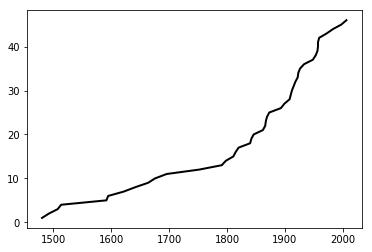

In [411]:
# plotting the cumulative sum of the earthquakes (6.4 < Mw < 7) as a function of time
plt.plot(crude_hellenic1['year'], crude_hellenic1['Cum_Count'], color = 'k', linewidth=2.0)

In [412]:
np.min(Mw)

3.6000000000000001

In [689]:
# splitting the hellenic arc earthquakes into the magnitude classes of half a magnitude
crude_hellenic4 = crude_hellenic[(crude_hellenic['Mw '] > 3.75) & (crude_hellenic['Mw '] < 4.25)]
crude_hellenic45 = crude_hellenic[(crude_hellenic['Mw '] > 4.25) & (crude_hellenic['Mw '] < 4.75)]
crude_hellenic5 = crude_hellenic[(crude_hellenic['Mw '] > 4.75) & (crude_hellenic['Mw '] < 5.25)]
crude_hellenic55 = crude_hellenic[(crude_hellenic['Mw '] > 5.25) & (crude_hellenic['Mw '] < 5.75)]
crude_hellenic6 = crude_hellenic[(crude_hellenic['Mw '] > 5.75) & (crude_hellenic['Mw '] < 6.25)]
crude_hellenic65 = crude_hellenic[(crude_hellenic['Mw '] > 6.25) & (crude_hellenic['Mw '] < 6.75)]
crude_hellenic7 = crude_hellenic[(crude_hellenic['Mw '] > 6.75) & (crude_hellenic['Mw '] < 7.25)]
crude_hellenic75 = crude_hellenic[(crude_hellenic['Mw '] > 7.25) & (crude_hellenic['Mw '] < 7.75)]
crude_hellenic8 = crude_hellenic[(crude_hellenic['Mw '] > 7.75) & (crude_hellenic['Mw '] < 8.25)]

In [419]:
# calculating the cumulative sum of the earthquakes
crude_hellenic5 = crude_hellenic5.drop(['hellenic'], axis=1)
crude_hellenic5['Count'] = np.ones(len(crude_hellenic5))
crude_hellenic5['Cum_Count'] = crude_hellenic5['Count'].cumsum()

In [687]:
crude_hellenic45 = crude_hellenic45.drop(['hellenic'], axis=1)
crude_hellenic45['Count'] = np.ones(len(crude_hellenic45))
crude_hellenic45['Cum_Count'] = crude_hellenic45['Count'].cumsum()

In [688]:
crude_hellenic4 = crude_hellenic4.drop(['hellenic'], axis=1)
crude_hellenic4['Count'] = np.ones(len(crude_hellenic4))
crude_hellenic4['Cum_Count'] = crude_hellenic4['Count'].cumsum()

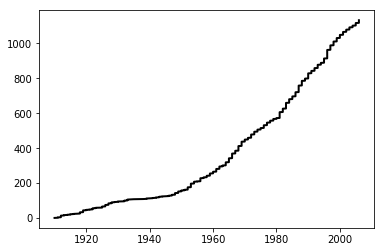

In [421]:
# plotting the cumulative sum of the earthquakes (4.75 < Mw < 5.25) as a function of time
plt.plot(crude_hellenic5['year'], crude_hellenic5['Cum_Count'], color = 'k', linewidth=2.0)

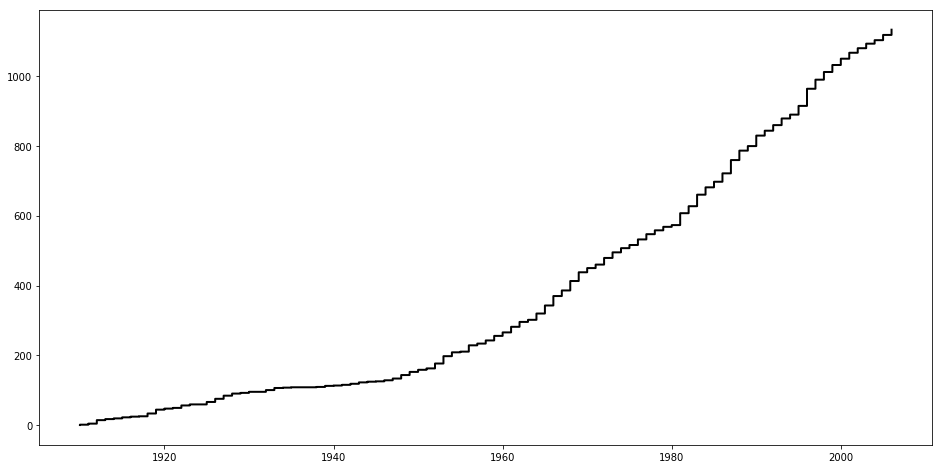

In [426]:
# plotting the staircase plot of the cumulative sum of the earthquakes (4.75 < Mw < 5.25) as a function of time
fig = plt.figure(figsize = (16, 8))
plt.step(crude_hellenic5['year'], crude_hellenic5['Cum_Count'], color = 'k', linewidth=2.0)

In [427]:
crude_hellenic55 = crude_hellenic55.drop(['hellenic'], axis=1)
crude_hellenic55['Count'] = np.ones(len(crude_hellenic55))
crude_hellenic55['Cum_Count'] = crude_hellenic55['Count'].cumsum()

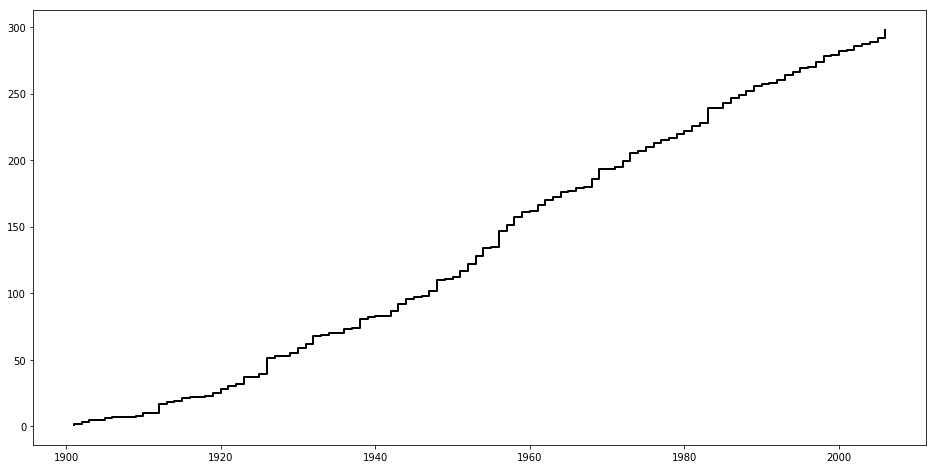

In [428]:
# plotting the staircase plot of the cumulative sum of the earthquakes (5.25 < Mw < 5.75) as a function of time
fig = plt.figure(figsize = (16, 8))
plt.step(crude_hellenic55['year'], crude_hellenic55['Cum_Count'], color = 'k', linewidth=2.0)

In [429]:
crude_hellenic6 = crude_hellenic6.drop(['hellenic'], axis=1)
crude_hellenic6['Count'] = np.ones(len(crude_hellenic6))
crude_hellenic6['Cum_Count'] = crude_hellenic6['Count'].cumsum()

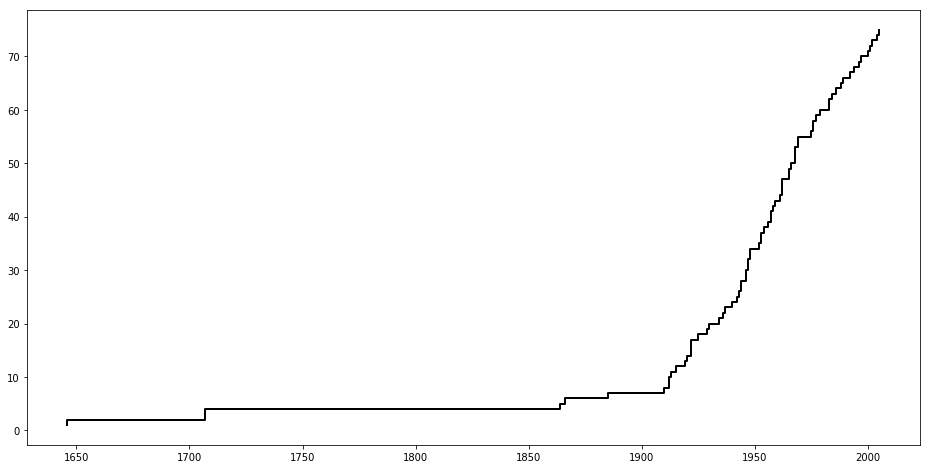

In [430]:
# plotting the staircase plot of the cumulative sum of the earthquakes (5.75 < Mw < 6.25) as a function of time
fig = plt.figure(figsize = (16, 8))
plt.step(crude_hellenic6['year'], crude_hellenic6['Cum_Count'], color = 'k', linewidth=2.0)

In [439]:
def plot_completeness_time(name):
    """
    Calculating and plotting the cumulitave number of the earthquakes.
    As an input receives the dataframe of the earthquake catalog. 
    Plots the staircase plot of the cumulative sum of the earthquakes as a function of time
    """
    # deleting the column of indeces of the earthquake location inside the hellenic arc polygon
    name = name.drop(['hellenic'], axis=1)
    
    # adding the column of ones
    name['Count'] = np.ones(len(name))
    
    # adding the column of the cumulative sum of the earthquakes
    name['Cum_Count'] = name['Count'].cumsum()
    
    # plotting the staircase plot of the cumulative sum of the earthquakes as a function of time
    fig = plt.figure(figsize = (16, 8))
    plt.step(name['year'], name['Cum_Count'], color = 'k', linewidth=2.0)

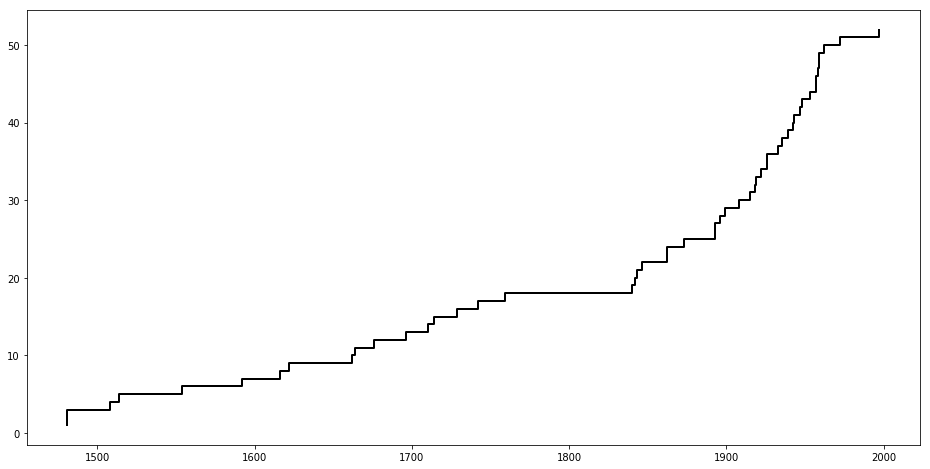

In [440]:
plot_completeness_time(crude_hellenic65)

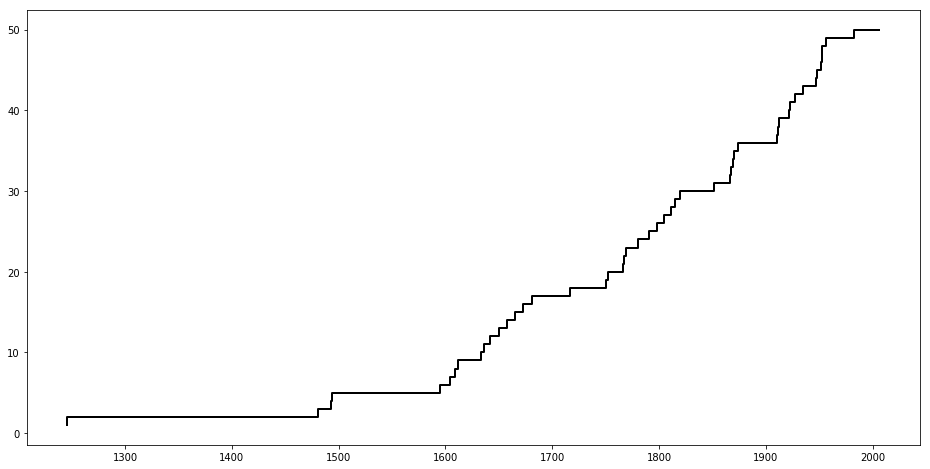

In [441]:
plot_completeness_time(crude_hellenic7)

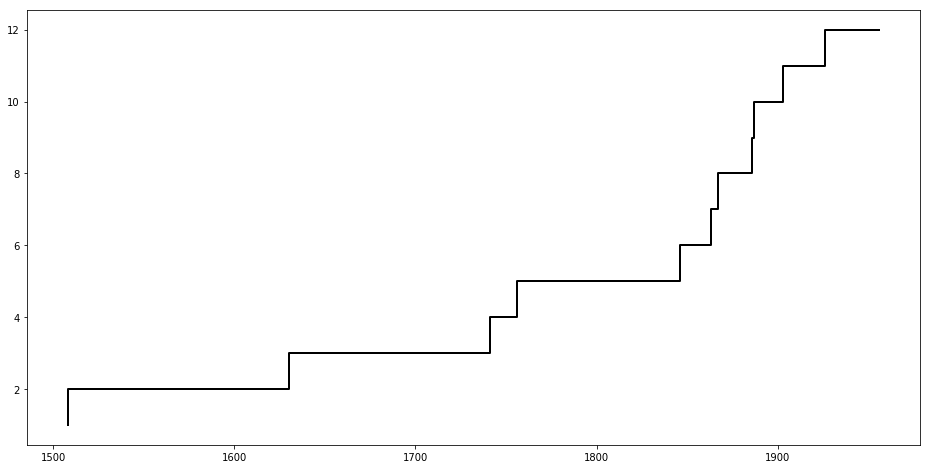

In [442]:
plot_completeness_time(crude_hellenic75)

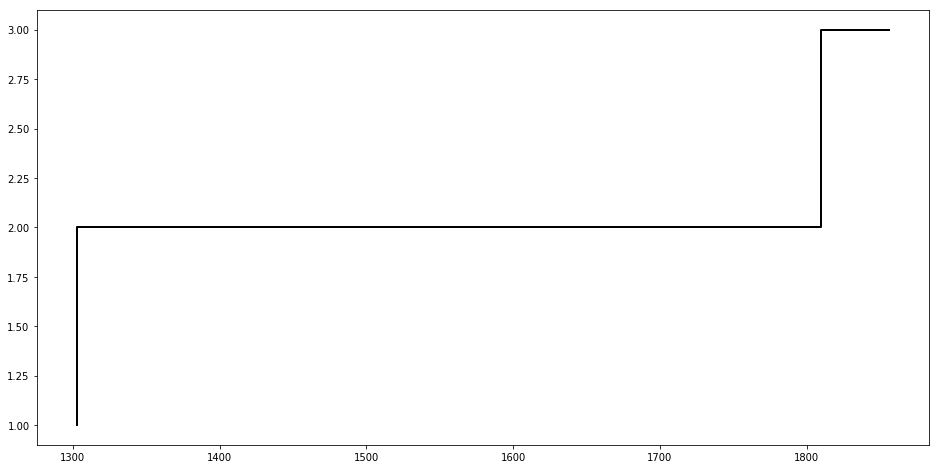

In [443]:
plot_completeness_time(crude_hellenic8)

In [452]:
crude_hellenic55

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,hellenic
1615,1901,10,25,16,18,37.00,22.20,20,6,5.5,w,5.5,0.35,Pap,False,1619.0,True
1660,1902,11,5,23,50,38.20,20.50,13,7,5.5,w,5.5,0.35,Pap,True,0.0,True
1666,1903,3,15,19,3,37.80,21.20,18,6,5.5,w,5.5,0.35,Pap,True,0.0,True
1683,1903,9,19,18,51,37.80,20.80,20,7,5.5,w,5.5,0.35,Pap,True,0.0,True
1781,1905,6,3,4,15,38.20,20.50,,7,5.5,w,5.5,0.35,Pap,True,0.0,True
1840,1906,6,17,1,11,35.50,22.80,,,5.5,w,5.5,0.35,Pap,True,0.0,True
1957,1909,3,8,15,55,37.70,21.20,,,5.3,w,5.3,0.35,Pap,False,1974.0,True
2022,1910,8,2,2,35,37.00,21.00,20,,5.3,w,5.3,0.35,Pap,True,0.0,True
2035,1910,12,27,3,54,37.90,21.20,,8,5.6,w,5.6,0.35,Pap,False,2103.0,True
2105,1912,1,26,15,26,38.10,20.80,20,5,5.4,w,5.4,0.25,Pap,False,2130.0,True


In [445]:
# calculating the total number of independent earthquakes of magnitude 4.75 < Mw < 5.25
np.sum(crude_hellenic5['Declustering'])

427

In [446]:
# calculating the percentage of the dependent earthquakes of magnitude 4.75 < Mw < 5.25
(1132 - 427)/1132*100

62.27915194346289

In [449]:
# choosing only the independent earthquakes
Declustered_hellenic5 = crude_hellenic5.iloc[:,:][crude_hellenic5.Declustering == True]

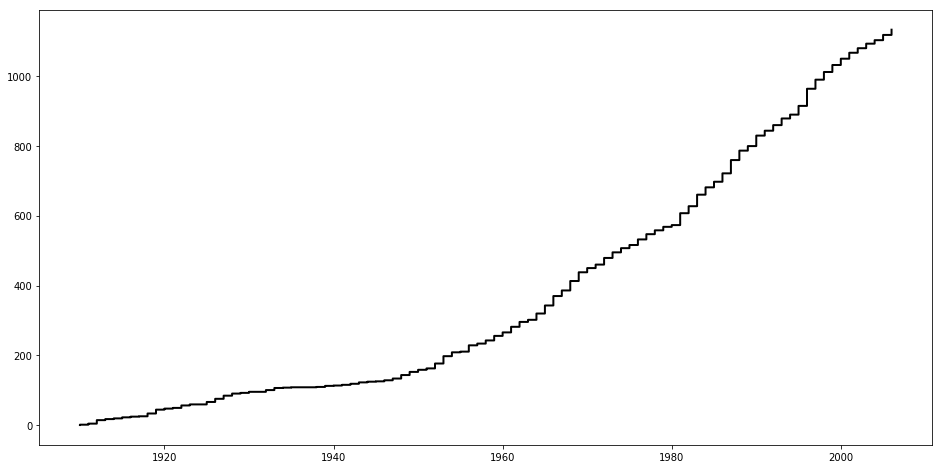

In [450]:
plot_completeness_time(crude_hellenic5)

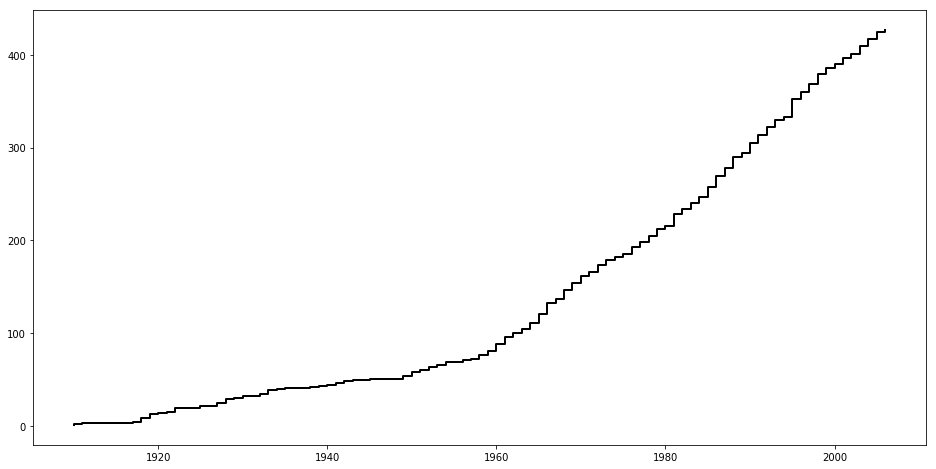

In [451]:
plot_completeness_time(Declustered_hellenic5)

In [453]:
# calculating the total number of independent earthquakes of magnitude 5.25 < Mw < 5.75
np.sum(crude_hellenic55['Declustering'])

156

In [457]:
# calculating the percentage of the dependent earthquakes of magnitude 5.25 < Mw < 5.75
(len(crude_hellenic55) - np.sum(crude_hellenic55['Declustering']))/len(crude_hellenic55)*100

47.651006711409394

In [461]:
def plot_comparative_completeness_time(name):
    """
    Plotting two separate graphs of the cumulitave number of all the earthquakes 
    and of the independent earthquakes only.
    As an input receives the dataframe of the earthquake catalog. 
    """
    
    # printing the percentage of the dependent earthquakes 
    print((len(name) - np.sum(name['Declustering']))/len(name)*100)
    
    # choosing only the independent earthquakes
    Declustered = name.iloc[:,:][name.Declustering == True]
    
    # plotting the staircase plot of the cumulative sum of all the earthquakes as a function of time
    plot_completeness_time(name)
    
    # plotting the staircase plot of the cumulative sum of the independent earthquakes as a function of time
    plot_completeness_time(Declustered)

47.6510067114


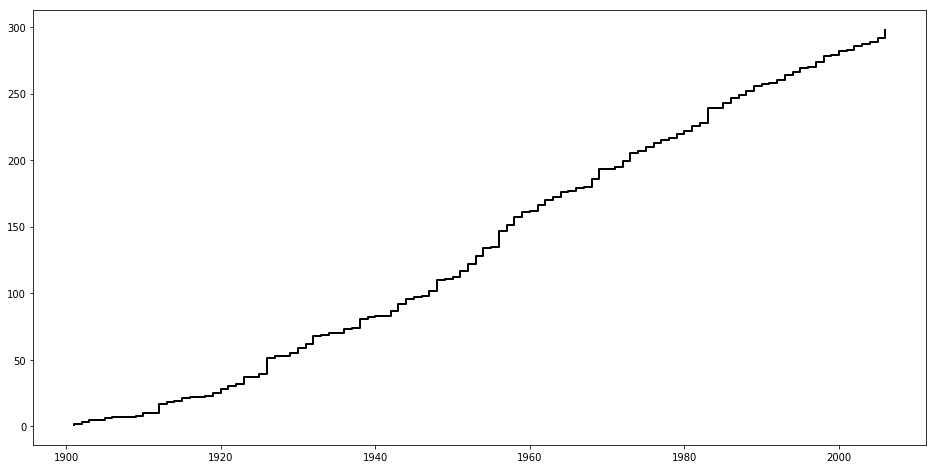

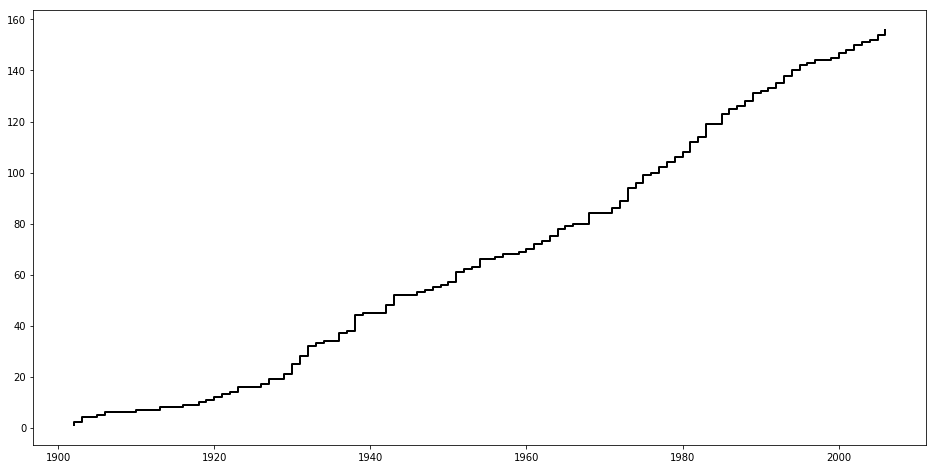

In [462]:
plot_comparative_completeness_time(crude_hellenic55)

29.3333333333


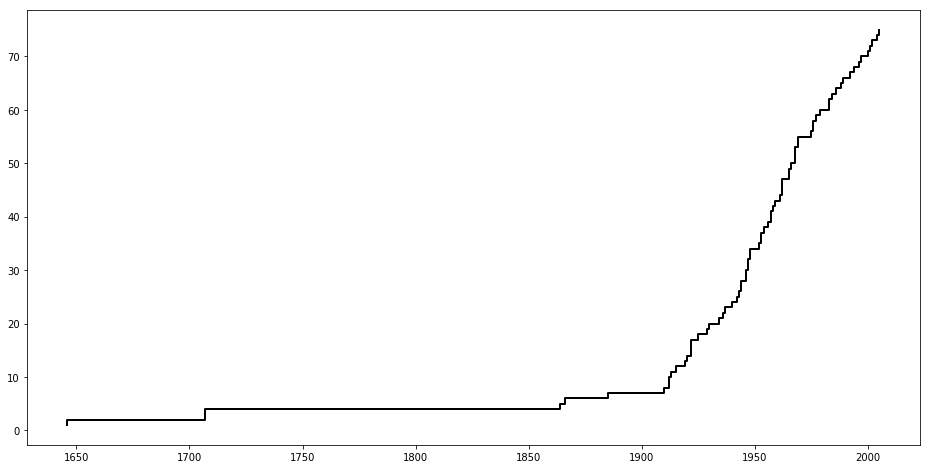

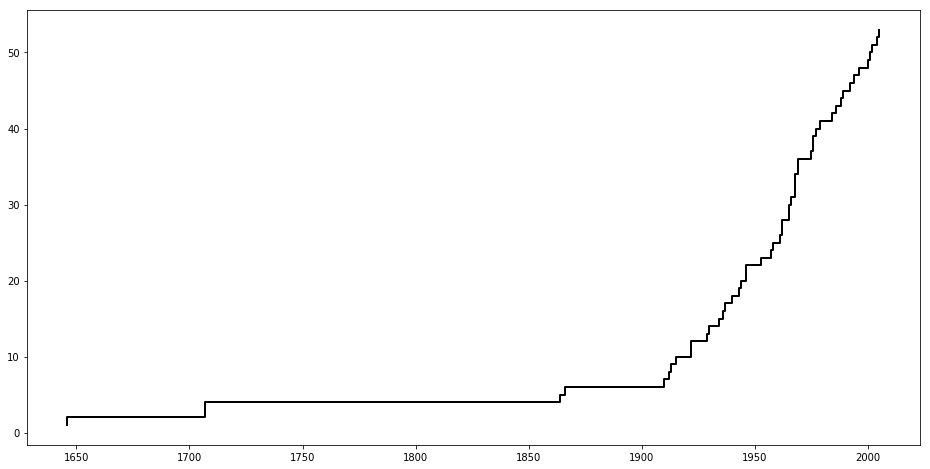

In [463]:
plot_comparative_completeness_time(crude_hellenic6)

15.3846153846


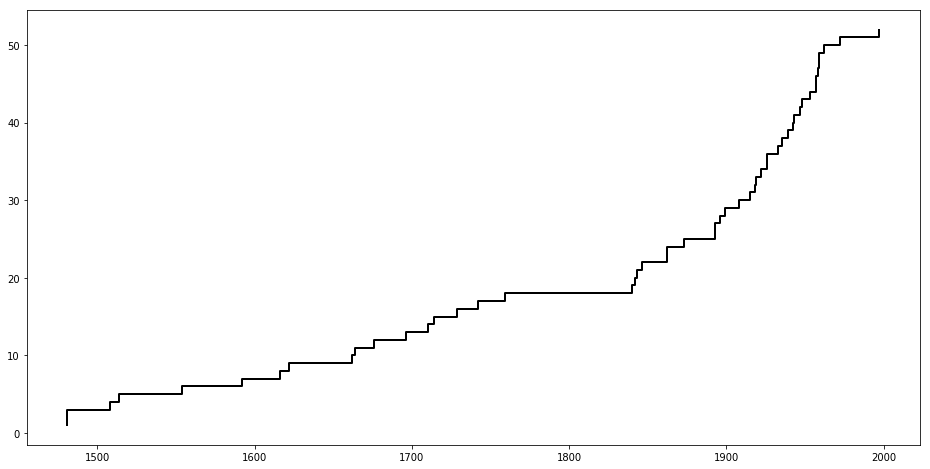

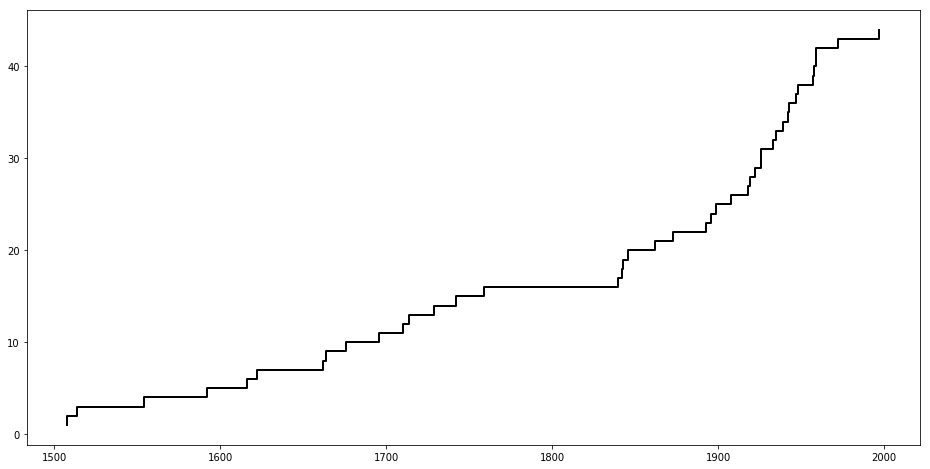

In [464]:
plot_comparative_completeness_time(crude_hellenic65)

6.0


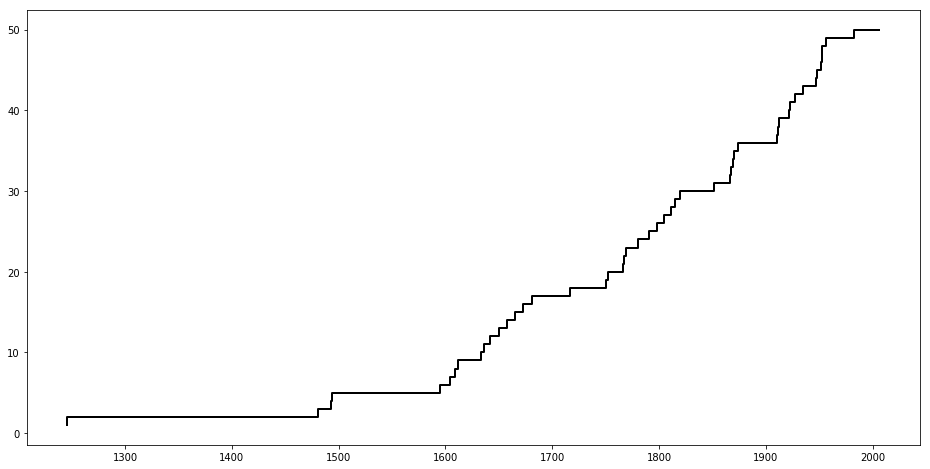

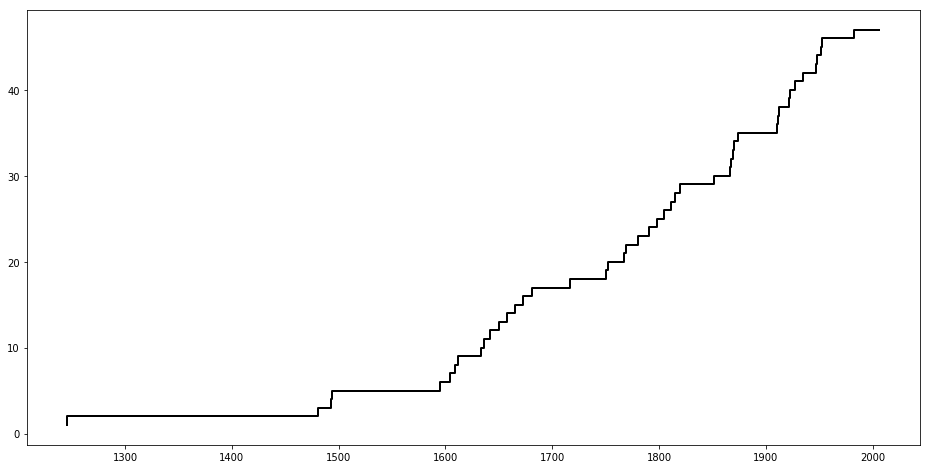

In [465]:
plot_comparative_completeness_time(crude_hellenic7)

0.0


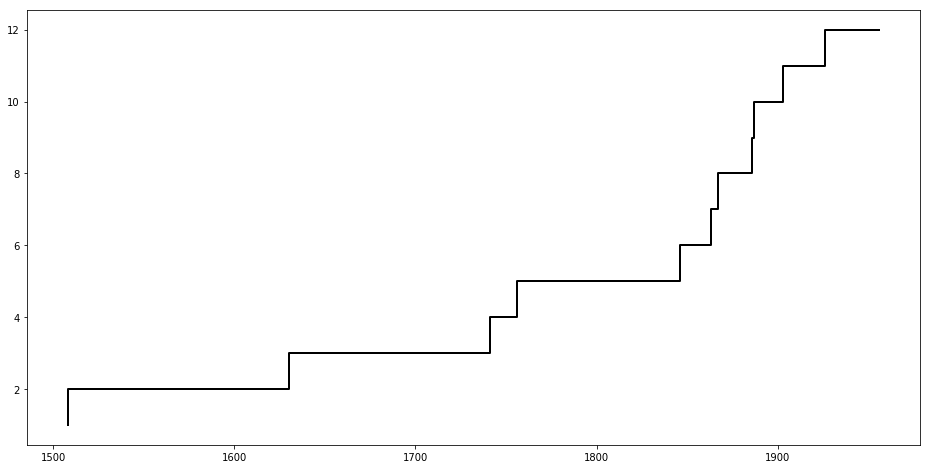

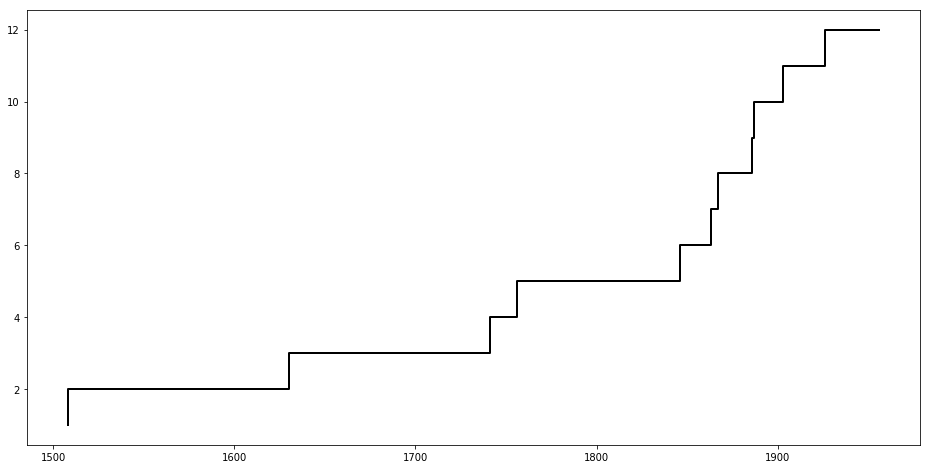

In [466]:
plot_comparative_completeness_time(crude_hellenic75)

0.0


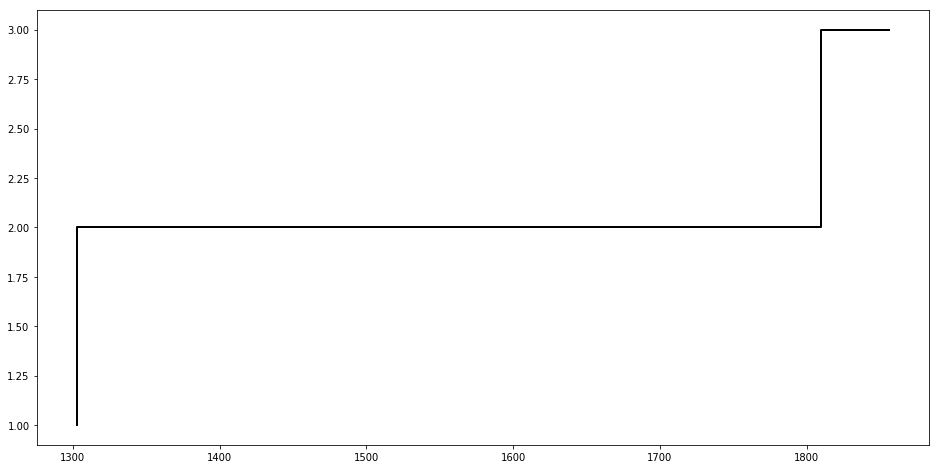

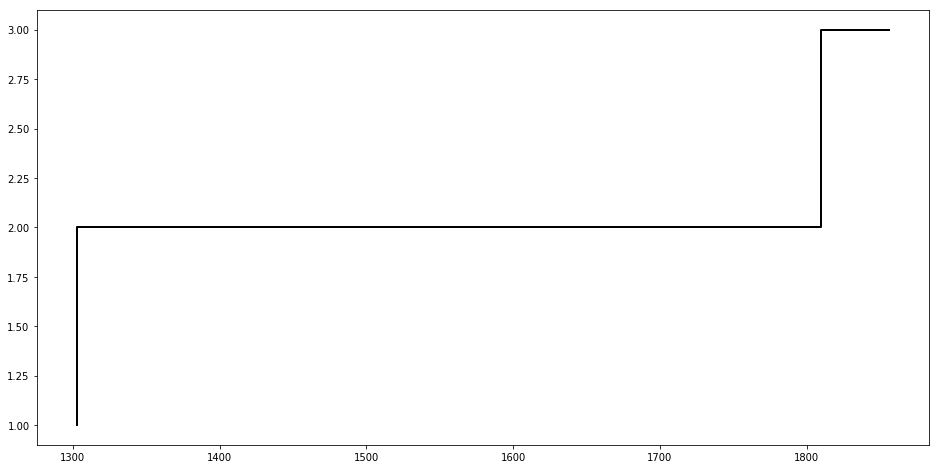

In [467]:
plot_comparative_completeness_time(crude_hellenic8)

In [824]:
def calculate_completeness_time(name):
    
    """
    Calculating the cumulitave number of the earthquakes.
    As an input receives the dataframe of the earthquake catalog. Returns: the original
    dataframe with two additional columns: Count column of ones; and Cum_Count with cumulative 
    sum of the earthquakes; and one column less (indeces of the earthquake location inside the 
    hellenic arc polygon)
    """
    
    # deleting the column of indeces of the earthquake location inside the hellenic arc polygon
    name = name.drop(['hellenic'], axis=1)
    
    # adding the column of ones
    name['Count'] = np.ones(len(name))
    
    # adding the column of the cumulative sum of the earthquakes
    name['Cum_Count'] = name['Count'].cumsum()
    return name

In [825]:
hellenic5 = calculate_completeness_time(crude_hellenic5)

In [692]:
Declustered = crude_hellenic4.iloc[:,:][crude_hellenic4.Declustering == True]

In [693]:
declustered4 = calculate_completeness_time(Declustered)

In [486]:
dependent_percentage = (len(crude_hellenic5) - np.sum(crude_hellenic5['Declustering']))/len(crude_hellenic5)*100

In [487]:
dependent_percentage

62.279151943462892

Text(0,0.5,'Normalized cumulative number of earthquakes')

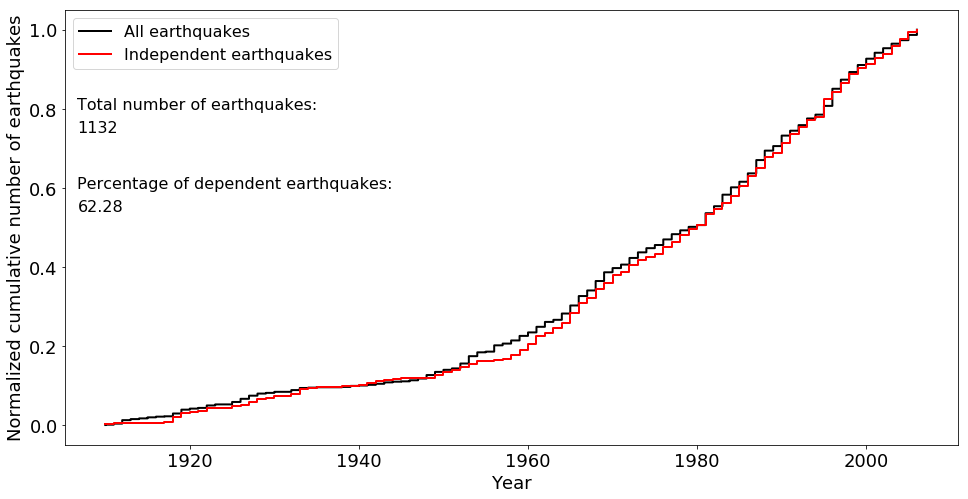

In [544]:
# Plotting on the same graph the normalized cumulitave number of the declustered and nondeclustered earthquakes.
fig = plt.figure(figsize = (16, 8))
plt.step(hellenic5['year'], hellenic5['Cum_Count']/np.max(hellenic5['Cum_Count']), color = 'k', linewidth=2.0, 
         label = 'All earthquakes')
plt.step(declustered5['year'], declustered5['Cum_Count']/np.max(declustered5['Cum_Count']), color = 'r', 
         linewidth=2.0, label = 'Independent earthquakes')
plt.legend(fontsize=16)
xloc = np.min(hellenic5['year']) 
plt.text(xloc - 3.3, 0.8, 'Total number of earthquakes:', fontsize=16)
plt.text(xloc - 3.3, 0.74, int(np.max(hellenic5['Cum_Count'])), fontsize=16)
plt.text(xloc - 3.3, 0.6, 'Percentage of dependent earthquakes:', fontsize=16)
plt.text(xloc - 3.3, 0.54, np.round(dependent_percentage, 2), fontsize=16)
plt.xticks(fontsize=18, rotation=0)
plt.yticks(fontsize=18, rotation=0)
plt.xlabel('Year', fontsize=18)
plt.ylabel('Normalized cumulative number of earthquakes', fontsize=18, rotation=90)

In [711]:
def plot_normalized_comparative_completeness_time(name):
   
    """
    Plotting the normalized cumulitave number of the declustered and nondeclustered earthquakes.
    As an input receives the dataframe of the earthquake catalog. Plots on the same graph
    the normalized cumulitave number of the independent and the all earthquakes. Prints the 
    total number of earthquakes and the percentage of the dependent earthquakes.
    """
    
    # calculating the cumulative number of all the earthquakes
    all_earthquakes = calculate_completeness_time(name)
    
    # choosing only the independent earthquakes
    Declustered = name.iloc[:,:][name.Declustering == True]
    
    # calculating the cumulative number of the independent earthquakes
    declustered_earthquakes = calculate_completeness_time(Declustered)
    
    # calculating the percentage of the dependent earthquakes
    dependent_percentage = (len(name) - np.sum(name['Declustering']))/len(name)*100
    
    # plotting the staircase graph of normalized cumulitave number of the independent and all the earthquakes.
    fig = plt.figure(figsize = (16, 8))
    plt.step(all_earthquakes['year'], all_earthquakes['Cum_Count']/np.max(all_earthquakes['Cum_Count']), 
             color = 'k', linewidth=2.0, label = 'All earthquakes')
    plt.step(declustered_earthquakes['year'], declustered_earthquakes['Cum_Count']/np.max(declustered_earthquakes['Cum_Count']), 
             color = 'r', linewidth=2.0, label = 'Independent earthquakes')
    plt.legend(fontsize=16)
    xloc = np.min(all_earthquakes['year']) 
    plt.text(xloc - 2.3, 0.8, 'Total number of earthquakes:', fontsize=16)
    plt.text(xloc - 2.3, 0.74, int(np.max(all_earthquakes['Cum_Count'])), fontsize=16)
    plt.text(xloc - 2.3, 0.6, 'Percentage of dependent earthquakes:', fontsize=16)
    plt.text(xloc - 2.3, 0.54, np.round(dependent_percentage, 2), fontsize=16)
    plt.xticks(fontsize=18, rotation=0)
    plt.yticks(fontsize=18, rotation=0)
    plt.xlabel('Year', fontsize=18)
    plt.ylabel('Normalized cumulative number of earthquakes', fontsize=18, rotation=90)

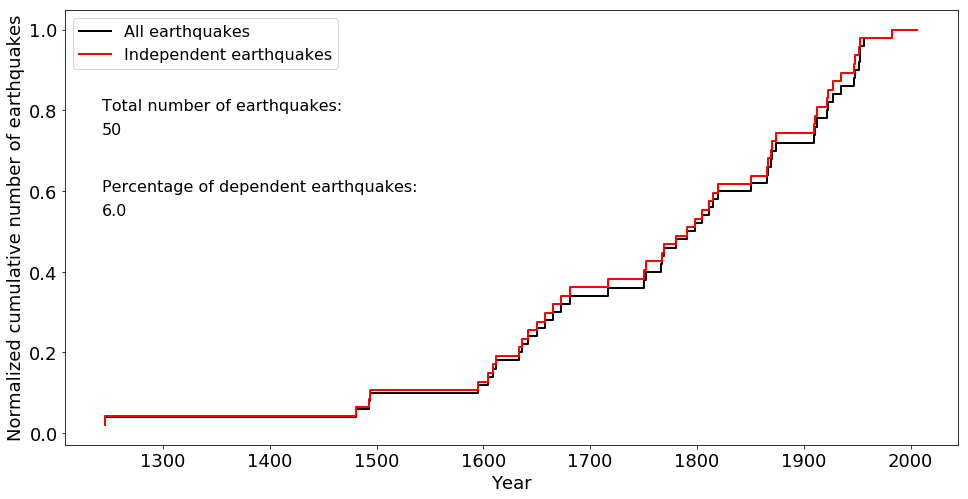

In [550]:
plot_normalized_comparative_completeness_time(crude_hellenic7)

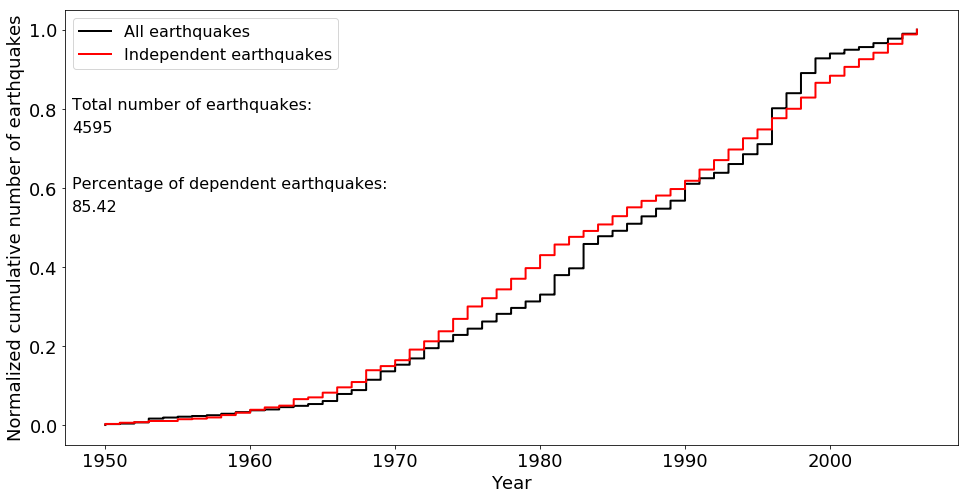

In [712]:
plot_normalized_comparative_completeness_time(crude_hellenic45)

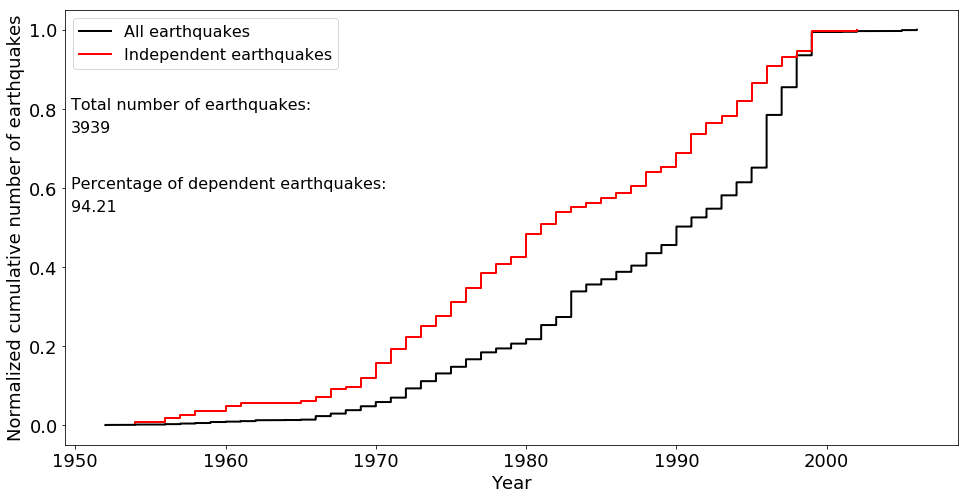

In [713]:
plot_normalized_comparative_completeness_time(crude_hellenic4)

In [604]:
Declustered = crude_hellenic55.iloc[:,:][crude_hellenic55.Declustering == True]

In [605]:
declustered55 = calculate_completeness_time(Declustered)

Text(0,0.5,'Normalized cumulative number of earthquakes')

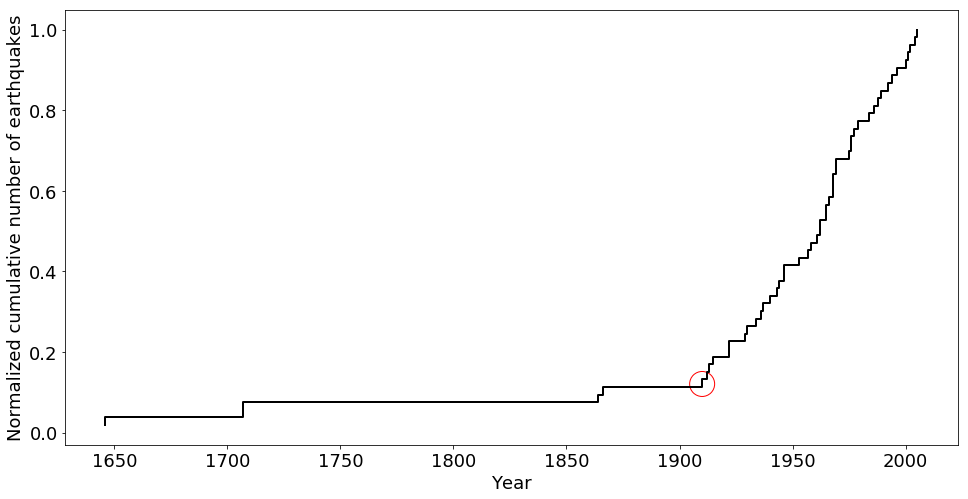

In [526]:
# defining the completeness time for 5.75 < Mw < 6.25
fig = plt.figure(figsize = (16, 8))

plt.step(declustered6['year'], declustered6['Cum_Count']/np.max(declustered6['Cum_Count']), color = 'k', 
         linewidth=2.0)
plt.scatter(1910, 6.4/np.max(declustered6['Cum_Count']), 625, marker = 'o', color = 'r', facecolors='none')
plt.xticks(fontsize=18, rotation=0)
plt.yticks(fontsize=18, rotation=0)
plt.xlabel('Year', fontsize=18)
plt.ylabel('Normalized cumulative number of earthquakes', fontsize=18, rotation=90)

Text(0,0.5,'Normalized cumulative number of earthquakes')

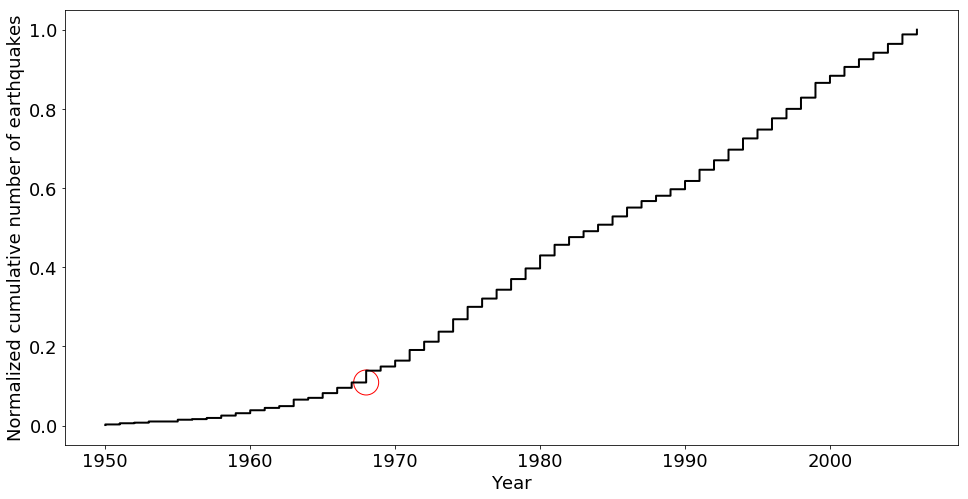

In [706]:
fig = plt.figure(figsize = (16, 8))

plt.step(declustered45['year'], declustered45['Cum_Count']/np.max(declustered45['Cum_Count']), color = 'k', 
         linewidth=2.0)
plt.scatter(1968, 73/np.max(declustered45['Cum_Count']), 625, marker = 'o', color = 'r', facecolors='none')
plt.xticks(fontsize=18, rotation=0)
plt.yticks(fontsize=18, rotation=0)
plt.xlabel('Year', fontsize=18)
plt.ylabel('Normalized cumulative number of earthquakes', fontsize=18, rotation=90)

Text(0,0.5,'Normalized cumulative number of earthquakes')

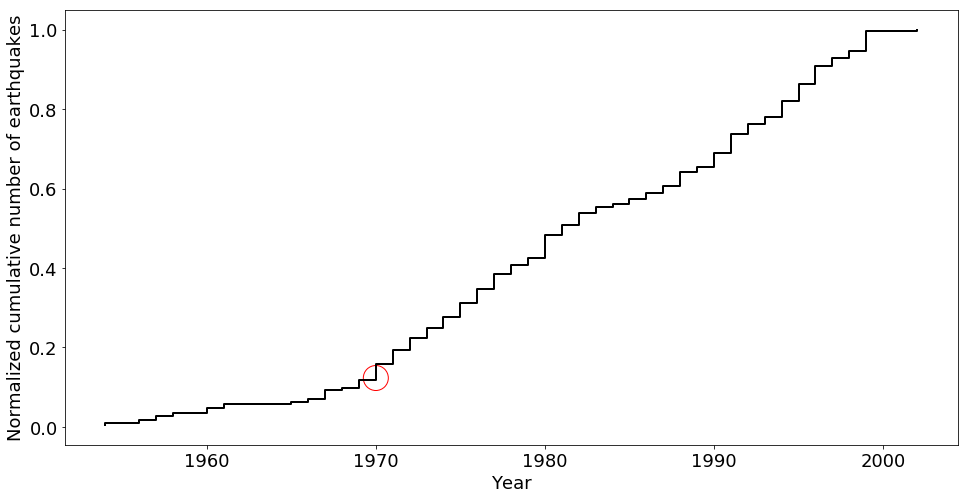

In [718]:
fig = plt.figure(figsize = (16, 8))

plt.step(declustered4['year'], declustered4['Cum_Count']/np.max(declustered4['Cum_Count']), color = 'k', 
         linewidth=2.0)
plt.scatter(1970, 28/np.max(declustered4['Cum_Count']), 625, marker = 'o', color = 'r', facecolors='none')
plt.xticks(fontsize=18, rotation=0)
plt.yticks(fontsize=18, rotation=0)
plt.xlabel('Year', fontsize=18)
plt.ylabel('Normalized cumulative number of earthquakes', fontsize=18, rotation=90)

In [559]:
hellenic75 = calculate_completeness_time(crude_hellenic75)

Text(0,0.5,'Normalized cumulative number of earthquakes')

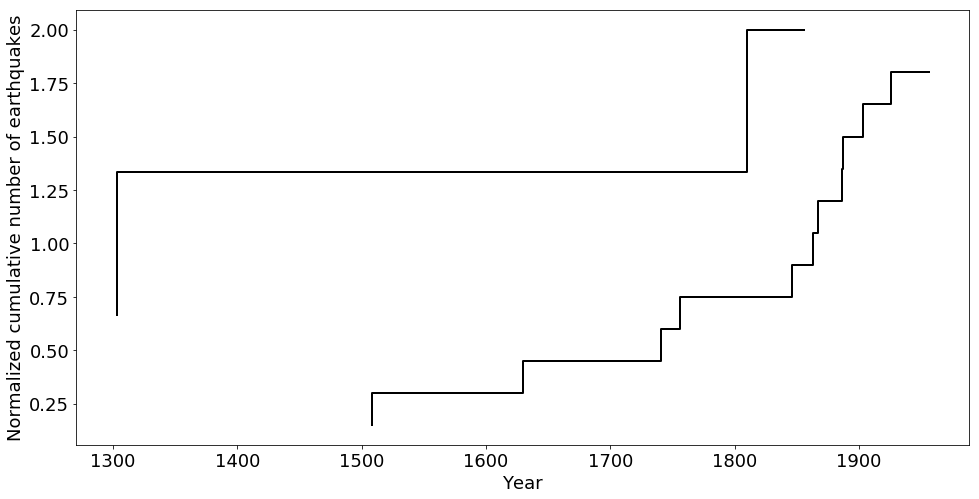

In [560]:
fig = plt.figure(figsize = (16, 8))


plt.step(hellenic8['year'], hellenic8['Cum_Count']*2/np.max(hellenic8['Cum_Count']), color = 'k', 
         linewidth=2.0)
plt.step(hellenic75['year'], hellenic75['Cum_Count']*1.8/np.max(hellenic75['Cum_Count']), color = 'k', 
         linewidth=2.0)
#plt.scatter(1910, 6.4/np.max(declustered6['Cum_Count']), 625, marker = 'o', color = 'r', facecolors='none')
plt.xticks(fontsize=18, rotation=0)
plt.yticks(fontsize=18, rotation=0)
plt.xlabel('Year', fontsize=18)
plt.ylabel('Normalized cumulative number of earthquakes', fontsize=18, rotation=90)

In [563]:
# defining dummy normalized cumulative sum value that all the graphs will start with
tempy = 0.1

In [564]:
# adding the dummy value at the beginning of the cumulative sum vector
tempy = np.append(tempy,hellenic8['Cum_Count'].values)

In [562]:
hellenic8['Cum_Count']

76      1.0
822     2.0
1054    3.0
Name: Cum_Count, dtype: float64

In [572]:
# vector of cumulative sum values of erathquakes with magnitudes 7.75 < Mw < 8.25 for plotting
tempy

array([ 0.1,  1. ,  2. ,  3. ,  3. ])

In [571]:
# adding entry at the end of the cumulative sum vector equal to the last value
tempy = np.append(tempy,tempy[len(tempy) - 1])

In [576]:
# adding entry at the beginning of the years vector equal to the first value
tempx = hellenic8['year'].values[0]
tempx = np.append(tempx,hellenic8['year'].values)

In [579]:
# adding entry at the ent of the years vector equal to 2006
tempx = np.append(tempx,2006)

In [580]:
tempx

array([1303, 1303, 1810, 1856, 2006])

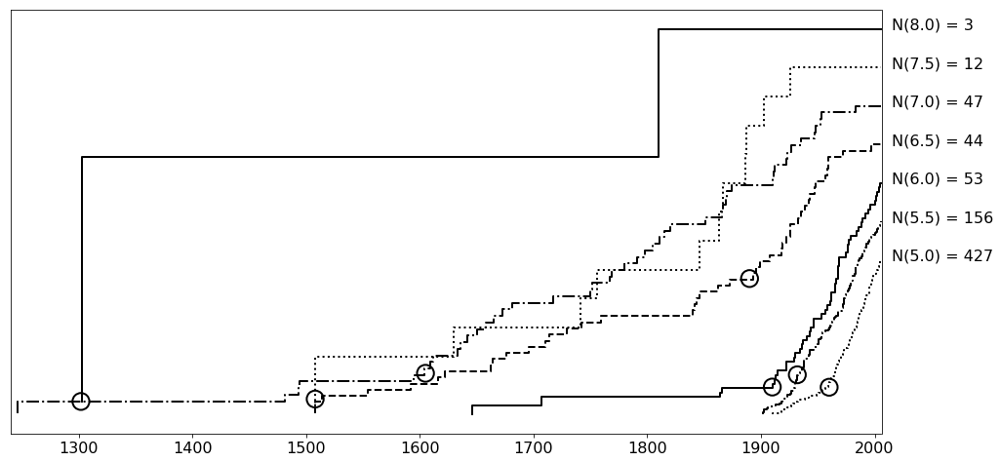

In [685]:
# plotting the cumulative graph of catalogue entries (N) for the Hellenic arc for each magnitude class 
# starting from Mw = 5. 
# The ordinate, displaying the cumulative numbers, is given in arbitrary units, i.e. different for each 
# graph representing one magnitude class. The open dots indicate the times from which on a sufficient 
# completeness is assumed. 
fig = plt.figure(figsize = (16, 8))
[tempx, tempy] = calculate_tempxy(hellenic8)
plt.step(tempx, tempy*2/np.max(hellenic8['Cum_Count']), color = 'k', 
         linewidth=2.0)
plt.xlim(1240, 2006)
[tempx, tempy] = calculate_tempxy(hellenic75)
plt.step(tempx, tempy*1.8/np.max(hellenic75['Cum_Count']), color = 'k', linestyle = ':', 
         linewidth=2.0)

[tempx, tempy] = calculate_tempxy(declustered7)
plt.step(tempx, tempy*1.6/np.max(declustered7['Cum_Count']), color = 'k', linestyle = '-.',
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered65)
plt.step(tempx, tempy*1.4/np.max(declustered65['Cum_Count']), color = 'k', linestyle = '--',
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered6)
plt.step(tempx, tempy*1.2/np.max(declustered6['Cum_Count']), color = 'k', 
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered55)
plt.step(tempx, tempy/np.max(declustered55['Cum_Count']), color = 'k', linestyle = '-.',
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered5)
plt.step(tempx, tempy*0.8/np.max(declustered5['Cum_Count']), color = 'k', linestyle = ':',
         linewidth=2.0)
plt.yticks([], [])
plt.xticks(fontsize=16, rotation=0)
plt.xlabel('Year', fontsize=18)
plt.text(2015, 2, 'N(8.0) = 3', fontsize=16)
plt.text(2015, 1.8, 'N(7.5) = 12', fontsize=16)
plt.text(2015, 1.6, 'N(7.0) = 47', fontsize=16)
plt.text(2015, 1.4, 'N(6.5) = 44', fontsize=16)
plt.text(2015, 1.2, 'N(6.0) = 53', fontsize=16)
plt.text(2015, 1.0, 'N(5.5) = 156', fontsize=16)
plt.text(2015, 0.8, 'N(5.0) = 427', fontsize=16)
plt.scatter(1910, 7.5/np.max(declustered6['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1932, 32/np.max(declustered55['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1960, 60/np.max(declustered5['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1890, 31/np.max(declustered65['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1605, 10/np.max(declustered7['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1508, 0.95/np.max(hellenic75['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1302, 0.2/np.max(hellenic8['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)

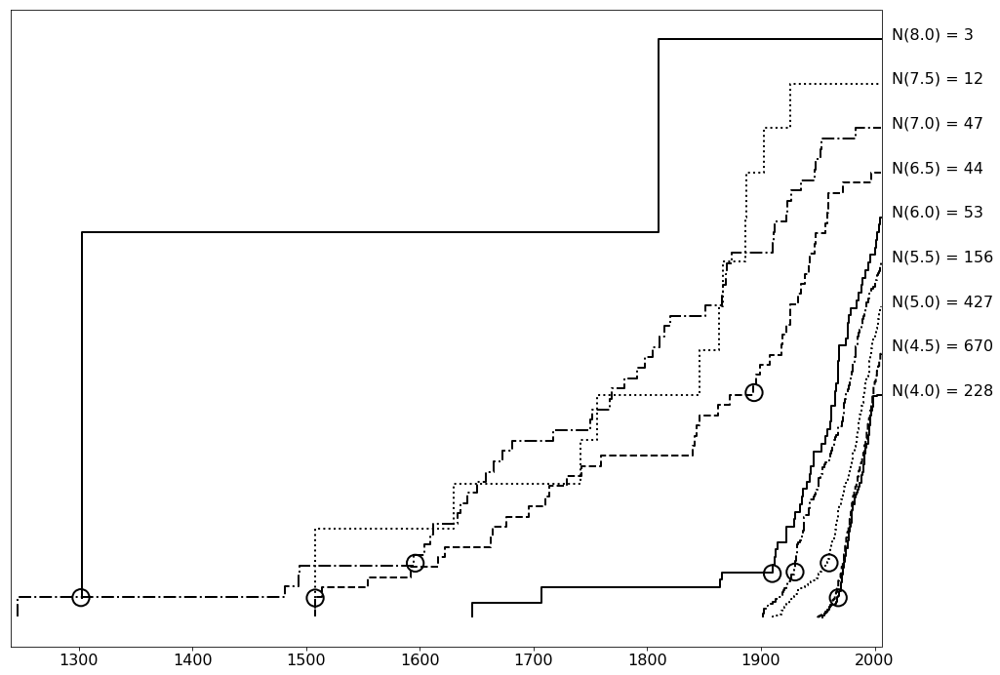

In [759]:
# plotting the cumulative graph of catalogue entries (N) for the Hellenic arc for each magnitude class 
# starting from Mw = 4. 
# The ordinate, displaying the cumulative numbers, is given in arbitrary units, i.e. different for each 
# graph representing one magnitude class. The open dots indicate the times from which on a sufficient 
# completeness is assumed. 
fig = plt.figure(figsize = (16, 12))
[tempx, tempy] = calculate_tempxy(hellenic8)
plt.step(tempx, tempy*2.6/np.max(hellenic8['Cum_Count']), color = 'k', 
         linewidth=2.0)
plt.xlim(1240, 2006)
[tempx, tempy] = calculate_tempxy(hellenic75)
plt.step(tempx, tempy*2.4/np.max(hellenic75['Cum_Count']), color = 'k', linestyle = ':', 
         linewidth=2.0)

[tempx, tempy] = calculate_tempxy(declustered7)
plt.step(tempx, tempy*2.2/np.max(declustered7['Cum_Count']), color = 'k', linestyle = '-.',
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered65)
plt.step(tempx, tempy*2/np.max(declustered65['Cum_Count']), color = 'k', linestyle = '--',
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered6)
plt.step(tempx, tempy*1.8/np.max(declustered6['Cum_Count']), color = 'k', 
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered55)
plt.step(tempx, tempy*1.6/np.max(declustered55['Cum_Count']), color = 'k', linestyle = '-.',
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered5)
plt.step(tempx, tempy*1.4/np.max(declustered5['Cum_Count']), color = 'k', linestyle = ':',
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered45)
plt.step(tempx, tempy*1.2/np.max(declustered45['Cum_Count']), color = 'k', linestyle = '--',
         linewidth=2.0)
[tempx, tempy] = calculate_tempxy(declustered4)
plt.step(tempx, tempy/np.max(declustered4['Cum_Count']), color = 'k',
         linewidth=2.0)
plt.yticks([], [])
plt.xticks(fontsize=16, rotation=0)
plt.text(2015, 2.6, 'N(8.0) = 3', fontsize=16)
plt.text(2015, 2.4, 'N(7.5) = 12', fontsize=16)
plt.text(2015, 2.2, 'N(7.0) = 47', fontsize=16)
plt.text(2015, 2.0, 'N(6.5) = 44', fontsize=16)
plt.text(2015, 1.8, 'N(6.0) = 53', fontsize=16)
plt.text(2015, 1.6, 'N(5.5) = 156', fontsize=16)
plt.text(2015, 1.4, 'N(5.0) = 427', fontsize=16)
plt.text(2015, 1.2, 'N(4.5) = 670', fontsize=16)
plt.text(2015, 1.0, 'N(4.0) = 228', fontsize=16)
plt.scatter(1968, 60/np.max(declustered45['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1960, 105/np.max(declustered5['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1930, 32/np.max(declustered55['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1910, 10.5/np.max(declustered6['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1894, 44.5/np.max(declustered65['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1596, 11.5/np.max(declustered7['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1508, 1.06/np.max(hellenic75['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)
plt.scatter(1302, 0.27/np.max(hellenic8['Cum_Count']), 300, marker = 'o', color = 'k', facecolors='none', linewidth=2.0)

In [587]:
def calculate_tempxy(name):
    
    """
    Expanding the x (Year) and the y (Cum_count) values for completness times graph drawing,
    that all the graphs for different magnitude classes will start at the same cumulative number
    and end at the same year.
    As an input receives the dataframe of the earthquake catalog. Returns x (Year) and the y (Cum_count) values
    for the graph plotting.
    """
    
    tempy = 0.1
    tempy = np.append(tempy,name['Cum_Count'].values)
    tempy = np.append(tempy,tempy[len(tempy) - 1])
    tempx = name['year'].values[0]
    tempx = np.append(tempx,name['year'].values)
    tempx = np.append(tempx,2006)
    return tempx, tempy

In [623]:
np.max(hellenic75['Cum_Count'])

12.0

In [630]:
np.max(declustered5['Cum_Count'])

427.0

In [771]:
# choosing complete part of catalog of independent earthquakes for each magnitude class
declustered7_complete = declustered7[(declustered7['year'] > 1595)]

In [773]:
declustered65_complete = declustered65[(declustered65['year'] > 1893)]
declustered6_complete = declustered6[(declustered6['year'] > 1909)]
declustered55_complete = declustered55[(declustered55['year'] > 1929)]
declustered5_complete = declustered5[(declustered5['year'] > 1959)]
declustered45_complete = declustered45[(declustered45['year'] > 1967)]
declustered4_complete = declustered4[(declustered4['year'] > 1969)]

In [770]:
declustered7

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,Count,Cum_Count
53,1246,,,,,35.10,24.00,,7,7,w,7.0,0.5,Pap,True,0.0,1.0,1.0
206,1481,10,3,,,36.40,28.60,,9,7.2,w,7.2,0.35,Pap,True,0.0,1.0,2.0
217,1493,8,18,,,36.70,27.10,,9,6.8,w,6.8,0.5,Pap,True,0.0,1.0,3.0
221,1494,7,1,,,34.90,24.20,,8,7.2,w,7.2,0.5,Pap,True,0.0,1.0,4.0
309,1595,11,26,,,34.90,25.30,,8,6.8,w,6.8,0.5,Pap,True,0.0,1.0,5.0
320,1604,,,,,35.80,25.20,,7,7,w,7.0,0.5,Pap,True,0.0,1.0,6.0
325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07,True,0.0,1.0,7.0
330,1612,11,8,,,35.50,25.20,,8,7,w,7.0,0.5,Pap,True,0.0,1.0,8.0
362,1633,11,5,,,37.70,20.80,,9,7,w,7.0,0.5,Pap,True,0.0,1.0,9.0
367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap,True,0.0,1.0,10.0


In [772]:
declustered7_complete

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,Count,Cum_Count
320,1604,,,,,35.80,25.20,,7,7,w,7.0,0.5,Pap,True,0.0,1.0,6.0
325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07,True,0.0,1.0,7.0
330,1612,11,8,,,35.50,25.20,,8,7,w,7.0,0.5,Pap,True,0.0,1.0,8.0
362,1633,11,5,,,37.70,20.80,,9,7,w,7.0,0.5,Pap,True,0.0,1.0,9.0
367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap,True,0.0,1.0,10.0
373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap,True,0.0,1.0,11.0
384,1650,10,9,,,36.50,25.50,,8,7,w,7.0,0.5,Pap,True,0.0,1.0,12.0
391,1658,8,24,,,38.20,20.40,,9,7,w,7.0,0.5,Pap,True,0.0,1.0,13.0
403,1665,1,,,,35.90,25.00,,8,7,w,7.0,0.5,Pap,True,0.0,1.0,14.0
417,1673,5,7,,,36.00,25.40,,7,7,w,7.0,0.5,Pap,True,0.0,1.0,15.0


In [720]:
np.max(declustered4['Cum_Count'])

228.0

In [760]:
hellenic8

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,Count,Cum_Count
76,1303,8,8,6,,35.0,27.0,,10,8,w,8.0,,Pdo07,True,0.0,1.0,1.0
822,1810,2,16,22,15,35.5,25.6,,10,7.8,w,7.8,0.35,Pap,True,0.0,1.0,2.0
1054,1856,10,12,2,45,35.6,26.0,,9,7.8,w,7.8,0.35,Pap,True,0.0,1.0,3.0


In [761]:
hellenic75

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,Count,Cum_Count
232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,1.0
355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap,True,0.0,1.0,2.0
586,1741,1,31,1,15,36.20,28.50,,8,7.3,w,7.3,,Pdo07,True,0.0,1.0,3.0
641,1756,2,13,,,36.30,27.50,,7,7.4,w,7.4,0.5,Pap,True,0.0,1.0,4.0
966,1846,3,28,17,,35.80,25.00,,7,7.3,w,7.3,0.35,Pap,True,0.0,1.0,5.0
1106,1863,4,22,21,30,36.40,27.60,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,6.0
1150,1867,2,4,4,19,38.05,20.30,,10,7.4,w,7.4,0.35,Pap,True,0.0,1.0,7.0
1343,1886,8,27,21,32,37.10,21.50,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,8.0
1354,1887,7,17,7,45,35.70,26.00,,7,7.5,w,7.5,0.35,Pap,True,0.0,1.0,9.0
1680,1903,8,11,4,32,36.36,22.97,80,11,7.4,w,7.4,0.35,Pap,True,0.0,1.0,10.0


In [762]:
# combining together two magnitude classes of catalog 
result = pd.concat([hellenic75, hellenic8])

In [763]:
result

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,Count,Cum_Count
232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,1.0
355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap,True,0.0,1.0,2.0
586,1741,1,31,1,15,36.20,28.50,,8,7.3,w,7.3,,Pdo07,True,0.0,1.0,3.0
641,1756,2,13,,,36.30,27.50,,7,7.4,w,7.4,0.5,Pap,True,0.0,1.0,4.0
966,1846,3,28,17,,35.80,25.00,,7,7.3,w,7.3,0.35,Pap,True,0.0,1.0,5.0
1106,1863,4,22,21,30,36.40,27.60,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,6.0
1150,1867,2,4,4,19,38.05,20.30,,10,7.4,w,7.4,0.35,Pap,True,0.0,1.0,7.0
1343,1886,8,27,21,32,37.10,21.50,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,8.0
1354,1887,7,17,7,45,35.70,26.00,,7,7.5,w,7.5,0.35,Pap,True,0.0,1.0,9.0
1680,1903,8,11,4,32,36.36,22.97,80,11,7.4,w,7.4,0.35,Pap,True,0.0,1.0,10.0


In [768]:
# sorting the catalog by time of the occurrence
result2 = result.sort_index()

In [769]:
result2

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,Count,Cum_Count
76,1303,8,8,6,,35.00,27.00,,10,8,w,8.0,,Pdo07,True,0.0,1.0,1.0
232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,1.0
355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap,True,0.0,1.0,2.0
586,1741,1,31,1,15,36.20,28.50,,8,7.3,w,7.3,,Pdo07,True,0.0,1.0,3.0
641,1756,2,13,,,36.30,27.50,,7,7.4,w,7.4,0.5,Pap,True,0.0,1.0,4.0
822,1810,2,16,22,15,35.50,25.60,,10,7.8,w,7.8,0.35,Pap,True,0.0,1.0,2.0
966,1846,3,28,17,,35.80,25.00,,7,7.3,w,7.3,0.35,Pap,True,0.0,1.0,5.0
1054,1856,10,12,2,45,35.60,26.00,,9,7.8,w,7.8,0.35,Pap,True,0.0,1.0,3.0
1106,1863,4,22,21,30,36.40,27.60,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,6.0
1150,1867,2,4,4,19,38.05,20.30,,10,7.4,w,7.4,0.35,Pap,True,0.0,1.0,7.0


In [777]:
# combining together complete parts of catalog of independent earthquakes of all magnitude classes
declustered_complete = pd.concat([hellenic75, hellenic8, declustered4_complete, declustered45_complete, 
                                  declustered5_complete, declustered55_complete, 
                                 declustered6_complete, declustered65_complete, declustered7_complete])

In [778]:
# sorting the complete part of catalog of independent earthquakes by time of the occurrence
declustered_complete = declustered_complete.sort_index()

In [779]:
declustered_complete

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,Count,Cum_Count
76,1303,8,8,6,,35.00,27.00,,10,8,w,8.0,,Pdo07,True,0.0,1.0,1.0
232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap,True,0.0,1.0,1.0
320,1604,,,,,35.80,25.20,,7,7,w,7.0,0.5,Pap,True,0.0,1.0,6.0
325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07,True,0.0,1.0,7.0
330,1612,11,8,,,35.50,25.20,,8,7,w,7.0,0.5,Pap,True,0.0,1.0,8.0
355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap,True,0.0,1.0,2.0
362,1633,11,5,,,37.70,20.80,,9,7,w,7.0,0.5,Pap,True,0.0,1.0,9.0
367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap,True,0.0,1.0,10.0
373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap,True,0.0,1.0,11.0
384,1650,10,9,,,36.50,25.50,,8,7,w,7.0,0.5,Pap,True,0.0,1.0,12.0


In [786]:
# dropping the unnecessary columns
declustered_complete = declustered_complete.drop(['Declustering', 'Decindex', 'Count', 'Cum_Count'], axis=1)

In [787]:
declustered_complete

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference
76,1303,8,8,6,,35.00,27.00,,10,8,w,8.0,,Pdo07
232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap
320,1604,,,,,35.80,25.20,,7,7,w,7.0,0.5,Pap
325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07
330,1612,11,8,,,35.50,25.20,,8,7,w,7.0,0.5,Pap
355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap
362,1633,11,5,,,37.70,20.80,,9,7,w,7.0,0.5,Pap
367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap
373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap
384,1650,10,9,,,36.50,25.50,,8,7,w,7.0,0.5,Pap


In [781]:
# choosing complete part of catalog of all the earthquakes for each magnitude class
nondeclustered7_complete = crude_hellenic7[(crude_hellenic7['year'] > 1595)]
nondeclustered65_complete = crude_hellenic65[(crude_hellenic65['year'] > 1893)]
nondeclustered6_complete = crude_hellenic6[(crude_hellenic6['year'] > 1909)]
nondeclustered55_complete = crude_hellenic55[(crude_hellenic55['year'] > 1929)]
nondeclustered5_complete = crude_hellenic5[(crude_hellenic5['year'] > 1959)]
nondeclustered45_complete = crude_hellenic45[(crude_hellenic45['year'] > 1967)]
nondeclustered4_complete = crude_hellenic4[(crude_hellenic4['year'] > 1969)]

In [782]:
# combining together complete parts of catalog of all the earthquakes of all magnitude classes
nondeclustered_complete = pd.concat([crude_hellenic75, crude_hellenic8, nondeclustered4_complete, 
                                     nondeclustered45_complete, nondeclustered5_complete, nondeclustered55_complete, 
                                 nondeclustered6_complete, nondeclustered65_complete, nondeclustered7_complete])

In [785]:
nondeclustered_complete

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,hellenic
76,1303,8,8,6,,35.00,27.00,,10,8,w,8.0,,Pdo07,True,0.0,True
232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap,True,0.0,True
320,1604,,,,,35.80,25.20,,7,7,w,7.0,0.5,Pap,True,0.0,True
325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07,True,0.0,True
330,1612,11,8,,,35.50,25.20,,8,7,w,7.0,0.5,Pap,True,0.0,True
355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap,True,0.0,True
362,1633,11,5,,,37.70,20.80,,9,7,w,7.0,0.5,Pap,True,0.0,True
367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap,True,0.0,True
373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap,True,0.0,True
384,1650,10,9,,,36.50,25.50,,8,7,w,7.0,0.5,Pap,True,0.0,True


In [784]:
# sorting the complete part of catalog of all the earthquakes by time of the occurrence
nondeclustered_complete = nondeclustered_complete.sort_index()

In [788]:
# dropping the unnecessary columns
nondeclustered_complete = nondeclustered_complete.drop(['Declustering', 'Decindex', 'hellenic'], axis=1)

In [789]:
nondeclustered_complete

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference
76,1303,8,8,6,,35.00,27.00,,10,8,w,8.0,,Pdo07
232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap
320,1604,,,,,35.80,25.20,,7,7,w,7.0,0.5,Pap
325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07
330,1612,11,8,,,35.50,25.20,,8,7,w,7.0,0.5,Pap
355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap
362,1633,11,5,,,37.70,20.80,,9,7,w,7.0,0.5,Pap
367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap
373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap
384,1650,10,9,,,36.50,25.50,,8,7,w,7.0,0.5,Pap


In [799]:
# saving the complete catalogs
declustered_complete.to_csv('earthquakes/declustered_complete.csv')
nondeclustered_complete.to_csv('earthquakes/nondeclustered_complete.csv')

In [797]:
a = pd.read_table('earthquakes/declustered_complete.csv', sep = ',', na_values = ' ')

In [798]:
a

,Unnamed: 0,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference
0,76,1303,8,8,6,,35.00,27.00,,10,8.0,w,8.0,,Pdo07
1,232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap
2,320,1604,,,,,35.80,25.20,,7,7.0,w,7.0,0.5,Pap
3,325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07
4,330,1612,11,8,,,35.50,25.20,,8,7.0,w,7.0,0.5,Pap
5,355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap
6,362,1633,11,5,,,37.70,20.80,,9,7.0,w,7.0,0.5,Pap
7,367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap
8,373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap
9,384,1650,10,9,,,36.50,25.50,,8,7.0,w,7.0,0.5,Pap


In [800]:
b = pd.read_table('earthquakes/nondeclustered_complete.csv', sep = ',', na_values = ' ')

In [801]:
b

,Unnamed: 0,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference
0,76,1303,8,8,6,,35.00,27.00,,10,8.0,w,8.0,,Pdo07
1,232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap
2,320,1604,,,,,35.80,25.20,,7,7.0,w,7.0,0.5,Pap
3,325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07
4,330,1612,11,8,,,35.50,25.20,,8,7.0,w,7.0,0.5,Pap
5,355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap
6,362,1633,11,5,,,37.70,20.80,,9,7.0,w,7.0,0.5,Pap
7,367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap
8,373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap
9,384,1650,10,9,,,36.50,25.50,,8,7.0,w,7.0,0.5,Pap


In [802]:
cyprian_arc = pd.read_csv('earthquakes/first_cyprian_arc.csv', header=None)

In [804]:
lats_vect = cyprian_arc[1].values
lons_vect = cyprian_arc[0].values

In [806]:
lats_vect = np.append(lats_vect, lats_vect[0])
lons_vect = np.append(lons_vect, lons_vect[0])

In [807]:
lons_lats_vect = np.column_stack((lons_vect, lats_vect)) # Reshape coordinates
polygon = Polygon(lons_lats_vect) # create polygon

In [826]:
length = len(lon)
ind = []

# checking each entry in the earthquake catalog if it is located inside the hellenic arc polygon
# (True if it is and False if it isn't)
for i in range(length):
    dummy_ind = polygon.contains(Point(lon[i],lat[i]))
    ind.append(dummy_ind)
    
# adding the column of the indeces to the earthquakes dataframe
all_earthquakes['cyprian'] = ind

# extracting the hellenic arc earthquakes from the all earthquakes
crude_cyprian = all_earthquakes.iloc[:,:][all_earthquakes.cyprian == True]

In [827]:
crude_cyprian4 = crude_cyprian[(crude_cyprian['Mw '] > 3.75) & (crude_cyprian['Mw '] < 4.25)]
crude_cyprian45 = crude_cyprian[(crude_cyprian['Mw '] > 4.25) & (crude_cyprian['Mw '] < 4.75)]
crude_cyprian5 = crude_cyprian[(crude_cyprian['Mw '] > 4.75) & (crude_cyprian['Mw '] < 5.25)]
crude_cyprian55 = crude_cyprian[(crude_cyprian['Mw '] > 5.25) & (crude_cyprian['Mw '] < 5.75)]
crude_cyprian6 = crude_cyprian[(crude_cyprian['Mw '] > 5.75) & (crude_cyprian['Mw '] < 6.25)]
crude_cyprian65 = crude_cyprian[(crude_cyprian['Mw '] > 6.25) & (crude_cyprian['Mw '] < 6.75)]
crude_cyprian7 = crude_cyprian[(crude_cyprian['Mw '] > 6.75) & (crude_cyprian['Mw '] < 7.25)]
crude_cyprian75 = crude_cyprian[(crude_cyprian['Mw '] > 7.25) & (crude_cyprian['Mw '] < 7.75)]
#crude_cyprian8 = crude_cyprian[(crude_cyprian['Mw '] > 7.75) & (crude_cyprian['Mw '] < 8.25)]

In [810]:
crude_cyprian8 = crude_cyprian[(crude_cyprian['Mw '] > 7.75) & (crude_cyprian['Mw '] < 8.25)]

In [811]:
crude_cyprian8

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,hellenic,cyprian


In [815]:
crude_cyprian = crude_cyprian.drop(['hellenic','cyprian'], axis=1)

In [817]:
crude_cyprian4

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex
5572,1964,1,7,22,14,34.50,32.80,,,4,w,4.0,,Pou,True,0.0
5687,1964,11,17,22,52,34.95,35.08,10,,4.3,L,4.0,,AFS,True,0.0
7741,1970,4,4,4,48,34.20,33.70,33,,4.2,w,4.2,,Pou,True,0.0
8119,1970,12,27,8,18,34.20,33.70,,,4.1,w,4.1,,Pou,True,0.0
10538,1977,1,21,20,34,34.30,32.40,,,4.2,w,4.2,,Pou,True,0.0
10584,1977,3,16,23,59,34.76,34.04,,,4.1,w,4.1,,Pou,False,10563.0
11006,1978,4,21,19,12,34.51,33.02,33,,4,w,4.0,,Pou,True,0.0
15763,1985,6,8,22,52,34.83,32.47,45,,4,w,4.0,,Pou,False,15760.0
15893,1985,11,16,11,26,35.03,33.44,66,,4.1,w,4.1,,Pou,True,0.0
16555,1987,5,24,13,37,34.73,33.16,28,,4,w,4.0,,Pou,True,0.0


In [828]:
calculate_completeness_time(crude_cyprian4)

,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference,Declustering,Decindex,cyprian,Count,Cum_Count
5572,1964,1,7,22,14,34.50,32.80,,,4,w,4.0,,Pou,True,0.0,True,1.0,1.0
5687,1964,11,17,22,52,34.95,35.08,10,,4.3,L,4.0,,AFS,True,0.0,True,1.0,2.0
7741,1970,4,4,4,48,34.20,33.70,33,,4.2,w,4.2,,Pou,True,0.0,True,1.0,3.0
8119,1970,12,27,8,18,34.20,33.70,,,4.1,w,4.1,,Pou,True,0.0,True,1.0,4.0
10538,1977,1,21,20,34,34.30,32.40,,,4.2,w,4.2,,Pou,True,0.0,True,1.0,5.0
10584,1977,3,16,23,59,34.76,34.04,,,4.1,w,4.1,,Pou,False,10563.0,True,1.0,6.0
11006,1978,4,21,19,12,34.51,33.02,33,,4,w,4.0,,Pou,True,0.0,True,1.0,7.0
15763,1985,6,8,22,52,34.83,32.47,45,,4,w,4.0,,Pou,False,15760.0,True,1.0,8.0
15893,1985,11,16,11,26,35.03,33.44,66,,4.1,w,4.1,,Pou,True,0.0,True,1.0,9.0
16555,1987,5,24,13,37,34.73,33.16,28,,4,w,4.0,,Pou,True,0.0,True,1.0,10.0


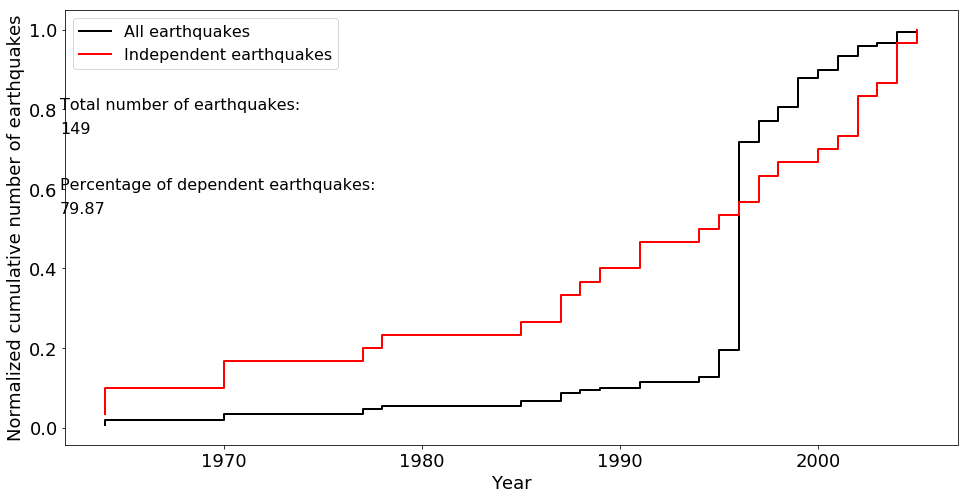

In [829]:
plot_normalized_comparative_completeness_time(crude_cyprian4)

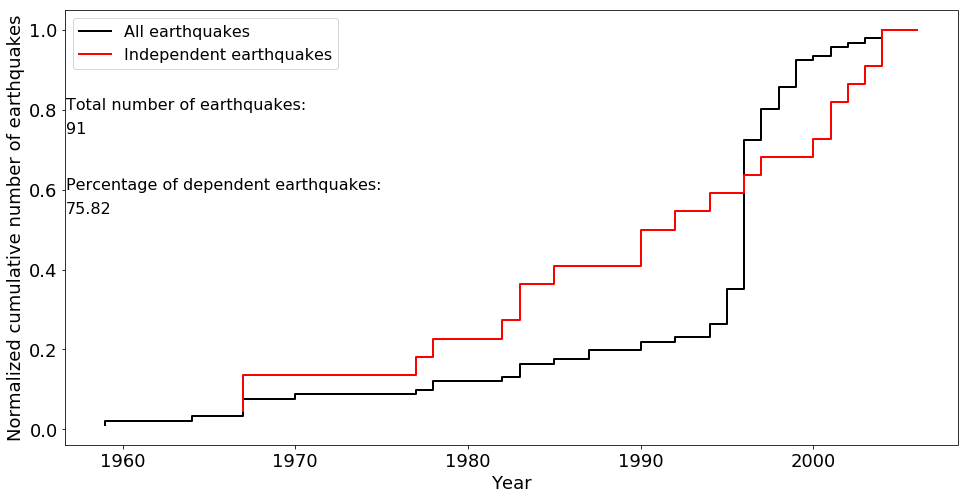

In [830]:
plot_normalized_comparative_completeness_time(crude_cyprian45)

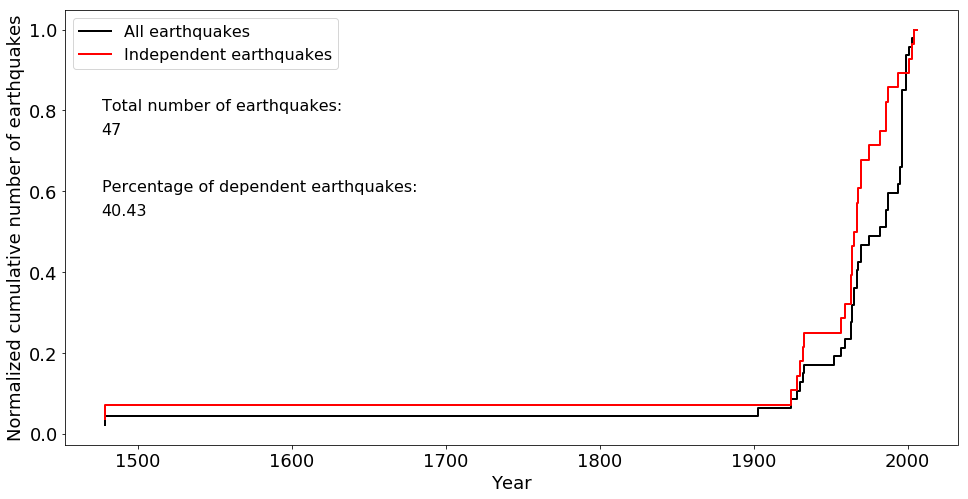

In [831]:
plot_normalized_comparative_completeness_time(crude_cyprian5)

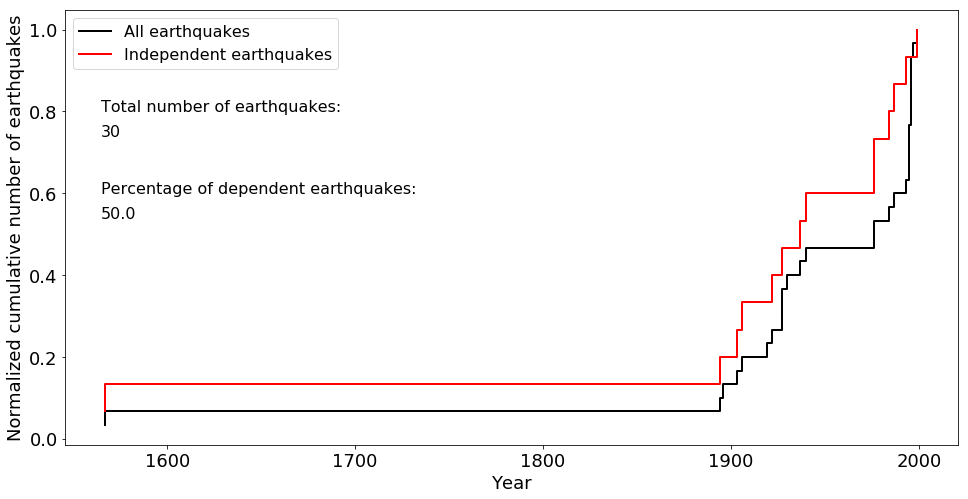

In [832]:
plot_normalized_comparative_completeness_time(crude_cyprian55)

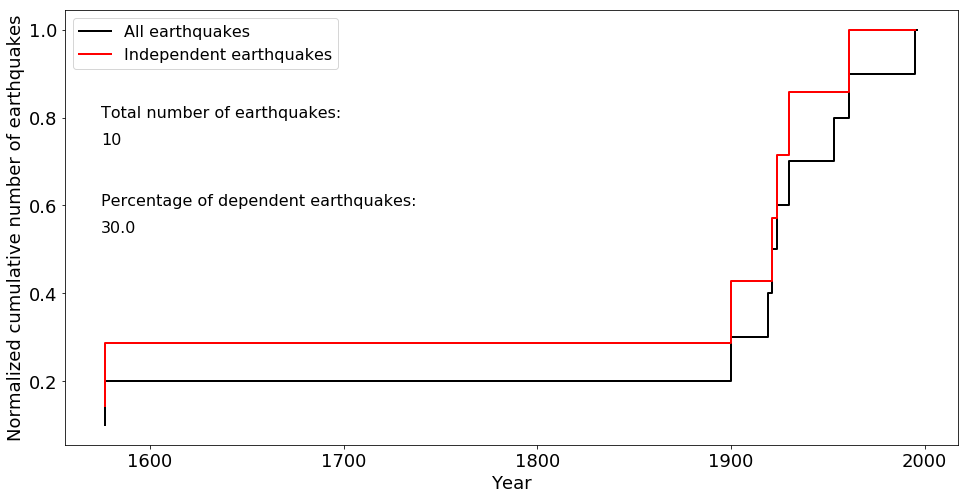

In [833]:
plot_normalized_comparative_completeness_time(crude_cyprian6)

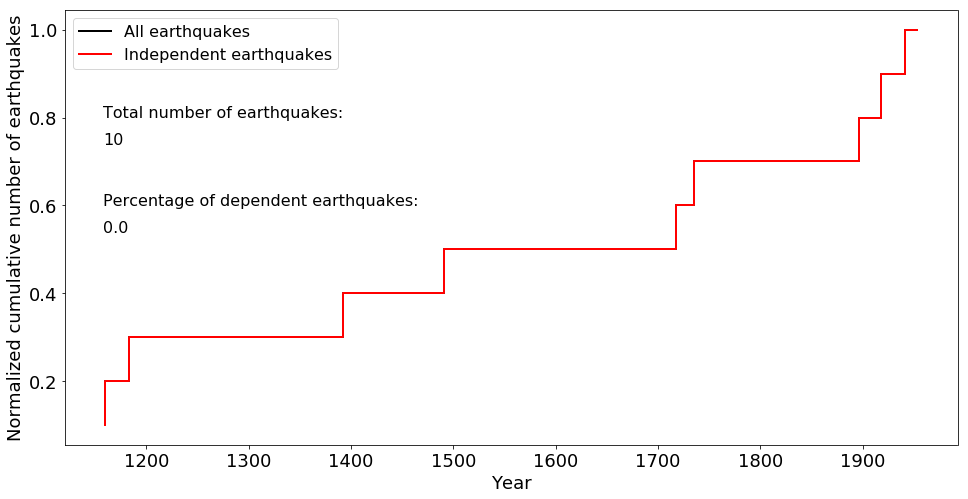

In [834]:
plot_normalized_comparative_completeness_time(crude_cyprian65)

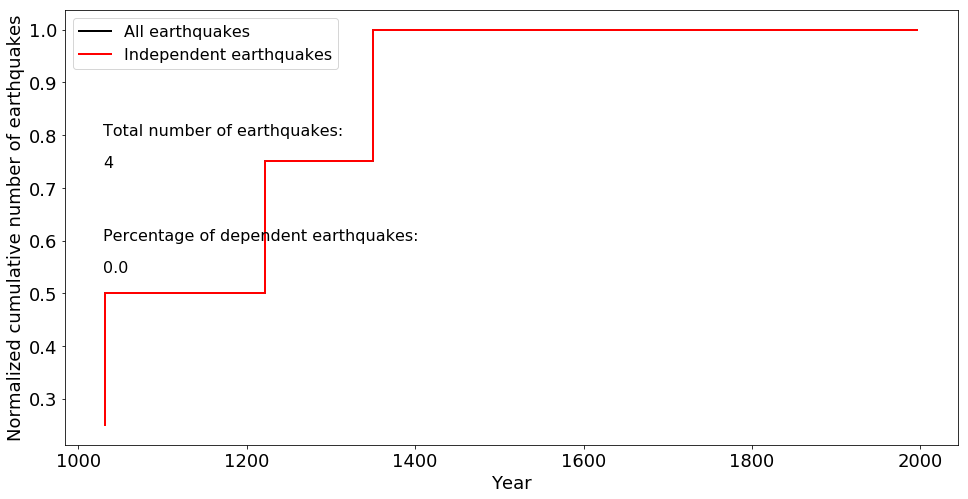

In [835]:
plot_normalized_comparative_completeness_time(crude_cyprian7)

In [837]:
np.max(crude_cyprian['Mw '].values)

7.0

# Recurrence parameters

In [2]:
# Defining initial points of magnitude increments
M = [3.8, 4.3, 4.8, 5.3, 5.8, 6.3, 6.8, 7.3, 7.8]

In [3]:
M

[3.8, 4.3, 4.8, 5.3, 5.8, 6.3, 6.8, 7.3, 7.8]

In [13]:
# Reading complete declustered earthquake catalog
declustered_complete = pd.read_table('earthquakes/declustered_complete.csv', sep = ',', na_values = ' ')

In [842]:
np.sum(declustered6_complete['Count'])

48.0

In [168]:
# Calculating number of earthquakes in each magnitude increment
N = np.zeros(len(M))
for i in range(len(cent_M)):
    N[i] = len(declustered_complete[(declustered_complete['Mw '] > (3.75 + i*0.5)) 
                                    & (declustered_complete['Mw '] < (4.25 + i*0.5))])

In [169]:
N

array([ 202.,  598.,  347.,  136.,   48.,   22.,   42.,   12.,    3.])

In [170]:
# Calculating cumulative number of earthquakes in each magnitude increment
N_cum = np.zeros(len(N))
N_cum[8] = N[8]
for i in range(len(N_cum)-1):
    N_cum[7-i] = N[7-i] + N_cum[8-i]

In [171]:
N_cum

array([ 1410.,  1208.,   610.,   263.,   127.,    79.,    57.,    15.,
           3.])

In [14]:
len(declustered_complete)

1410

Text(0,0.5,'Cumulative number of earthquakes')

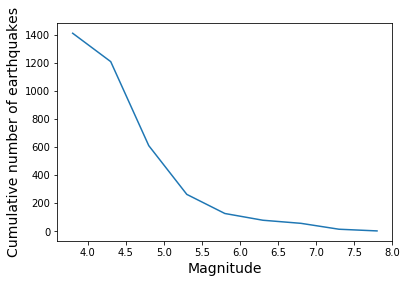

In [172]:
# plotting cumulative number of earthquakes vs magnitude
plt.plot(M,N_cum)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Cumulative number of earthquakes', fontsize=14, rotation=90)

Text(0,0.5,'Normalised cumulative number of earthquakes')

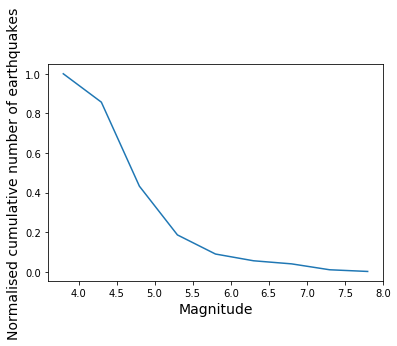

In [173]:
# plotting normalised cumulative number of earthquakes vs magnitude
plt.plot(M,N_cum/np.max(N_cum))
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Normalised cumulative number of earthquakes', fontsize=14, rotation=90)

Text(0,0.5,'log(N_cum)')

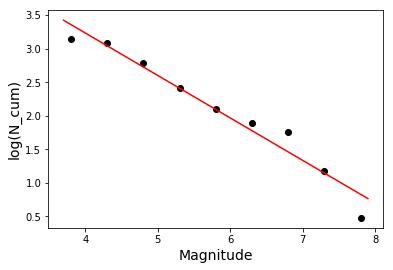

In [181]:
# plotting the logarithm of the cumulative number of earthquakes and its linear fit (Gutenberg-Richter)
plt.plot(M,np.log10(N_cum), 'ko')
plt.plot(x1,y1,'-r')
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('log(N_cum)', fontsize=14, rotation=90)

In [175]:
np.log10(N_cum)

array([ 3.14921911,  3.08206693,  2.78532984,  2.41995575,  2.10380372,
        1.89762709,  1.75587486,  1.17609126,  0.47712125])

In [176]:
fit = np.polyfit(M,np.log10(N_cum),1)

In [177]:
fit

array([-0.63291857,  5.76504879])

In [39]:
from scipy import stats

In [178]:
gradient, intercept, r_value, p_value, std_err = stats.linregress(M,np.log10(N_cum))

In [179]:
r_value**2

0.95623670718841391

In [180]:
mn=np.min(M) - 0.1
mx=np.max(M) + 0.1
x1=np.linspace(mn,mx,500)
y1=gradient*x1+intercept

In [182]:
p_value

5.1921529261397449e-06

In [183]:
b = -gradient

In [184]:
b

0.63291856911023447

In [186]:
beta = b*np.log(10)

In [187]:
beta # wrong until this point since observation periods are different for each magnitude increment

1.4573488623123476

In [22]:
# Defining compliteness times of each increment
comp_times = np.array([1969, 1967, 1959, 1929, 1909, 1893, 1595, 1500, 1300])

In [23]:
# Defining periods of observation of each increment
duration = 2006 - comp_times + 1

In [24]:
duration

array([ 38,  40,  48,  78,  98, 114, 412, 507, 707])

In [197]:
# wrong, since cumulative number of earthquakes is divided by the observation period of each increment

# calculation of annual earthquake rates for each magnitude increment 
N_normalized = N_cum/duration

In [198]:
# wrong
N_normalized

array([  3.71052632e+01,   3.02000000e+01,   1.27083333e+01,
         3.37179487e+00,   1.29591837e+00,   6.92982456e-01,
         1.38349515e-01,   2.95857988e-02,   4.24328147e-03])

In [190]:
N_cum

array([ 1410.,  1208.,   610.,   263.,   127.,    79.,    57.,    15.,
           3.])

In [897]:
3/707

0.004243281471004243

Text(0,0.5,'Cumulative annual rate of earthquakes')

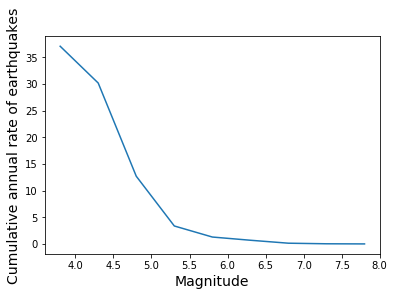

In [199]:
# wrong
plt.plot(M,N_normalized)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Cumulative annual rate of earthquakes', fontsize=14, rotation=90)

Text(0,0.5,'Annual rate')

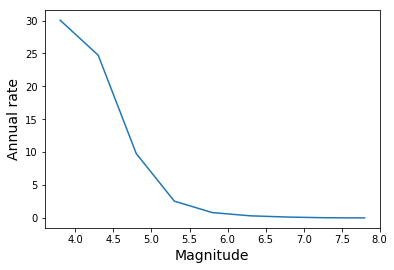

In [205]:
# Plotting cumulative annual earthquake rate
plt.plot(M,N_norm_cum)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Annual rate', fontsize=14, rotation=90)

In [200]:
# calculation of annual earthquake rate for each magnitude increment
N_normalized = N/duration

In [201]:
# calculation of cumulative annual earthquake rate
N_norm_cum = np.zeros(len(N_normalized))
N_norm_cum[8] = N_normalized[8]

In [202]:
for i in range(len(N_norm_cum)-1):
    N_norm_cum[7-i] = N_normalized[7-i] + N_norm_cum[8-i]

In [203]:
N_normalized

array([  5.31578947e+00,   1.49500000e+01,   7.22916667e+00,
         1.74358974e+00,   4.89795918e-01,   1.92982456e-01,
         1.01941748e-01,   2.36686391e-02,   4.24328147e-03])

In [50]:
N_norm_cum

array([  3.00511779e+01,   2.47353885e+01,   9.78538845e+00,
         2.55622179e+00,   8.12632043e-01,   3.22836124e-01,
         1.29853668e-01,   2.79119205e-02,   4.24328147e-03])

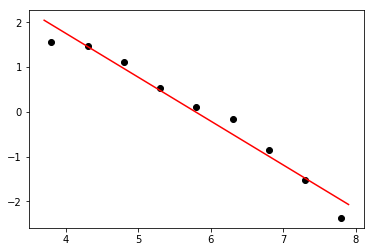

In [905]:
# wrong
plt.plot(M,np.log10(N_normalized), 'ko')
plt.plot(x2,y2,'-r')

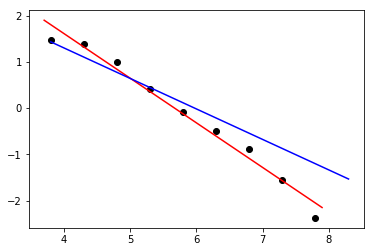

In [141]:
# plotting the logarithm of the annual earthquake rates calculated from the catalog 
# and predicted by Gutenberg-Richter relation and by Weichert method
plt.plot(M,np.log10(N_norm_cum), 'ko')
plt.plot(x2,y2,'-r')
plt.plot(Mforbeta,np.log10(beta_predicted), 'b') # Weichert

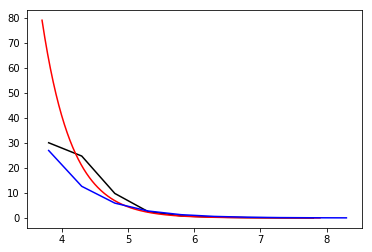

In [148]:
# plotting the annual earthquake rates calculated from the catalog and predicted by 
# Gutenberg-Richter relation and by Weichert method
plt.plot(M,N_norm_cum, 'k')
plt.plot(x2,10**y2,'-r')
plt.plot(Mforbeta,beta_predicted, 'b') # Weichert

(5, 8.5300000000000011)

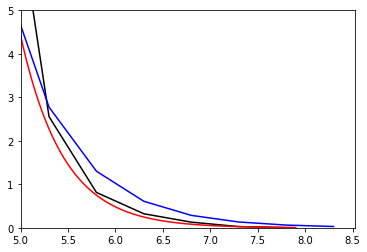

In [149]:
# The same plot as above zoomed in at M >= 5
plt.plot(M,N_norm_cum, 'k')
plt.plot(x2,10**y2,'-r')
plt.plot(Mforbeta,beta_predicted, 'b')
plt.ylim(ymin = 0, ymax = 5)
plt.xlim(xmin = 5)

In [917]:
# wrong
gradient1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(M,np.log10(N_normalized))

In [53]:
gradient1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(M,np.log10(N_norm_cum))

In [901]:
# wrong
r_value1**2

0.96790852364604163

In [54]:
r_value1**2

0.97928598094873498

In [903]:
# wrong
mn=np.min(M) - 0.1
mx=np.max(M) + 0.1
x2=np.linspace(mn,mx,500)
y2=gradient1*x1+intercept1

In [56]:
mn=np.min(M) - 0.1
mx=np.max(M) + 0.1
x2=np.linspace(mn,mx,500)
y2=gradient1*x2+intercept1

In [906]:
# wrong
beta1 = -gradient1*log(10)

In [907]:
# wrong
beta1

2.2570757613690362

In [157]:
beta1 = -gradient1*np.log(10)

In [158]:
beta1

2.217856852878223

In [159]:
b1 = -gradient1

In [910]:
# wrong
b1

0.98023554840015314

In [160]:
b1

0.96320299285632438

In [82]:
# Defining central points of magnitude increments (for maximum likelihood)
cent_M = np.array([4, 4.5, 5, 5.5, 6, 6.5, 7, 7.5, 8])

In [83]:
cent_M

array([ 4. ,  4.5,  5. ,  5.5,  6. ,  6.5,  7. ,  7.5,  8. ])

In [28]:
len(declustered_complete[(declustered_complete['Mw '] > 7.75) & (declustered_complete['Mw '] < 8.25)])

3

In [41]:
N = np.zeros(len(M))
for i in range(len(cent_M)):
    N[i] = len(declustered_complete[(declustered_complete['Mw '] > (3.75 + i*0.5)) 
                                    & (declustered_complete['Mw '] < (4.25 + i*0.5))])

In [36]:
i = 8

In [38]:
len(declustered_complete[(declustered_complete['Mw '] > (3.75 + i*0.5)) 
                         & (declustered_complete['Mw '] < (4.25 + i*0.5))])

3

In [120]:
# estimation of beta by maximum likelihood
beta = 1.5 # initial estimation of beta

while True:
    snm = np.sum(N*cent_M)
    ncount = np.sum(N)
    stmex = np.sum(duration*cent_M*np.exp(-beta*cent_M))
    sumtex = np.sum(duration*np.exp(-beta*cent_M))
    stm2x = np.sum(duration*cent_M*cent_M*np.exp(-beta*cent_M))
    sumexp = np.sum(np.exp(-beta*cent_M))
    dldb = stmex/sumtex
    d2ldb2 = ncount*(dldb**2 - stm2x/sumtex)
    dldb = dldb*ncount - snm
    betl = beta
    beta = beta - dldb/d2ldb2
    if np.abs(beta - betl)<0.0001:
        break

stdv = np.sqrt(-1/d2ldb2)
b = beta/np.log(10)
stdb = stdv/np.log(10)
fngtmo = ncount*sumexp/sumtex
fn5 = fngtmo*np.exp(-beta*(5 - (cent_M[0] - 0.25))) # annual rate of earthquakes with magnitude M >= 5
fn0 = fngtmo*np.exp(beta*(cent_M[0] - 0.25))
stdvfn5 = fn5/np.sqrt(ncount)

In [118]:
beta

1.5157699656557264

In [122]:
fn5

4.3726412444411107

In [124]:
# annual rate of earthquakes with magnitude M >= 4.8
fngtmo*np.exp(-beta*(4.8 - (cent_M[0] - 0.25)))

5.9210939667226192

In [127]:
# annual rate of earthquakes with magnitude M >= 5.3
fngtmo*np.exp(-beta*(5.3 - (cent_M[0] - 0.25)))

2.7749597441434726

In [128]:
# annual rate of earthquakes with magnitude M >= 5.8
fngtmo*np.exp(-beta*(5.8 - (cent_M[0] - 0.25)))

1.3005031882442917

In [131]:
# annual rates of earthquakes for all the magnitudes
beta_predicted = fngtmo*np.exp(-beta*(M - (cent_M[0] - 0.25)))

In [139]:
# Weichert predicted annual rates
beta_predicted

array([ 26.95829897,  12.63418464,   5.92109397,   2.77495974,
         1.30050319,   0.6094894 ,   0.28564123,   0.13386764,
         0.06273795,   0.02940256])

In [151]:
# Catalog based annual rates
N_norm_cum

array([  3.00511779e+01,   2.47353885e+01,   9.78538845e+00,
         2.55622179e+00,   8.12632043e-01,   3.22836124e-01,
         1.29853668e-01,   2.79119205e-02,   4.24328147e-03])

In [164]:
# Gutenberg-Richter predicted annual rates
10**y3

array([  6.33032256e+01,   2.08845126e+01,   6.89005751e+00,
         2.27311470e+00,   7.49928492e-01,   2.47410631e-01,
         8.16238097e-02,   2.69286986e-02,   8.88410880e-03])

In [138]:
beta_predicted = np.append(beta_predicted, fngtmo*np.exp(-beta*(8.3 - (cent_M[0] - 0.25)))) 

In [140]:
Mforbeta = np.append(M, 8.3)

In [119]:
beta/np.log(10)

0.65829053191896347

In [96]:
stm2x = 0
for i in range(length):
    stm2x = stm2x + cent_M[i]*cent_M[i]*duration[i]*np.exp(-beta*cent_M[i])

In [69]:
sumtex

0.22897741242391947

In [92]:
np.sum(duration*np.exp(-beta*cent_M))

0.22897741242391947

In [94]:
stmex

1.111737177465822

In [95]:
np.sum(duration*cent_M*np.exp(-beta*cent_M))

1.111737177465822

In [97]:
stm2x

5.6566716930702485

In [98]:
np.sum(duration*cent_M*cent_M*np.exp(-beta*cent_M))

5.6566716930702494

In [100]:
stmex/sumtex

4.8552263985217765

In [104]:
np.sum(N)*(dldb**2 - stm2x/sumtex)

-1594.4793737139914

In [110]:
(dldb*np.sum(N) - np.sum(N*cent_M))/np.sum(N)

0.017637746039506848

In [112]:
beta - dldb/(np.sum(N)*(dldb**2 - stm2x/sumtex))

1.503045023020406

In [42]:
N

array([ 202.,  598.,  347.,  136.,   48.,   22.,   42.,   12.,    3.])

In [933]:
N

array([ 1410.,  1208.,   610.,   263.,   127.,    79.,    57.,    15.,
           3.])

In [934]:
duration

array([ 38,  40,  48,  78,  98, 114, 412, 507, 707])

In [86]:
cent_M

array([ 4. ,  4.5,  5. ,  5.5,  6. ,  6.5,  7. ,  7.5,  8. ])

In [63]:
np.sum(N)

1410.0

In [109]:
np.sum(N*cent_M)/np.sum(N)

4.8375886524822693

In [108]:
dldb

4.8552263985217765

In [85]:
N*cent_M

array([  808.,  2691.,  1735.,   748.,   288.,   143.,   294.,    90.,
          24.])

In [150]:
fn0

8554.5369661796412

In [154]:
y3=gradient1*np.array(M)+intercept1

In [156]:
np.array(M)

array([ 3.8,  4.3,  4.8,  5.3,  5.8,  6.3,  6.8,  7.3,  7.8])

In [161]:
gradient1

-0.96320299285632438

In [162]:
intercept1

5.4615972127842589

In [208]:
2.44/np.log(10)

1.0596785358439342

### recurrence parameters from M = 4.3

In [3]:
M = [4.3, 4.8, 5.3, 5.8, 6.3, 6.8, 7.3, 7.8]
cent_M = np.array([4.5, 5, 5.5, 6, 6.5, 7, 7.5, 8])
comp_times = np.array([1967, 1959, 1929, 1909, 1893, 1595, 1500, 1300])
duration = 2006 - comp_times + 1

In [4]:
declustered_complete = pd.read_table('earthquakes/declustered_complete.csv', sep = ',', na_values = ' ')

In [5]:
N = np.zeros(len(M))
for i in range(len(cent_M)):
    N[i] = len(declustered_complete[(declustered_complete['Mw '] > (4.25 + i*0.5)) 
                                    & (declustered_complete['Mw '] < (4.75 + i*0.5))])

In [6]:
beta = 1.5 # initial estimation of beta

while True:
    snm = np.sum(N*cent_M)
    ncount = np.sum(N)
    stmex = np.sum(duration*cent_M*np.exp(-beta*cent_M))
    sumtex = np.sum(duration*np.exp(-beta*cent_M))
    stm2x = np.sum(duration*cent_M*cent_M*np.exp(-beta*cent_M))
    sumexp = np.sum(np.exp(-beta*cent_M))
    dldb = stmex/sumtex
    d2ldb2 = ncount*(dldb**2 - stm2x/sumtex)
    dldb = dldb*ncount - snm
    betl = beta
    beta = beta - dldb/d2ldb2
    if np.abs(beta - betl)<0.0001:
        break

stdv = np.sqrt(-1/d2ldb2) # standard deviation of beta
b = beta/np.log(10)
stdb = stdv/np.log(10) # standard deviation of b
fngtmo = ncount*sumexp/sumtex
fn5 = fngtmo*np.exp(-beta*(5 - (cent_M[0] - 0.25))) # annual rate of earthquakes with magnitude M >= 5
fn0 = fngtmo*np.exp(beta*(cent_M[0] - 0.25)) # annual rate of all the earthquakes
stdvfn5 = fn5/np.sqrt(ncount) # standard deviation of annual rate of earthquakes with magnitude M >= 5

In [7]:
beta

2.1327075935438047

In [214]:
b

0.9262231393892375

In [215]:
fn5

4.9863966363435468

In [216]:
mn = np.min(M) - 0.1
mx = 8.5
x2 = np.linspace(mn,mx,500)
weichert_predicted_rate = fngtmo*np.exp(-beta*(x2 - (cent_M[0] - 0.25)))

In [218]:
N_normalized = N/duration # calculation of annual earthquake rate for each magnitude increment
N_norm_cum = np.zeros(len(N_normalized))
N_norm_cum[7] = N_normalized[7]
for i in range(len(N_norm_cum)-1):
    N_norm_cum[6-i] = N_normalized[6-i] + N_norm_cum[7-i]

In [219]:
gradient1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(M,np.log10(N_norm_cum))
y2=gradient1*x2+intercept1

In [220]:
10**(gradient1*5 + intercept1)

5.7389146714480788

In [221]:
r_value1**2

0.98886058791252218

In [222]:
-gradient1

1.0325382085845229

In [229]:
-gradient1*np.log(10)

2.3775070870334991

In [10]:
fn43 = fngtmo*np.exp(-beta*(4.3 - (cent_M[0] - 0.25)))

In [11]:
fn43

22.189270193604393

In [223]:
fn425 = fngtmo*np.exp(-beta*(4.25 - (cent_M[0] - 0.25)))
grunthal_predicted_rate = fn425*(1 - (1 - np.exp(-beta*(x2 - cent_M[0] + 0.25)))/
                               (1 - np.exp(-beta*(8.5 - cent_M[0] + 0.25))))

/Users/sharon/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.


Text(0,0.5,'log(cumulative annual rate)')

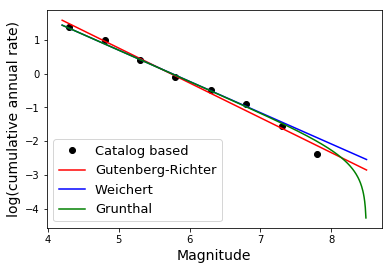

In [224]:
plt.plot(M,np.log10(N_norm_cum), 'ko', label = 'Catalog based') # catalog based
plt.plot(x2,y2,'-r', label = 'Gutenberg-Richter') # Gutenberg-Richter
plt.plot(x2,np.log10(weichert_predicted_rate), 'b', label = 'Weichert') # Weichert
plt.plot(x2,np.log10(grunthal_predicted_rate), 'g', label = 'Grunthal') # Grunthal
plt.legend(fontsize=13)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('log(cumulative annual rate)', fontsize=14, rotation=90)

Text(0,0.5,'Annual rate')

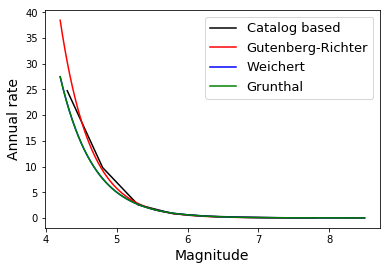

In [225]:
plt.plot(M,N_norm_cum, 'k', label = 'Catalog based')
plt.plot(x2,10**y2,'-r', label = 'Gutenberg-Richter')
plt.plot(x2,weichert_predicted_rate, 'b', label = 'Weichert')
plt.plot(x2,grunthal_predicted_rate, 'g', label = 'Grunthal')
plt.legend(fontsize=13)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Annual rate', fontsize=14, rotation=90)

Text(0,0.5,'Annual rate')

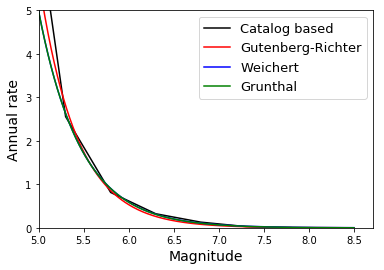

In [226]:
plt.plot(M,N_norm_cum, 'k', label = 'Catalog based')
plt.plot(x2,10**y2,'-r', label = 'Gutenberg-Richter')
plt.plot(x2,weichert_predicted_rate, 'b', label = 'Weichert')
plt.plot(x2,grunthal_predicted_rate, 'g', label = 'Grunthal')
plt.ylim(ymin = 0, ymax = 5)
plt.xlim(xmin = 5)
plt.legend(fontsize=13)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Annual rate', fontsize=14, rotation=90)

Text(0,0.5,'Annual rate')

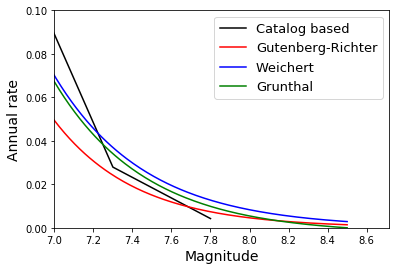

In [228]:
plt.plot(M,N_norm_cum, 'k', label = 'Catalog based')
plt.plot(x2,10**y2,'-r', label = 'Gutenberg-Richter')
plt.plot(x2,weichert_predicted_rate, 'b', label = 'Weichert')
plt.plot(x2,grunthal_predicted_rate, 'g', label = 'Grunthal')
plt.ylim(ymin = 0, ymax = 0.1)
plt.xlim(xmin = 7)
plt.legend(fontsize=13)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Annual rate', fontsize=14, rotation=90)

In [230]:
(9.79 + 2.56)/2

6.175

### nondeclustered recurrence parameters

In [231]:
M = [3.8, 4.3, 4.8, 5.3, 5.8, 6.3, 6.8, 7.3, 7.8]
cent_M = np.array([4, 4.5, 5, 5.5, 6, 6.5, 7, 7.5, 8])
comp_times = np.array([1969, 1967, 1959, 1929, 1909, 1893, 1595, 1500, 1300])
duration = 2006 - comp_times + 1

In [232]:
nondeclustered_complete = pd.read_table('earthquakes/nondeclustered_complete.csv', sep = ',', na_values = ' ')

In [233]:
N = np.zeros(len(M))
for i in range(len(cent_M)):
    N[i] = len(nondeclustered_complete[(nondeclustered_complete['Mw '] > (3.75 + i*0.5)) 
                                    & (nondeclustered_complete['Mw '] < (4.25 + i*0.5))])

In [235]:
N[0]

3752.0

In [236]:
beta = 1.5 # initial estimation of beta

while True:
    snm = np.sum(N*cent_M)
    ncount = np.sum(N)
    stmex = np.sum(duration*cent_M*np.exp(-beta*cent_M))
    sumtex = np.sum(duration*np.exp(-beta*cent_M))
    stm2x = np.sum(duration*cent_M*cent_M*np.exp(-beta*cent_M))
    sumexp = np.sum(np.exp(-beta*cent_M))
    dldb = stmex/sumtex
    d2ldb2 = ncount*(dldb**2 - stm2x/sumtex)
    dldb = dldb*ncount - snm
    betl = beta
    beta = beta - dldb/d2ldb2
    if np.abs(beta - betl)<0.0001:
        break

stdv = np.sqrt(-1/d2ldb2) # standard deviation of beta
b = beta/np.log(10)
stdb = stdv/np.log(10) # standard deviation of b
fngtmo = ncount*sumexp/sumtex
fn5 = fngtmo*np.exp(-beta*(5 - (cent_M[0] - 0.25))) # annual rate of earthquakes with magnitude M >= 5
fn0 = fngtmo*np.exp(beta*(cent_M[0] - 0.25)) # annual rate of all the earthquakes
stdvfn5 = fn5/np.sqrt(ncount) # standard deviation of annual rate of earthquakes with magnitude M >= 5

In [237]:
beta

2.1090432161929118

In [238]:
b

0.91594583088806847

In [239]:
fn5

15.756933299503608

In [240]:
mn = np.min(M) - 0.1
mx = 8.5
x2 = np.linspace(mn,mx,500)
weichert_predicted_rate = fngtmo*np.exp(-beta*(x2 - (cent_M[0] - 0.25)))

In [241]:
N_normalized = N/duration # calculation of annual earthquake rate for each magnitude increment
N_norm_cum = np.zeros(len(N_normalized))
N_norm_cum[8] = N_normalized[8]
for i in range(len(N_norm_cum)-1):
    N_norm_cum[7-i] = N_normalized[7-i] + N_norm_cum[8-i]

In [242]:
gradient1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(M,np.log10(N_norm_cum))
y2=gradient1*x2+intercept1

In [243]:
-gradient1

1.1790136478885522

In [244]:
10**(gradient1*5 + intercept1)

12.035476091468102

In [245]:
r_value1**2

0.99312786591999536

In [246]:
-gradient1*np.log(10)

2.7147792500647112

In [247]:
N_norm_cum 

array([  2.25930168e+02,   1.27193325e+02,   2.24683255e+01,
         4.19749216e+00,   1.06928703e+00,   3.65205397e-01,
         1.37135221e-01,   2.79119205e-02,   4.24328147e-03])

In [248]:
fn375 = fngtmo*np.exp(-beta*(3.75 - (cent_M[0] - 0.25)))
grunthal_predicted_rate = fn375*(1 - (1 - np.exp(-beta*(x2 - cent_M[0] + 0.25)))/
                               (1 - np.exp(-beta*(8.5 - cent_M[0] + 0.25))))

/Users/sharon/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.


Text(0,0.5,'log(cumulative annual rate)')

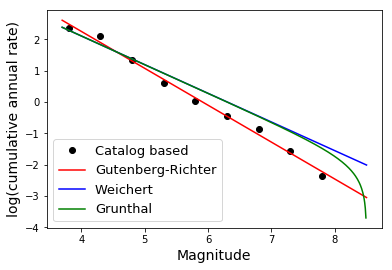

In [249]:
plt.plot(M,np.log10(N_norm_cum), 'ko', label = 'Catalog based') # catalog based
plt.plot(x2,y2,'-r', label = 'Gutenberg-Richter') # Gutenberg-Richter
plt.plot(x2,np.log10(weichert_predicted_rate), 'b', label = 'Weichert') # Weichert
plt.plot(x2,np.log10(grunthal_predicted_rate), 'g', label = 'Grunthal') # Grunthal
plt.legend(fontsize=13)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('log(cumulative annual rate)', fontsize=14, rotation=90)

Text(0,0.5,'Annual rate')

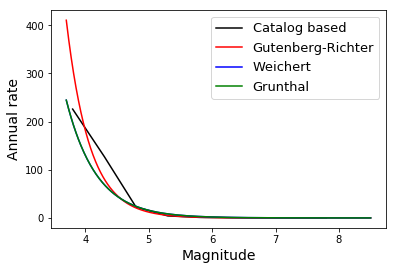

In [250]:
plt.plot(M,N_norm_cum, 'k', label = 'Catalog based')
plt.plot(x2,10**y2,'-r', label = 'Gutenberg-Richter')
plt.plot(x2,weichert_predicted_rate, 'b', label = 'Weichert')
plt.plot(x2,grunthal_predicted_rate, 'g', label = 'Grunthal')
plt.legend(fontsize=13)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Annual rate', fontsize=14, rotation=90)

Text(0,0.5,'Annual rate')

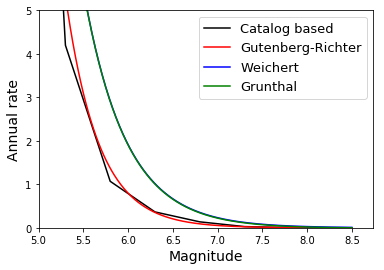

In [251]:
plt.plot(M,N_norm_cum, 'k', label = 'Catalog based')
plt.plot(x2,10**y2,'-r', label = 'Gutenberg-Richter')
plt.plot(x2,weichert_predicted_rate, 'b', label = 'Weichert')
plt.plot(x2,grunthal_predicted_rate, 'g', label = 'Grunthal')
plt.ylim(ymin = 0, ymax = 5)
plt.xlim(xmin = 5)
plt.legend(fontsize=13)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Annual rate', fontsize=14, rotation=90)

Text(0,0.5,'Annual rate')

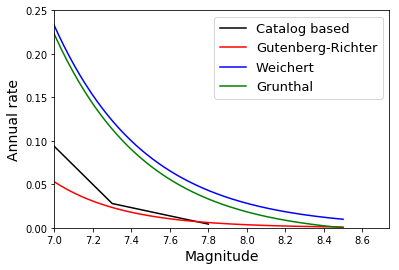

In [254]:
plt.plot(M,N_norm_cum, 'k', label = 'Catalog based')
plt.plot(x2,10**y2,'-r', label = 'Gutenberg-Richter')
plt.plot(x2,weichert_predicted_rate, 'b', label = 'Weichert')
plt.plot(x2,grunthal_predicted_rate, 'g', label = 'Grunthal')
plt.ylim(ymin = 0, ymax = 0.25)
plt.xlim(xmin = 7)
plt.legend(fontsize=13)
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Annual rate', fontsize=14, rotation=90)

# Depth

In [255]:
declustered_complete

,Unnamed: 0,year,month,day,hour,minute,latitude,longitude,depth,intensity,M_orig,type,Mw,Mw_err,reference
0,76,1303,8,8,6,,35.00,27.00,,10,8.0,w,8.0,,Pdo07
1,232,1508,5,29,,,35.05,25.70,,10,7.5,w,7.5,0.35,Pap
2,320,1604,,,,,35.80,25.20,,7,7.0,w,7.0,0.5,Pap
3,325,1609,4,,,,36.40,28.33,,9,7.2,w,7.2,,Pdo07
4,330,1612,11,8,,,35.50,25.20,,8,7.0,w,7.0,0.5,Pap
5,355,1630,3,10,9,,35.00,23.70,,9,7.3,w,7.3,0.5,Pap
6,362,1633,11,5,,,37.70,20.80,,9,7.0,w,7.0,0.5,Pap
7,367,1636,9,30,,,38.10,20.30,,9,7.2,w,7.2,0.35,Pap
8,373,1642,5,30,,,36.80,21.70,,8,6.8,w,6.8,0.5,Pap
9,384,1650,10,9,,,36.50,25.50,,8,7.0,w,7.0,0.5,Pap


In [256]:
depth = declustered_complete['depth'].values

In [257]:
depth

array(['     ', '     ', '     ', ..., '   10', '   34', '   41'], dtype=object)

In [258]:
depth = pd.to_numeric(depth, errors = 'coerce')

In [259]:
depth

array([ nan,  nan,  nan, ...,  10.,  34.,  41.])

(array([ 176.,  189.,  175.,   98.,   45.,   26.,   10.,   11.,   15.,    1.]),
 array([   5. ,   23.4,   41.8,   60.2,   78.6,   97. ,  115.4,  133.8,
         152.2,  170.6,  189. ]),
 <a list of 10 Patch objects>)

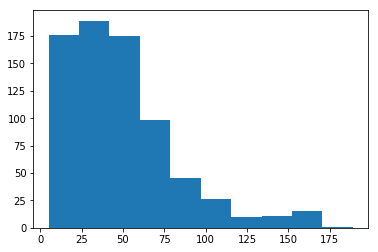

In [262]:
plt.hist(depth[~np.isnan(depth)]) 

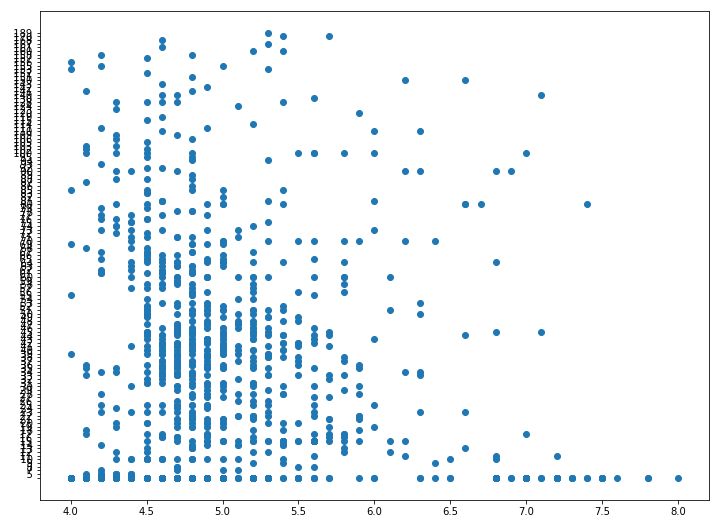

In [284]:
fig = plt.figure(figsize = (12, 9))
ax = fig.add_subplot(1, 1, 1)
plt.scatter(declustered_complete['Mw '], declustered_complete['depth'])
#ax.locator_params(nbins=10, axis='y')

In [285]:
highMw = declustered_complete[declustered_complete['Mw '] > 6.45]

In [286]:
d = highMw ['depth'].values

In [287]:
d = pd.to_numeric(d, errors = 'coerce')

In [288]:
len(d)

67

(array([ 7.,  0.,  3.,  1.,  0.,  6.,  1.,  0.,  0.,  2.]),
 array([  10.,   24.,   38.,   52.,   66.,   80.,   94.,  108.,  122.,
         136.,  150.]),
 <a list of 10 Patch objects>)

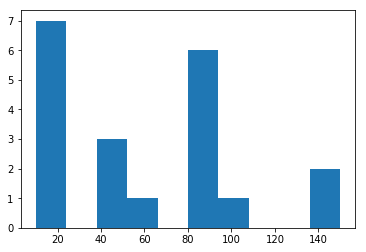

In [289]:
plt.hist(d[~np.isnan(d)]) 

# Synthetic catalog

In [302]:
zoneIII = (100000/2324 + 100000/1466 + 100000/925 + 100000/584 + 100000/368 + 100000/232 + 100000/147 + 100000/93
           + 100000/58 + 100000/37 + 100000/23)

In [304]:
zoneII = (100000/973 + 100000/614 + 100000/387 + 100000/244 + 100000/154 + 100000/97 + 100000/61 + 100000/39) 

In [308]:
zoneII + zoneIII + zoneI

21946.397653178938

In [307]:
zoneI = (100000/1895 + 100000/1196 + 100000/755 + 100000/476 + 100000/300 + 100000/190 + 100000/120 + 100000/75) 

In [309]:
cent_M[0]

4.0

In [314]:
m = np.array([4.4 + 0.2*i for i in range(0, 21)])

In [315]:
m

array([ 4.4,  4.6,  4.8,  5. ,  5.2,  5.4,  5.6,  5.8,  6. ,  6.2,  6.4,
        6.6,  6.8,  7. ,  7.2,  7.4,  7.6,  7.8,  8. ,  8.2,  8.4])

In [326]:
FM = (1 - 10**(-0.93*(m - 4.25)))/(1 - 10**(-0.93*(8.5 - 4.25)))

In [327]:
FM

array([ 0.27476017,  0.527452  ,  0.69211318,  0.79941107,  0.86932943,
        0.91489021,  0.94457891,  0.96392491,  0.97653132,  0.98474601,
        0.99009893,  0.99358705,  0.99586001,  0.99734113,  0.99830627,
        0.99893519,  0.99934501,  0.99961206,  0.99978607,  0.99989947,
        0.99997336])

In [328]:
PM = np.zeros(len(FM))

In [329]:
for i in range(len(FM)-1):
               PM[i] = FM[i+1] - FM[i]

In [330]:
PM

array([  2.52691831e-01,   1.64661172e-01,   1.07297895e-01,
         6.99183550e-02,   4.55607854e-02,   2.96887014e-02,
         1.93460008e-02,   1.26064035e-02,   8.21469044e-03,
         5.35292554e-03,   3.48811827e-03,   2.27295691e-03,
         1.48112326e-03,   9.65141971e-04,   6.28913913e-04,
         4.09818163e-04,   2.67049151e-04,   1.74016810e-04,
         1.13394294e-04,   7.38909418e-05,   0.00000000e+00])

Text(0,0.5,'Discrete probability')

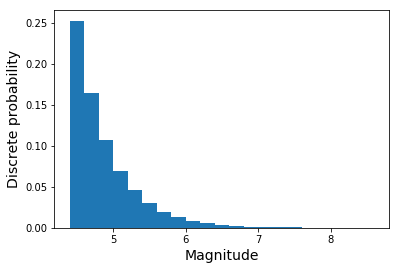

In [336]:
plt.bar(m, PM, 0.2, align='edge')
plt.xlabel('Magnitude', fontsize=14)
plt.ylabel('Discrete probability', fontsize=14, rotation=90)